# Salary_Satisfaction_Analysis

Objective:
1. Understand how to clean and prepare data for machine learning, including working with multiple
data types, incomplete data, and categorical data. Perform data standardization/normalization, if
necessary, prior to modeling.
2. Understand how to apply machine learning algorithms (ordinal logistic regression) to the task of
classification.
3. Improve on skills and competencies required to compare performance of classification algorithms,
including application of performance measurements, and visualization of comparisons.
4. Understand how to improve the performance of your model.
5. Improve on skill and competencies required to collate and present domain specific, evidence-based
insights

## Preparation step 1 - Import Packages and Properties setting

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import GradientBoostingClassifier
import seaborn as sns
from scipy import stats
from scipy.stats import norm
import matplotlib.gridspec as gridspec
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix

# Kill warning
warnings.simplefilter("ignore")
# Set relative path
print (os.path.abspath('.'))
# Properties setting
plt.style.use('ggplot')

e:\OneDrive - University of Toronto\U of T\1 2022 Fall\MIE1624H Introduction to Data Science and Analytics\Assignment\Assignment 2


## Preparation step 2 - Check Original Data

### Preparation step 2.1 - Load Original Data

The dataset provided (kaggle_survey_2022_responses.csv) contains the survey results provided by Kaggle. 

The survey results from 23997 participants are shown in 296 columns, representing survey questions. 

Not all questions are answered by each participant, and responses contain various data types. 

In the dataset, column ‘Q29’ “What is your current yearly compensation (approximate $USD)?” contains the ordinary categorical target variable.

In [2]:
# load original data
data_ori = pd.read_csv(r'kaggle_survey_2022_responses.csv')
data_ori.head(1)

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_3,Q44_4,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...


### Preparation step 2.2 - Check Original Data

In [3]:
# check null value in the column
temp_ori = data_ori[:][1:].isnull().any()
colnull_ori = pd.DataFrame(data={'colname': temp_ori.index,'isnulls':temp_ori.values}) # no nulls = False
print('Not null colmnes:', colnull_ori.loc[colnull_ori.isnulls == False,'colname'].tolist()) # column name with no nulls
# row and col of data
print('\nData shape', data_ori.shape)

Not null colmnes: ['Duration (in seconds)', 'Q2', 'Q3', 'Q4', 'Q5']

Data shape (23998, 296)


## Preparation step 3 - Check clean data

### Preparation step 3.1 - Load clean data

The original data (kaggle_survey_2022_responses.csv) has been transformed to clean_kaggle_data_2022.csv as per the code given in KaggleSalary_DataSet.ipynb.  rows with the null values of salaries have been dropped.

In addition, two columns (‘Q29_Encoded’ and ‘Q29_buckets’) have been added at the end. 

Column ‘Q29_buckets’ (Target Variable for Assignment 2) has been obtained by combining some salary buckets in the column ‘Q29’. 

Column ‘Q29_Encoded’ has been obtained by label encoding the column ‘Q29_buckets’.

In [4]:
# clean_kaggle_data
data_clean = pd.read_csv(r'clean_kaggle_data_2022.csv')
print(data_clean.info())
print('\nData shape', data_clean.shape) # row and col of data
data_clean.head(1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8137 entries, 0 to 8136
Columns: 298 entries, Duration (in seconds) to Q29_buckets
dtypes: float64(1), object(297)
memory usage: 18.5+ MB
None

Data shape (8137, 298)


,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,NaN,NaN


### Preparation step 3.2 - Check clean data

In [5]:
# check null and not nul value in column
temp_clean = data_clean[:][1:].isnull().any()
colnull_Clean = pd.DataFrame(data={'colname': temp_clean.index,'isnulls':temp_clean.values}) # no nulls = False
notnull_clean_col_name = colnull_Clean.loc[colnull_Clean.isnulls == False,'colname'].tolist() # not null column name in clean data
null_clean_col_name = colnull_Clean.loc[colnull_Clean.isnulls == True,'colname'].tolist() # has null column name in clean data
print('Not null columns:', notnull_clean_col_name)
print('\nHas null columns:', null_clean_col_name)

Not null columns: ['Duration (in seconds)', 'Q2', 'Q3', 'Q4', 'Q5', 'Q8', 'Q11', 'Q23', 'Q24', 'Q25', 'Q26', 'Q27', 'Q29', 'Q29_Encoded', 'Q29_buckets']

Has null columns: ['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_11', 'Q6_12', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5', 'Q7_6', 'Q7_7', 'Q9', 'Q10_1', 'Q10_2', 'Q10_3', 'Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_12', 'Q12_13', 'Q12_14', 'Q12_15', 'Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_11', 'Q13_12', 'Q13_13', 'Q13_14', 'Q14_1', 'Q14_2', 'Q14_3', 'Q14_4', 'Q14_5', 'Q14_6', 'Q14_7', 'Q14_8', 'Q14_9', 'Q14_10', 'Q14_11', 'Q14_12', 'Q14_13', 'Q14_14', 'Q14_15', 'Q14_16', 'Q15_1', 'Q15_2', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_6', 'Q15_7', 'Q15_8', 'Q15_9', 'Q15_10', 'Q15_11', 'Q15_12', 'Q15_13', 'Q15_14', 'Q15_15', 'Q16', 'Q17_1', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_5', 'Q17_6', 'Q17_7', 'Q17_

In [6]:
# check unique value in notnull column
print('Column || Column Meaning || Unique Value in Column || Count Null')
print('-' * 200)
for col in notnull_clean_col_name:
    print(col, ' || ', data_clean[col][0], ' || ', data_clean[:][1:][col].unique(), ' || ', data_clean[col][1:].isnull().sum())
    print('-' * 200)

Column || Column Meaning || Unique Value in Column || Count Null
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Duration (in seconds)  ||  Duration (in seconds)  ||  ['851' '501' '787' ... 8570 38795 1651]  ||  0
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Q2  ||  What is your age (# years)?  ||  ['55-59' '30-34' '70+' '40-44' '50-54' '25-29' '60-69' '35-39' '22-24'
 '45-49' '18-21']  ||  0
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Q3  ||  What is your gender? - Selected Choice  ||  ['Man' 'Woman' 'Prefer not to say' 'Prefer

In [7]:
# check unique value in null column
print('Column || Column Meaning || Unique Value in Column || Count Null')
print('-' * 200)
for col in null_clean_col_name:
    print(col, ' || ', data_clean[col][0], ' || ', data_clean[:][1:][col].unique(), ' || ', data_clean[col][1:].isnull().sum())
    print('-' * 200)

Column || Column Meaning || Unique Value in Column || Count Null
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Q6_1  ||  On which platforms have you begun or completed data science courses? (Select all that apply) - Selected Choice - Coursera  ||  ['Coursera' nan]  ||  4374
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Q6_2  ||  On which platforms have you begun or completed data science courses? (Select all that apply) - Selected Choice - edX  ||  [nan 'edX']  ||  7018
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Q6_3  ||  On w

## 1.Data cleaning

For the data cleaning step, handle missing values however you see fit and justify your approach. 

Provide some insight on why you think the values are missing and how your approach might impact the overall analysis. 

Suggestions include filling the missing values with a certain value (e.g. mode for categorical data) and completely removing the features with missing values. 

Another method could be filling them with a separate value showing missingness, e.g., “unknown”. 

Secondly, convert categorical data into numerical data by encoding and explain why you used this particular encoding method.

### 1.1 Approach to handle missing value

- Approach

In [8]:
print(
'''
Approach to handle missing vlaue: 
- By checking the data properties and according to the purpose of the task 'what a survey respondents current yearly compensation bucket is', 
  the missing value handle approach is designed.
    1. This is a survey results provided by Kaggle which not all question are responsed by participant, the rows and col of
       clean data are {} x {}, if the missing feature value is more than half of it ({}), the coreesponding feature column is 
       removed.
    2. Then manually remove features that are useless. 
    3. Fill NaN with 'unknown' and rename column
'''.format(data_clean.shape[0], data_clean.shape[1], int(data_clean.shape[0]*0.5)))


Approach to handle missing vlaue: 
- By checking the data properties and according to the purpose of the task 'what a survey respondents current yearly compensation bucket is', 
  the missing value handle approach is designed.
    1. This is a survey results provided by Kaggle which not all question are responsed by participant, the rows and col of
       clean data are 8137 x 298, if the missing feature value is more than half of it (4068), the coreesponding feature column is 
       removed.
    2. Then manually remove features that are useless. 
    3. Fill NaN with 'unknown' and rename column



- Remove features with more missing values than clean data rows in clean data

In [9]:
# copy dataset
data_clean_copy = data_clean.copy(deep=True)

# remove feature 1 - feature dropping by: missing count >== half of data row
drop_feat_list = [] # list to store drop feature name
for col in data_clean.columns:
    if data_clean[col][1:].isnull().sum() >= int(data_clean.shape[0]*0.5):
        drop_feat_list.append(col) # store drop feature name
        data_clean_copy.drop(columns = col, inplace=True) # drop feature

# remove feature 2 - other useless feature need to drop
    # Q7 What products or platforms did you find to be most helpful when you first started studying data science?
    # Q12 What programming languages do you use on a regular basis?
    # Q13 Which of the following integrated development environments (IDE's) do you use on a regular basis?
    # Q15 Do you use any of the following data visualization libraries on a regular basis?
    # Q17 Which of the following machine learning frameworks do you use on a regular basis?
    # Q18 Which of the following ML algorithms do you use on a regular basis?
    # Q28 Select any activities that make up an important part of your role at work
    # Q44 Who/what are your favorite media sources that report on data science topics?
drop_col = ['Duration (in seconds)', 'Q5', 'Q7_2', 'Q7_4', 'Q7_5', 'Q12_1', 'Q13_11', 'Q15_1', 'Q15_2', 'Q17_1', 'Q18_1', 'Q28_1', 'Q44_4', 'Q44_6']
data_clean_copy.drop(columns = drop_col, inplace=True)

# for print insight
# remian features name
remain_feat_name = data_clean_copy.columns.tolist()[:-2]
remain_feat_name.remove('Q29')
# check null value in the column
temp_clean_cpy = data_clean_copy[:][1:].isnull().any()
colnull_clean_cpy = pd.DataFrame(data={'colname': temp_clean_cpy.index,'isnulls':temp_clean_cpy.values}) # no nulls = False
notnull_col_name_clean_cpy = colnull_clean_cpy.loc[colnull_clean_cpy.isnulls == False,'colname'].tolist()
null_col_name_clean_cpy = colnull_clean_cpy.loc[colnull_clean_cpy.isnulls == True,'colname'].tolist()

- Insight: why you think the values are missing, how your approach might impact the overall analysis

In [10]:
# Insight
print(
'''
Insight:
- This approach can improve the overall analysis since the removed features are least important and contain too many missing value.

- dropped {} feature:
    - {}
    - {}

- remained {} features:
    - {}

- where,
- {} features not null: {}
- {} features have null value: {}
'''.format(len(drop_feat_list)+len(drop_col),
           drop_feat_list,
           drop_col,
           len(remain_feat_name),
           remain_feat_name,
           len(notnull_col_name_clean_cpy[:-3]), notnull_col_name_clean_cpy[:-3],
           len(null_col_name_clean_cpy), null_col_name_clean_cpy
))


Insight:
- This approach can improve the overall analysis since the removed features are least important and contain too many missing value.

- dropped 281 feature:
    - ['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_11', 'Q6_12', 'Q7_1', 'Q7_3', 'Q7_6', 'Q7_7', 'Q10_1', 'Q10_2', 'Q10_3', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_12', 'Q12_13', 'Q12_14', 'Q12_15', 'Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_12', 'Q13_13', 'Q13_14', 'Q14_1', 'Q14_2', 'Q14_3', 'Q14_4', 'Q14_5', 'Q14_6', 'Q14_7', 'Q14_8', 'Q14_9', 'Q14_10', 'Q14_11', 'Q14_12', 'Q14_13', 'Q14_14', 'Q14_15', 'Q14_16', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_6', 'Q15_7', 'Q15_8', 'Q15_9', 'Q15_10', 'Q15_11', 'Q15_12', 'Q15_13', 'Q15_14', 'Q15_15', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_5', 'Q17_6', 'Q17_7', 'Q17_8', 'Q17_9', 'Q17_10', 'Q17_11', 'Q17_12', 'Q17_13', 'Q17_14', 'Q17_15', 'Q18_2', '

- Check column meaning and missing values count in remain feature dataframe

In [11]:
# check column meaning and missing values count in remain feature dataframe
for col in data_clean_copy.columns:
    print(col, ' || ', data_clean_copy[col][0], '|| Missing count:', data_clean_copy[col][1:].isnull().sum())

Q2  ||  What is your age (# years)? || Missing count: 0
Q3  ||  What is your gender? - Selected Choice || Missing count: 0
Q4  ||  In which country do you currently reside? || Missing count: 0
Q8  ||  What is the highest level of formal education that you have attained or plan to attain within the next 2 years? || Missing count: 0
Q9  ||  Have you ever published any academic research (papers, preprints, conference proceedings, etc)? || Missing count: 2941
Q11  ||  For how many years have you been writing code and/or programming? || Missing count: 0
Q16  ||  For how many years have you used machine learning methods? || Missing count: 684
Q23  ||  Select the title most similar to your current role (or most recent title if retired): - Selected Choice || Missing count: 0
Q24  ||  In what industry is your current employer/contract (or your most recent employer if retired)? - Selected Choice || Missing count: 0
Q25  ||  What is the size of the company where you are employed? || Missing count

- Fill NaN with 'unknown' and rename columns

In [12]:
fill_na_clean_data = data_clean_copy[1:]
# Fill NaN with 'unknown'
fill_na_clean_data.fillna('unknown', inplace=True)
# rename column
fill_na_clean_data.rename(columns = {'Q2':'Age',
                                     'Q3':'Gender',
                                     'Q4':'Country',
                                     'Q8':'Education',
                                     'Q9':'Publish',
                                     'Q11':'Coding_years',
                                     'Q16':'use_ML_years',
                                     'Q23':'Title',
                                     'Q24':'Industry',
                                     'Q25':'Company_size',
                                     'Q26':'Individuals_company_DS',
                                     'Q27':'Business_related2ML',
                                     'Q29':'Salary',
                                     'Q30':'Spent_on_ML_CCS',
                                     'Q43':'Times_using_TPU',
                                     'Q29_Encoded':'Salary_Encoded',
                                     'Q29_buckets':'Salary_Bucket'
                                     },
                                     inplace=True)
fill_na_clean_data.head(1)

,Age,Gender,Country,Education,Publish,Coding_years,use_ML_years,Title,Industry,Company_size,Individuals_company_DS,Business_related2ML,Salary,Spent_on_ML_CCS,Times_using_TPU,Salary_Encoded,Salary_Bucket
1,55-59,Man,France,Some college/university study without earning ...,unknown,10-20 years,1-2 years,Data Scientist,Online Service/Internet-based Services,0-49 employees,1-2,"We recently started using ML methods (i.e., mo...","25,000-29,999","$1000-$9,999",2-5 times,2.0,"20,000-29,999"


### 1.2 Categotical data encoding -> numerical data

In [13]:
# Q29 bucket table:	                                                # Q29 encode table:
# salary_buckets = {	                                            # salary_encode = {
#     '$0-999': '0-9,999',	                                        #     '$0-999': 0,
#     '1,000-1,999': '0-9,999',	                                    #     '1,000-1,999': 0,
#     '2,000-2,999': '0-9,999',	                                    #     '2,000-2,999': 0,
#     '3,000-3,999': '0-9,999',	                                    #     '3,000-3,999': 0,
#     '4,000-4,999': '0-9,999',	                                    #     '4,000-4,999': 0,
#     '5,000-7,499': '0-9,999',	                                    #     '5,000-7,499': 0,
#     '7,500-9,999': '0-9,999',	                                    #     '7,500-9,999': 0,
#     '10,000-14,999': '10,000-19,999',	                            #     '10,000-14,999': 1,
#     '15,000-19,999': '10,000-19,999',	                            #     '15,000-19,999': 1,
#     '20,000-24,999': '20,000-29,999',	                            #     '20,000-24,999': 2,
#     '25,000-29,999': '20,000-29,999',	                            #     '25,000-29,999': 2,
#     '30,000-39,999': '30,000-39,999',	                            #     '30,000-39,999': 3,
#     '40,000-49,999': '40,000-49,999',	                            #     '40,000-49,999': 4,
#     '50,000-59,999': '50,000-59,999',	                            #     '50,000-59,999': 5,
#     '60,000-69,999': '60,000-69,999',	                            #     '60,000-69,999': 6,
#     '70,000-79,999': '70,000-79,999',	                            #     '70,000-79,999': 7,
#     '80,000-89,999': '80,000-89,999',	                            #     '80,000-89,999': 8,
#     '90,000-99,999': '90,000-99,999',	                            #     '90,000-99,999': 9,
#     '100,000-124,999':'100,000-124,999',	                        #     '100,000-124,999':10,
#     '125,000-149,999':'125,000-149,999',	                        #     '125,000-149,999':11,
#     '150,000-199,999':'150,000-199,999',	                        #     '150,000-199,999':12,
#     '200,000-249,999':'200,000-299,999',	                        #     '200,000-249,999':13,
#     '250,000-299,999':'200,000-299,999',	                        #     '250,000-299,999':13,
#     '300,000-499,999':'>300,000',	                                #     '300,000-499,999':14,
#     '$500,000-999,999':'>300,000',	                            #     '$500,000-999,999':14,
#     '>$1,000,000':'>300,000'}	                                    #     '>$1,000,000':14}


- Copy dataframe

In [14]:
# copy dataframe
encode_df = fill_na_clean_data.copy(deep=True).reset_index()
encode_df.head(1)

,index,Age,Gender,Country,Education,Publish,Coding_years,use_ML_years,Title,Industry,Company_size,Individuals_company_DS,Business_related2ML,Salary,Spent_on_ML_CCS,Times_using_TPU,Salary_Encoded,Salary_Bucket
0,1,55-59,Man,France,Some college/university study without earning ...,unknown,10-20 years,1-2 years,Data Scientist,Online Service/Internet-based Services,0-49 employees,1-2,"We recently started using ML methods (i.e., mo...","25,000-29,999","$1000-$9,999",2-5 times,2.0,"20,000-29,999"


- Check distribution of each categorical feature

In [15]:
# Check distribution of each group
for col in encode_df.columns:
    print('\n---------',col,'---------')
    print(encode_df[col].value_counts())


--------- index ---------
2049    1
6814    1
4791    1
6838    1
693     1
       ..
1346    1
7489    1
5440    1
3387    1
2047    1
Name: index, Length: 8136, dtype: int64

--------- Age ---------
25-29    1604
30-34    1430
35-39    1207
40-44    1037
22-24     743
45-49     701
50-54     567
55-59     359
60-69     341
18-21      83
70+        64
Name: Age, dtype: int64

--------- Gender ---------
Man                        6635
Woman                      1382
Prefer not to say            89
Nonbinary                    22
Prefer to self-describe       8
Name: Gender, dtype: int64

--------- Country ---------
India                                                   2328
United States of America                                1434
Other                                                    511
Japan                                                    333
Brazil                                                   292
Nigeria                                                  159
Spain     

In [16]:
# plt.bar(encode_df['Salary_Bucket'].value_counts().index, encode_df['Salary_Bucket'].value_counts())
# plt.xticks(rotation=20)

- Constructing bucket table for categorical data

Age (Q2), Gender (Q3), Country (Q4), Education (Q8), 

Publish (Q9), Coding_years (Q11), use_ML_years (Q16), Title (Q23),

Industry (Q24), Company_size (Q25), Individuals_company_DS (Q26),

Business_related2ML (Q27), Spent_on_ML_CCS (Q30), Times_using_TPU (Q43)

In [17]:
# Categorical data bucket table
# Age
Age_Buckets = {'18-21': '18-24',
               '22-24': '18-24',
               '25-29': '25-29',
               '30-34': '30-34',
               '35-39': '35-39',
               '40-44': '40-44',
               '45-49': '45-54',
               '50-54': '45-54',
               '55-59': '55+',
               '60-69': '55+',
               '70+': '55+'}
# Gender
Gender_Buckets = {'Man': 'Man',
                  'Woman': 'Woman',
                  'Prefer not to say': 'Other',
                  'Nonbinary': 'Other',
                  'Prefer to self-describe': 'Other'}
# Country
Country_Buckets = {'India': 'count>2000',
                   'Japan': 'count>200',
                   'South Korea': 'count>100',
                   'Pakistan': 'count>100',
                   'Taiwan': 'count>100',
                   'China': 'count>100',
                   'Indonesia': 'count>100',
                   'Russia': 'count<100',
                   'Viet Nam': 'count<100',
                   'Thailand': 'count<100',
                   'United Arab Emirates': 'count<100',
                   'Philippines': 'count<100',
                   'Bangladesh': 'count<100',
                   'Israel': 'count<100',
                   'Saudi Arabia': 'count<100',
                   'Singapore': 'count<100',
                   'Malaysia': 'count<100',
                   'Hong Kong (S.A.R.)': 'count<100',
                   'Sri Lanka': 'count<100',
                   'Nepal': 'count<100',
                   'United States of America': 'count>1000',
                   'Mexico': 'count>100',
                   'Canada': 'count>100',
                   'Brazil': 'count>200',
                   'Colombia': 'count<100',
                   'Argentina': 'count<100',
                   'Chile': 'count<100',
                   'Peru': 'count<100',
                   'South Africa': 'count<100',
                   'Ecuador': 'count<100',
                   'United Kingdom of Great Britain and Northern Ireland': 'count>100',
                   'Spain': 'count>100',
                   'France': 'count>100',
                   'Italy': 'count<100',
                   'Poland': 'count<100',
                   'Netherlands': 'count<100',
                   'Germany': 'count<100',
                   'Portugal': 'count<100',
                   'Belgium': 'count<100',
                   'Ireland': 'count<100',
                   'Czech Republic': 'count<100',
                   'Ukraine': 'count<100',
                   'Romania': 'count<100',
                   'Nigeria': 'count>100',
                   'Egypt': 'count<100',
                   'Kenya': 'count<100',
                   'Morocco': 'count<100',
                   'Ethiopia': 'count<100',
                   'Ghana': 'count<100',
                   'Tunisia': 'count<100',
                   'Cameroon': 'count<100',
                   'Zimbabwe': 'count<100',
                   'Algeria': 'count<100',
                   'Turkey': 'count>100', 
                   'Iran, Islamic Republic of...': 'count<100',
                   'Australia': 'count<100',
                   'Other': 'count>200',
                   'I do not wish to disclose my location': 'count<100'}
# Education
Education_Buckets = {'Master’s degree': 'Master',
                     'Bachelor’s degree': 'Bachelor',
                     'Doctoral degree': 'Doctoral+',
                     'Professional doctorate': 'PostDoc',
                     'I prefer not to answer': 'Unknown',
                     'Some college/university study without earning a bachelor’s degree': 'Other',
                     'No formal education past high school': 'HS'}
# Publish
Publish_Buckets = {'No': 'No',
                   'Yes': 'Yes',
                   'unknown': 'Unknown'}
# Coding_years
Coding_years_Buckets = {'I have never written code': 'Never',
                        '< 1 years': '<1 years',
                        '1-3 years': '<3 years',
                        '3-5 years': '3-5 years',
                        '5-10 years': '5-10 years',
                        '10-20 years': '10-20 years',
                        '20+ years': '20+ years'}
# use_ML_years
use_ML_years_Buckets = {'I do not use machine learning methods': 'Never',
                        'Under 1 year': '<1 years',
                        '1-2 years': '1-2 years',
                        '2-3 years': '2-3 years',
                        '3-4 years': '3-4 years',
                        '4-5 years': '4-5 years',
                        '5-10 years': '5-10 years',
                        '10-20 years': '10-20 years',
                        'unknown': 'Unknown'}
# Title
Title_Buckets = {'Data Analyst (Business, Marketing, Financial, Quantitative, etc)': 'DA',
                 'Data Architect': 'Data',
                 'Software Engineer': 'SE',
                 'Machine Learning/ MLops Engineer': 'ML Engineer',
                 'Engineer (non-software)': 'Engineer',
                 'Data Engineer': 'Data',
                 'Developer Advocate': 'Data',
                 'Manager (Program, Project, Operations, Executive-level, etc)': 'Manager',
                 'Data Administrator': 'Data',
                 'Teacher / professor': 'Academic',
                 'Research Scientist': 'Researcher',
                 'Statistician': 'Data',
                 'Data Scientist': 'DS',
                 'Other': 'Other'}
# Industry
Industry_Buckets = {'Computers/Technology': 'Technology',
                    'Academics/Education': 'Academics',
                    'Accounting/Finance': 'Finance',
                    'Manufacturing/Fabrication': 'Manufacturing',
                    'Medical/Pharmaceutical': 'Medical',
                    'Government/Public Service': 'Government',
                    'Online Service/Internet-based Services': 'Services',
                    'Retail/Sales': 'Sales',
                    'Energy/Mining': 'Energy',
                    'Insurance/Risk Assessment': 'Insurance',
                    'Marketing/CRM': 'Marketing',
                    'Non-profit/Service': 'Other1',
                    'Broadcasting/Communications': 'Other1',
                    'Shipping/Transportation': 'Other1',
                    'Other': 'Other2'}
# Company_size
Company_size_Buckets = {'0-49 employees': '<50',
                        '50-249 employees': '50-249',
                        '250-999 employees': '250-999',
                        '1000-9,999 employees': '1000-9999',
                        '10,000 or more employees': '10000+'}
# Individuals_company_DS
Individuals_company_DS_Buckets ={'0': '0',
                                 '1-2': '1-2',
                                 '3-4': '3-4',
                                 '5-9': '5-9',
                                 '10-14': '10-19',
                                 '15-19': '10-19',
                                 '20+': '20+'}
# Business_related2ML
Business_related2ML_Buckets = {'No (we do not use ML methods)': 'None',
                               'We are exploring ML methods (and may one day put a model into production)': 'Exploring',
                               'We recently started using ML methods (i.e., models in production for less than 2 years)': 'Just start',
                               'We use ML methods for generating insights (but do not put working models into production)': 'Generating insights',
                               'We have well established ML methods (i.e., models in production for more than 2 years)': 'Well-established',
                               'I do not know': 'Unknown'}
# Spent_on_ML_CCS
Spent_on_ML_CCS_Buckets = {'$0 ($USD)': '0',
                           '$1-$99': '1-100',
                           '$100-$999': '100-999',
                           '$1000-$9,999': '1000-9999',
                           '$10,000-$99,999': '10000+',
                           '$100,000 or more ($USD)': '10000+',
                           'unknown': 'Unknown'}
# Times_using_TPU
Times_using_TPU_Buckets = {'Never':'Never',
                           'Once':'1',
                           '2-5 times':'2-5',
                           '6-25 times':'6+',
                           'More than 25 times':'6+',
                           'unknown':'Unknown'}

- Constructing encode table for categorical data

Age (Q2), Gender (Q3), Country (Q4), Education (Q8), 

Publish (Q9), Coding_years (Q11), use_ML_years (Q16), Title (Q23),

Industry (Q24), Company_size (Q25), Individuals_company_DS (Q26),

Business_related2ML (Q27), Spent_on_ML_CCS (Q30), Times_using_TPU (Q43)


In [18]:
# Categorical data encode table
# Age
Age_Encoded = {'18-21': 0,
              '22-24': 0,
              '25-29': 1,
              '30-34': 2,
              '35-39': 3,
              '40-44': 4,
              '45-49': 5,
              '50-54': 5,
              '55-59': 6,
              '60-69': 6,
              '70+': 6}
# Gender
Gender_Encoded = {'Man': 0,
                 'Woman': 1,
                 'Prefer not to say': 2,
                 'Nonbinary': 2,
                 'Prefer to self-describe': 2}
# Country
Country_Encoded = {'India': 0, 
                   'Japan': 2, 
                   'South Korea': 3, 
                   'Pakistan': 3, 
                   'Taiwan': 3, 
                   'China': 3, 
                   'Indonesia': 3, 
                   'Russia': 4,
                   'Viet Nam': 4,
                   'Thailand': 4,
                   'United Arab Emirates': 4,
                   'Philippines': 4,
                   'Bangladesh': 4,
                   'Israel': 4,
                   'Saudi Arabia': 4,
                   'Singapore': 4,
                   'Malaysia': 4,
                   'Hong Kong (S.A.R.)': 4,
                   'Sri Lanka': 4,
                   'Nepal': 4,
                   'United States of America': 1, 
                   'Mexico': 3, 
                   'Canada': 3, 
                   'Brazil': 2, 
                   'Colombia': 4,
                   'Argentina': 4,
                   'Chile': 4,
                   'Peru': 4,
                   'South Africa': 4,
                   'Ecuador': 4,
                   'United Kingdom of Great Britain and Northern Ireland': 3, #
                   'Spain': 3, 
                   'France': 3, 
                   'Italy': 4,
                   'Poland': 4,
                   'Netherlands': 4,
                   'Germany': 4,
                   'Portugal': 4,
                   'Belgium': 4,
                   'Ireland': 4,
                   'Czech Republic': 4,
                   'Ukraine': 4,
                   'Romania': 4,
                   'Nigeria': 3, 
                   'Egypt': 4,
                   'Kenya': 4,
                   'Morocco': 4,
                   'Ethiopia': 4,
                   'Ghana': 4,
                   'Tunisia': 4,
                   'Cameroon': 4,
                   'Zimbabwe': 4,
                   'Algeria': 4,
                   'Turkey': 3,  
                   'Iran, Islamic Republic of...': 4,
                   'Australia': 4,
                   'Other': 2, 
                   'I do not wish to disclose my location': 4}
# Education
Education_Encoded = {'Master’s degree': 0,
                     'Bachelor’s degree': 1,
                     'Doctoral degree': 2,
                     'Professional doctorate': 3,
                     'I prefer not to answer': 4,
                     'Some college/university study without earning a bachelor’s degree': 5,
                     'No formal education past high school': 6}
# Publish
Publish_Encoded = {'No': 0,
                   'Yes': 1,
                   'unknown': 2}
# Coding_years
Coding_years_Encoded = {'I have never written code': 0,
                        '< 1 years': 1,
                        '1-3 years': 2,
                        '3-5 years': 3,
                        '5-10 years': 4,
                        '10-20 years': 5,
                        '20+ years': 6}
# use_ML_years
use_ML_years_Encoded = {'I do not use machine learning methods': 0,
                        'Under 1 year': 1,
                        '1-2 years': 2,
                        '2-3 years': 3,
                        '3-4 years': 4,
                        '4-5 years': 5,
                        '5-10 years': 6,
                        '10-20 years': 7,
                        'unknown': 8}
# Title
Title_Encoded = {'Data Analyst (Business, Marketing, Financial, Quantitative, etc)': 0,
                 'Data Architect': 1,
                 'Software Engineer': 2,
                 'Machine Learning/ MLops Engineer': 3,
                 'Engineer (non-software)': 4,
                 'Data Engineer': 1,
                 'Developer Advocate': 1,
                 'Manager (Program, Project, Operations, Executive-level, etc)': 5,
                 'Data Administrator': 1,
                 'Teacher / professor': 6,
                 'Research Scientist': 7,
                 'Statistician': 1,
                 'Data Scientist': 8,
                 'Other': 9}
# Industry
Industry_Encoded = {'Computers/Technology': 0,
                    'Academics/Education': 1,
                    'Accounting/Finance': 2,
                    'Manufacturing/Fabrication': 3,
                    'Medical/Pharmaceutical': 4,
                    'Government/Public Service': 5,
                    'Online Service/Internet-based Services': 6,
                    'Retail/Sales': 7,
                    'Energy/Mining': 8,
                    'Insurance/Risk Assessment': 9,
                    'Marketing/CRM': 10,
                    'Non-profit/Service': 11,
                    'Broadcasting/Communications': 11,
                    'Shipping/Transportation': 11,
                    'Other': 12}
# Company_size
Company_size_Encoded = {'0-49 employees': 0,
                        '50-249 employees': 1,
                        '250-999 employees': 2,
                        '1000-9,999 employees': 3,
                        '10,000 or more employees': 4}
# Individuals_company_DS
Individuals_company_DS_Encoded ={'0': 0,
                                 '1-2': 1,
                                 '3-4': 2,
                                 '5-9': 3,
                                 '10-14': 4,
                                 '15-19': 4,
                                 '20+': 5}
# Business_related2ML
Business_related2ML_Encoded = {'No (we do not use ML methods)': 0,
                               'We are exploring ML methods (and may one day put a model into production)': 1,
                               'We recently started using ML methods (i.e., models in production for less than 2 years)': 2,
                               'We use ML methods for generating insights (but do not put working models into production)': 3,
                               'We have well established ML methods (i.e., models in production for more than 2 years)': 4,
                               'I do not know': 5}
# Spent_on_ML_CCS
Spent_on_ML_CCS_Encoded = {'$0 ($USD)': 0,
                           '$1-$99': 1,
                           '$100-$999': 2,
                           '$1000-$9,999': 3,
                           '$10,000-$99,999': 4,
                           '$100,000 or more ($USD)': 4,
                           'unknown': 5}
# Times_using_TPU
Times_using_TPU_Encoded = {'Never': 0,
                           'Once': 1,
                           '2-5 times': 2,
                           '6-25 times': 3,
                           'More than 25 times': 3,
                           'unknown': 4}
# reverse mapping salary bucket for last few sections
salary_rbucket = {0: '0-9,999',
                  1: '10,000-19,999',
                  2: '20,000-29,999', 
                  3: '30,000-39,999',
                  4: '40,000-49,999',
                  5: '50,000-59,999', 
                  6: '60,000-69,999',
                  7: '70,000-79,999',
                  8: '80,000-89,999', 
                  9: '90,000-99,999',
                  10: '100,000-124,999',
                  11: '125,000-149,999', 
                  12: '150,000-199,999', 
                  13: '200,000-299,999',
                  14: '>300,000'}

In [19]:
# encoding type
astype_type = float

- Age (Q2) bucketing and encoding

In [20]:
# Age encoding
encode_df['Age_Encoded'] = encode_df['Age'].map(Age_Encoded)
encode_df['Age_Encoded'] = encode_df['Age_Encoded'].astype(astype_type)
# Age bucket
encode_df['Age_Buckets'] = encode_df['Age'].map(Age_Buckets)
encode_df['Age_Encoded'].unique()

array([6., 2., 4., 5., 1., 3., 0.])

- Gender (Q3) bucketing and encoding

In [21]:
# Gender encoding
encode_df['Gender_Encoded'] = encode_df['Gender'].map(Gender_Encoded)
encode_df['Gender_Encoded'] = encode_df['Gender_Encoded'].astype(astype_type)
# Gender bucket
encode_df['Gender_Buckets'] = encode_df['Gender'].map(Gender_Buckets)

- Country (Q4) bucketing and encoding

In [22]:
# Gender encoding
encode_df['Country_Encoded'] = encode_df['Country'].map(Country_Encoded)
encode_df['Country_Encoded'] = encode_df['Country_Encoded'].astype(astype_type)
# Gender bucket
encode_df['Country_Buckets'] = encode_df['Country'].map(Country_Buckets)

- Education (Q8) bucketing and encoding

In [23]:
# Education encoding
encode_df['Education_Encoded'] = encode_df['Education'].map(Education_Encoded)
encode_df['Education_Encoded'] = encode_df['Education_Encoded'].astype(astype_type)
# Education bucket
encode_df['Education_Buckets'] = encode_df['Education'].map(Education_Buckets)

- Publish (Q9) bucketing and encoding

In [24]:
# Publish encoding
encode_df['Publish_Encoded'] = encode_df['Publish'].map(Publish_Encoded)
encode_df['Publish_Encoded'] = encode_df['Publish_Encoded'].astype(astype_type)
# Publish bucket
encode_df['Publish_Buckets'] = encode_df['Publish'].map(Publish_Buckets)

- Coding_years (Q11) bucketing and encoding

In [25]:
# Coding_years encoding
encode_df['Coding_years_Encoded'] = encode_df['Coding_years'].map(Coding_years_Encoded)
encode_df['Coding_years_Encoded'] = encode_df['Coding_years_Encoded'].astype(astype_type)
# Coding_years bucket
encode_df['Coding_years_Buckets'] = encode_df['Coding_years'].map(Coding_years_Buckets)

- use_ML_years (Q16) bucketing and encoding

In [26]:
# use_ML_years encoding
encode_df['use_ML_years_Encoded'] = encode_df['use_ML_years'].map(use_ML_years_Encoded)
encode_df['use_ML_years_Encoded'] = encode_df['use_ML_years_Encoded'].astype(astype_type)
# use_ML_years bucket
encode_df['use_ML_years_Buckets'] = encode_df['use_ML_years'].map(use_ML_years_Buckets)

- Title (Q23) bucketing and encoding

In [27]:
# Title encoding
encode_df['Title_Encoded'] = encode_df['Title'].map(Title_Encoded)
encode_df['Title_Encoded'] = encode_df['Title_Encoded'].astype(astype_type)
# Title bucket
encode_df['Title_Buckets'] = encode_df['Title'].map(Title_Buckets)

- Industry (Q24) bucketing and encoding

In [28]:
# Industry encoding
encode_df['Industry_Encoded'] = encode_df['Industry'].map(Industry_Encoded)
encode_df['Industry_Encoded'] = encode_df['Industry_Encoded'].astype(astype_type)
# Industry bucket
encode_df['Industry_Buckets'] = encode_df['Industry'].map(Industry_Buckets)

- Company_size (Q25) bucketing and encoding

In [29]:
# Company_size encoding
encode_df['Company_size_Encoded'] = encode_df['Company_size'].map(Company_size_Encoded)
encode_df['Company_size_Encoded'] = encode_df['Company_size_Encoded'].astype(astype_type)
# Company_size bucket
encode_df['Company_size_Buckets'] = encode_df['Company_size'].map(Company_size_Buckets)

- Individuals_company_DS (Q26) bucketing and encoding

In [30]:
# Individuals_company_DS encoding
encode_df['Individuals_company_DS_Encoded'] = encode_df['Individuals_company_DS'].map(Individuals_company_DS_Encoded)
encode_df['Individuals_company_DS_Encoded'] = encode_df['Individuals_company_DS_Encoded'].astype(astype_type)
# Individuals_company_DS bucket
encode_df['Individuals_company_DS_Buckets'] = encode_df['Individuals_company_DS'].map(Individuals_company_DS_Buckets)

- Business_related2ML (Q27) bucketing and encoding

In [31]:
# Business_related2ML encoding
encode_df['Business_related2ML_Encoded'] = encode_df['Business_related2ML'].map(Business_related2ML_Encoded)
encode_df['Business_related2ML_Encoded'] = encode_df['Business_related2ML_Encoded'].astype(astype_type)
# Business_related2ML bucket
encode_df['Business_related2ML_Buckets'] = encode_df['Business_related2ML'].map(Business_related2ML_Buckets)

- Spent_on_ML_CCS (Q30) bucketing and encoding

In [32]:
# Spent_on_ML_CCS encoding
encode_df['Spent_on_ML_CCS_Encoded'] = encode_df['Spent_on_ML_CCS'].map(Spent_on_ML_CCS_Encoded)
encode_df['Spent_on_ML_CCS_Encoded'] = encode_df['Spent_on_ML_CCS_Encoded'].astype(astype_type)
# Spent_on_ML_CCS bucket
encode_df['Spent_on_ML_CCS_Buckets'] = encode_df['Spent_on_ML_CCS'].map(Spent_on_ML_CCS_Buckets)

- Times_using_TPU (Q43) bucketing and encoding

In [33]:
# Times_using_TPU encoding
encode_df['Times_using_TPU_Encoded'] = encode_df['Times_using_TPU'].map(Times_using_TPU_Encoded)
encode_df['Times_using_TPU_Encoded'] = encode_df['Times_using_TPU_Encoded'].astype(astype_type)
# Times_using_TPU bucket
encode_df['Times_using_TPU_Buckets'] = encode_df['Times_using_TPU'].map(Times_using_TPU_Buckets)

- Explanation of encoding method

In [34]:
print(
'''
Since target is encoded and numerical ordered, but features are categorical data, it is necessary to encode 
features to ordered numerical values to accomplish the Ordinary Logistic Regression.

In the nan-filled and feature-dropped clean data, we have categorical feature of:
    Age (Q2), Gender (Q3), Country (Q4), Education (Q8), 
    Publish (Q9), Coding_years (Q11), use_ML_years (Q16), Title (Q23),
    Industry (Q24), Company_size (Q25), Individuals_company_DS (Q26),
    Business_related2ML (Q27), Spent_on_ML_CCS (Q30), Times_using_TPU (Q43)

- For Age (Q2):
    - There are 11 groups originally. By checking the data distribution in each original group,
      data is regrouped to 7 groups: ['18-24','25-29','30-34','35-39','40-44','45-54','55+'],
      and the encode number are [0, 1, 2, 3, 4, 5, 6] correspondingly.
- For Gender (Q3):
    - There are 5 groups originally. By checking the data distribution in each original group,
      data is regrouped to 3 groups: ['Man', 'Woman', 'Other], and the encode number are [0, 1, 2]
      correspondingly.
- For Country (Q4):
    - There are 58 groups originally. By checking the data distribution in each original group,
      data is regrouped to 4 groups, and the encode number are [0, 1, 2, 3, 4] correspondingly.

And the rest of categorical features, are also (optional: bucketed and) encoded by checking the data distribution in each 
original group, and regrouped into several groups.

This method first can convert categorical data into numerical data, secondly, this regrouping in this method can improve 
the correlation score between feature and target, like Chi2 correlation score for feature selection technique 2, the 
correlations between significant features and target are improved by trying several grouping strategies.
''')


Since target is encoded and numerical ordered, but features are categorical data, it is necessary to encode 
features to ordered numerical values to accomplish the Ordinary Logistic Regression.

In the nan-filled and feature-dropped clean data, we have categorical feature of:
    Age (Q2), Gender (Q3), Country (Q4), Education (Q8), 
    Publish (Q9), Coding_years (Q11), use_ML_years (Q16), Title (Q23),
    Industry (Q24), Company_size (Q25), Individuals_company_DS (Q26),
    Business_related2ML (Q27), Spent_on_ML_CCS (Q30), Times_using_TPU (Q43)

- For Age (Q2):
    - There are 11 groups originally. By checking the data distribution in each original group,
      data is regrouped to 7 groups: ['18-24','25-29','30-34','35-39','40-44','45-54','55+'],
      and the encode number are [0, 1, 2, 3, 4, 5, 6] correspondingly.
- For Gender (Q3):
    - There are 5 groups originally. By checking the data distribution in each original group,
      data is regrouped to 3 groups: ['Man', 'Woman', '

- Rearrange data column for next section

In [35]:
# bucket dataframe
df_buck = encode_df.loc[:,['Age_Buckets', 'Gender_Buckets', 'Country_Buckets', 'Education_Buckets', 'Publish_Buckets',\
                           'Coding_years_Buckets', 'use_ML_years_Buckets', 'Title_Buckets', 'Industry_Buckets', 'Company_size_Buckets',\
                           'Individuals_company_DS_Buckets', 'Business_related2ML_Buckets', 'Spent_on_ML_CCS_Buckets', 'Times_using_TPU_Buckets',\
                           'Salary_Bucket']]
df_buck.head(1)

,Age_Buckets,Gender_Buckets,Country_Buckets,Education_Buckets,Publish_Buckets,Coding_years_Buckets,use_ML_years_Buckets,Title_Buckets,Industry_Buckets,Company_size_Buckets,Individuals_company_DS_Buckets,Business_related2ML_Buckets,Spent_on_ML_CCS_Buckets,Times_using_TPU_Buckets,Salary_Bucket
0,55+,Man,count>100,Other,Unknown,10-20 years,1-2 years,DS,Services,<50,1-2,Just start,1000-9999,2-5,"20,000-29,999"


In [36]:
# enocde dataframe
df_enc = encode_df.loc[:,['Age_Encoded', 'Gender_Encoded', 'Country_Encoded', 'Education_Encoded', 'Publish_Encoded',\
                          'Coding_years_Encoded', 'use_ML_years_Encoded', 'Title_Encoded', 'Industry_Encoded', 'Company_size_Encoded',\
                          'Individuals_company_DS_Encoded', 'Business_related2ML_Encoded', 'Spent_on_ML_CCS_Encoded', 'Times_using_TPU_Encoded',\
                          'Salary_Encoded']]
df_enc.head(1)

,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded,Salary_Encoded
0,6.0,0.0,3.0,5.0,2.0,5.0,2.0,8.0,6.0,0.0,1.0,2.0,3.0,2.0,2.0


- split data and target

In [37]:
# x data
x_data = df_enc.iloc[:,:-1]
x_data.head(2)

,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded
0,6.0,0.0,3.0,5.0,2.0,5.0,2.0,8.0,6.0,0.0,1.0,2.0,3.0,2.0
1,2.0,0.0,4.0,1.0,2.0,5.0,5.0,2.0,9.0,2.0,5.0,4.0,0.0,4.0


In [38]:
# y target
y_target = df_enc.iloc[:,-1:]
y_target.head(2)

,Salary_Encoded
0,2.0
1,10.0


## 2.Exploratory data analysis and Feature selection

### 2.1 Exploratory data analysis

- Joint data and target then show info

In [39]:
# information
df_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8136 entries, 0 to 8135
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age_Encoded                     8136 non-null   float64
 1   Gender_Encoded                  8136 non-null   float64
 2   Country_Encoded                 8136 non-null   float64
 3   Education_Encoded               8136 non-null   float64
 4   Publish_Encoded                 8136 non-null   float64
 5   Coding_years_Encoded            8136 non-null   float64
 6   use_ML_years_Encoded            8136 non-null   float64
 7   Title_Encoded                   8136 non-null   float64
 8   Industry_Encoded                8136 non-null   float64
 9   Company_size_Encoded            8136 non-null   float64
 10  Individuals_company_DS_Encoded  8136 non-null   float64
 11  Business_related2ML_Encoded     8136 non-null   float64
 12  Spent_on_ML_CCS_Encoded         81

- Show detail info

In [40]:
# Details information for target salary and features
print("Skewness: %f" % df_enc['Salary_Encoded'].skew())
print("Kurtosis: %f" % df_enc['Salary_Encoded'].kurt())
print("Variance: %f" % df_enc['Salary_Encoded'].var())
print("Median: %f" % df_enc['Salary_Encoded'].median())
print("Mode: %f" % df_enc['Salary_Encoded'].mode())
df_enc.describe()

Skewness: 0.906366
Kurtosis: -0.554401
Variance: 18.981142
Median: 2.000000
Mode: 0.000000


,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded,Salary_Encoded
count,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000
mean,2.846239,0.199115,1.859267,1.229105,1.051377,3.125369,3.139381,4.568461,4.052974,2.048181,2.568338,2.349066,1.521755,2.304572,3.760570
std,1.857646,0.434447,1.526003,1.546372,0.817940,1.838539,2.511827,3.158891,4.096383,1.496282,1.826258,1.803999,1.336093,1.750064,4.356735
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,2.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,3.000000,0.000000,2.000000,1.000000,1.000000,3.000000,2.000000,5.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,0.000000,3.000000,2.000000,2.000000,5.000000,5.000000,8.000000,7.000000,3.000000,5.000000,4.000000,3.000000,4.000000,7.000000
max,6.000000,2.000000,4.000000,6.000000,2.000000,6.000000,8.000000,9.000000,12.000000,4.000000,5.000000,5.000000,5.000000,4.000000,14.000000


- Cross correlation table 14 features and 1 target

In [41]:
# cross correlation table 14 features and 1 target
df_enc_corr = df_enc.corr()
df_enc_corr.style.background_gradient()

,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded,Salary_Encoded
Age_Encoded,1.000000,-0.055581,0.156670,0.131655,-0.081122,0.419914,0.159842,0.101559,-0.013662,0.003152,-0.003116,-0.038417,0.160652,-0.094680,0.323874
Gender_Encoded,-0.055581,1.000000,-0.047098,0.012781,0.005109,-0.116208,-0.008200,0.014340,-0.017670,-0.013058,-0.010645,0.021255,-0.085608,0.084815,-0.047028
Country_Encoded,0.156670,-0.047098,1.000000,0.063153,-0.006222,0.107150,0.038503,0.000150,0.063490,-0.125914,-0.088405,-0.097001,0.006536,-0.020357,0.003233
Education_Encoded,0.131655,0.012781,0.063153,1.000000,0.527455,0.009742,0.030388,0.018405,-0.030753,-0.092325,-0.082066,-0.005229,-0.023355,0.038032,-0.061557
Publish_Encoded,-0.081122,0.005109,-0.006222,0.527455,1.000000,-0.083083,-0.037171,-0.065922,0.005131,-0.052946,-0.065716,0.002673,-0.046916,0.069103,-0.092031
Coding_years_Encoded,0.419914,-0.116208,0.107150,0.009742,-0.083083,1.000000,0.080409,0.077047,-0.096854,0.075332,0.186725,0.077310,0.231034,-0.253475,0.406746
use_ML_years_Encoded,0.159842,-0.008200,0.038503,0.030388,-0.037171,0.080409,1.000000,0.221934,0.018839,0.031836,0.141932,0.152219,0.169381,-0.028981,0.213521
Title_Encoded,0.101559,0.014340,0.000150,0.018405,-0.065922,0.077047,0.221934,1.000000,-0.004161,0.011916,0.048017,0.107458,0.057461,-0.060274,0.128918
Industry_Encoded,-0.013662,-0.017670,0.063490,-0.030753,0.005131,-0.096854,0.018839,-0.004161,1.000000,-0.032344,-0.081056,-0.021200,-0.001929,0.024550,0.037058
Company_size_Encoded,0.003152,-0.013058,-0.125914,-0.092325,-0.052946,0.075332,0.031836,0.011916,-0.032344,1.000000,0.492145,0.219601,0.033110,-0.017904,0.165711


- Correlation heatmap 14 features and 1 target

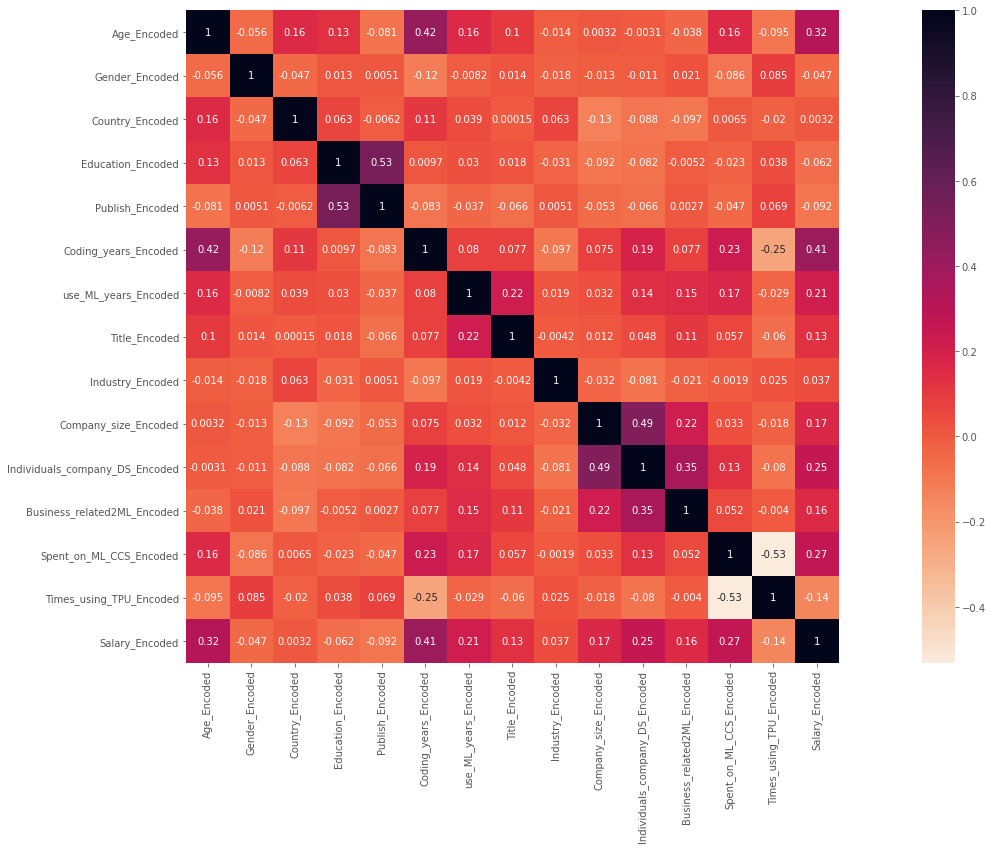

In [42]:
# correlation heatmap 14 features and 1 target
plt.figure(figsize=(30, 12))
sns.heatmap(df_enc_corr, cmap='rocket_r', annot=True, cbar=True, square=True)
plt.show()

- Distritbution plot of 14 feature and 1 target

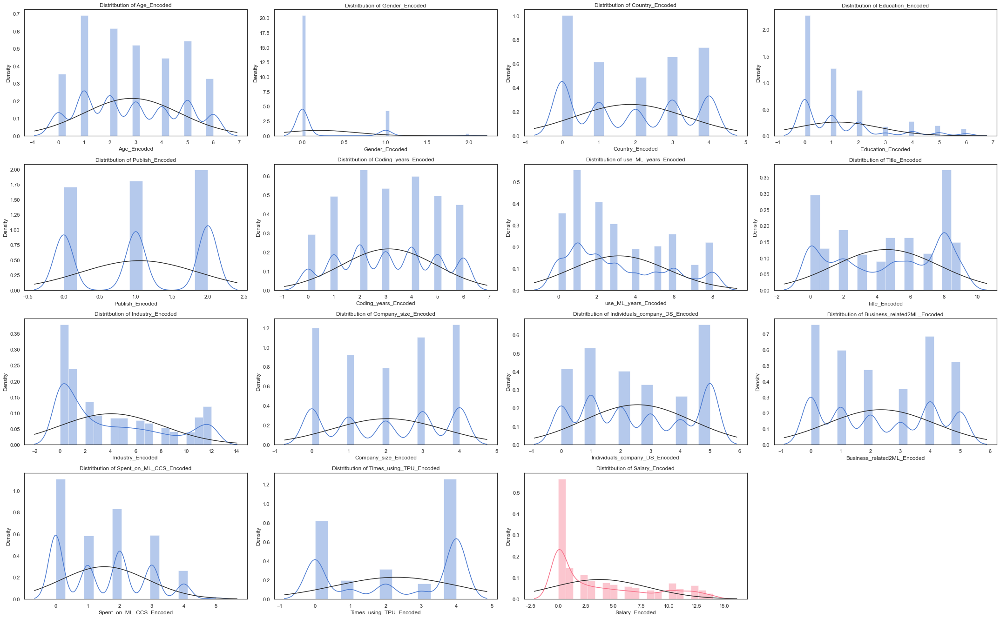

In [43]:
# distritbution plot of 14 feature and 1 target
plt.figure(figsize=(30,8*4))
gs = gridspec.GridSpec(7, 4)
for i, cn in enumerate(df_enc.columns):
    if cn == 'Salary_Encoded':
        sns.set(style="white", palette="husl", color_codes=True)
    else:
        sns.set(style="white", palette="muted", color_codes=True)
    ax = plt.subplot(gs[i])
    sns.distplot(df_enc[cn], fit=norm)
    plt.title('Distritbution of {}'.format(cn))
plt.tight_layout()
plt.show()

- Propbability plot of 14 feature and 1 target

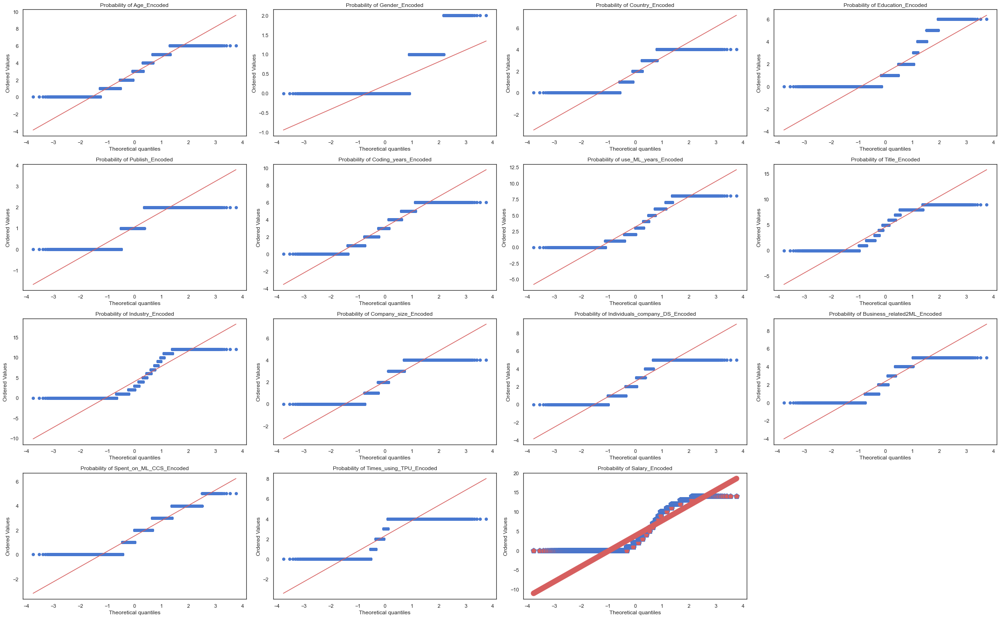

In [44]:
# propbability plot of 14 feature and 1 target
plt.figure(figsize=(30,8*4))
gs = gridspec.GridSpec(7, 4)
for i, cn in enumerate(df_enc.columns):
    ax = plt.subplot(gs[i])
    stats.probplot(df_enc[cn], plot=plt)
    if cn == 'Salary_Encoded':
        ax.get_lines()[0].set_marker('p')
        ax.get_lines()[0].set_markerfacecolor('r')
        ax.get_lines()[0].set_markersize(12.0)
        ax.get_lines()[1].set_linewidth(12.0)
    plt.title('Probability of {}'.format(cn))
plt.tight_layout()
plt.show()

- Boxplot of 14 feature and 1 target

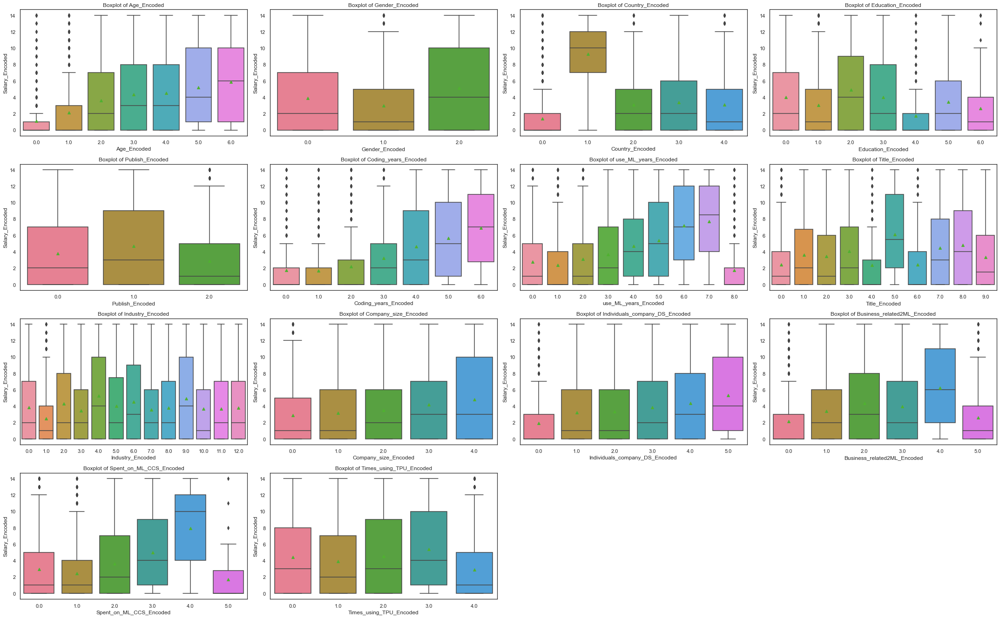

In [45]:
# boxplot of 14 feature and 1 target
plt.figure(figsize=(30,8*4))
gs = gridspec.GridSpec(7, 4)
for i, cn in enumerate(df_enc.columns[:-1]):
    ax = plt.subplot(gs[i])
    sns.boxplot(x=cn, y='Salary_Encoded', data=df_enc, showmeans = True)
    plt.title('Boxplot of {}'.format(cn))
plt.tight_layout()
plt.show()

- Countplot of 14 feature and 1 target

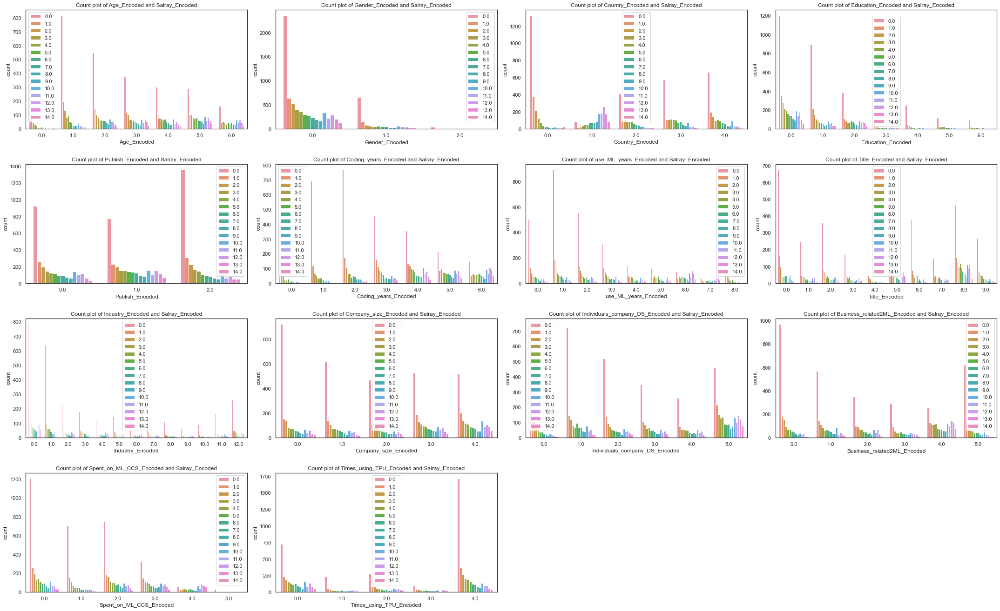

In [46]:
# countplot of 14 feature and 1 target
plt.figure(figsize=(30,8*4))
gs = gridspec.GridSpec(7, 4)
for i, cn in enumerate(df_enc.columns[:-1]):
    ax = plt.subplot(gs[i])
    sns.countplot(x = cn, hue = 'Salary_Encoded', data = df_enc)
    plt.title('Count plot of {} and Salray_Encoded'.format(cn))
    plt.legend(loc='best')
plt.tight_layout()
plt.show()

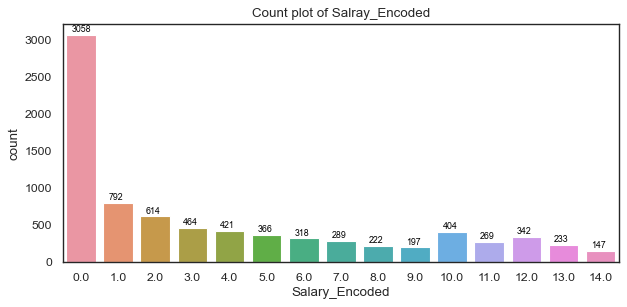

In [47]:
fig,ax = plt.subplots(figsize=(8,4), dpi=80)
ax.set_title('Count plot of Salray_Encoded')
sns.countplot(x = 'Salary_Encoded', data = df_enc)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.15, p.get_height()+40), color='black', size=8)
plt.tight_layout()
plt.show()

### 2.2 Explain how feature engineering is a useful tool in machine learning in the context of the tasks in this assignment

In [48]:
print(
'''
In order to improve the performance of Ordinary Logistic Regression model, feature engineering is adopted in 
this step. Feature engineering in machine learning is to maximize the extraction of features from raw data 
for use by algorithms and models. Data and features determine the upper bound of machine learning, and models 
and algorithms only approximate this upper bound. The ultimate goal of feature engineering is to improve the 
performance of model.

Feature engineering normally includes: 
    - data processing: standardisation, normalisation, missing value handling, etc
    - feature selection: variance, correlation, chi-square, entropy, etc
    - dimension compression: PCA, LDA, ICA, etc.
Data features directly affect the predictive performance of model.
The better the selected features, the better the final performance.
'''
)


In order to improve the performance of Ordinary Logistic Regression model, feature engineering is adopted in 
this step. Feature engineering in machine learning is to maximize the extraction of features from raw data 
for use by algorithms and models. Data and features determine the upper bound of machine learning, and models 
and algorithms only approximate this upper bound. The ultimate goal of feature engineering is to improve the 
performance of model.

Feature engineering normally includes: 
    - data processing: standardisation, normalisation, missing value handling, etc
    - feature selection: variance, correlation, chi-square, entropy, etc
    - dimension compression: PCA, LDA, ICA, etc.
Data features directly affect the predictive performance of model.
The better the selected features, the better the final performance.



### 2.3 Apply feature engineering

- Feature selection technique 1: Variance Selection - VarianceThreshold

In [49]:
# Feature selector that removes all low-variance features (the more groups, the higher variance)
# initial VarianceThreshold
variance_selector = VarianceThreshold(threshold = 4)
# fit data to get data > threshold
x_data_var = variance_selector.fit_transform(x_data) # need to normalise
# check shape
print("x_data_var shape:{}".format(x_data_var.shape))
# check variance of each feature
_var_1 = pd.DataFrame(variance_selector.variances_.reshape(-1,1).T,
                          index = ['variance'], 
                          columns = x_data.columns)
_var_1

x_data_var shape:(8136, 3)


,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded
variance,3.450423,0.188721,2.3284,2.390972,0.668944,3.379809,6.308498,9.977368,16.77829,2.238583,3.334809,3.254013,1.784925,3.062349


In [50]:
# rearrange selected feature
feat_slt_df_tech_1 = pd.DataFrame(x_data_var, columns = [x_data.columns[i] for i in np.where(np.array(_var_1)[0] > _var_1.values.mean())[0]])
feat_slt_df_tech_1.head(2)

,use_ML_years_Encoded,Title_Encoded,Industry_Encoded
0,2.0,8.0,6.0
1,5.0,2.0,9.0


In [51]:
# Technique 1 description and feature selection justification
print(
'''
Technique 1: Variance Selection - VarianceThreshold
Description:
    - This technique calculates variance of each normalised feature (measure how far the data deviates from the mean).
      The greater variance of a feature, the greater degree of dispersion, which means that featuree has a 
      more obvious contribution and effect to the model.
    - Then features are selected with variance greater than a threshold according to that threshold.
    - This method only suitable for discrete variable.

Selected features:
    - {}
Justification:
    - The threshold of VarianceThreshold function is set to {}, so features that has variance greter than {}
      are selected.
    - However, this method might not suitable since the more groups of feature, the higher variance.
'''.format(feat_slt_df_tech_1.columns.tolist(),
           round(_var_1.values.mean()), round(_var_1.values.mean()))
)


Technique 1: Variance Selection - VarianceThreshold
Description:
    - This technique calculates variance of each normalised feature (measure how far the data deviates from the mean).
      The greater variance of a feature, the greater degree of dispersion, which means that featuree has a 
      more obvious contribution and effect to the model.
    - Then features are selected with variance greater than a threshold according to that threshold.
    - This method only suitable for discrete variable.

Selected features:
    - ['use_ML_years_Encoded', 'Title_Encoded', 'Industry_Encoded']
Justification:
    - The threshold of VarianceThreshold function is set to 4, so features that has variance greter than 4
      are selected.
    - However, this method might not suitable since the more groups of feature, the higher variance.



- Feature selection technique 2: Chi-square test with Select K - SelectKBest with Chi2

In [52]:
# Select features according to the k highest scores.
# initial SelectKBest with chi2
k_chi_selector = SelectKBest(chi2, k = 8)
# fit data to get 8 best correlation score data
x_data_skc2 = k_chi_selector.fit_transform(x_data, y_target) # need to normalise
# check shape
print("x_data_skc2 shape:{}".format(x_data_skc2.shape))
# check score of each feature
_scores_2 = pd.DataFrame(k_chi_selector.scores_.reshape(-1,1).T,
                         index = ['scores'], 
                         columns = x_data.columns)
_scores_2

x_data_skc2 shape:(8136, 8)


,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded
scores,1152.673555,55.631581,361.36583,125.467265,60.49127,1594.847772,823.332064,432.030173,158.036559,328.028947,802.58559,321.139317,761.501021,264.756872


In [53]:
# rearrange selected feature
feat_slt_df_tech_2 = pd.DataFrame(x_data_skc2, columns = k_chi_selector.get_feature_names_out())
feat_slt_df_tech_2.head(2)

,Age_Encoded,Country_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Spent_on_ML_CCS_Encoded
0,6.0,3.0,5.0,2.0,8.0,0.0,1.0,3.0
1,2.0,4.0,5.0,5.0,2.0,2.0,5.0,0.0


In [54]:
# Technique 2 description and feature selection justification
print(
'''
Technique 2: Chi-square test with Select K - SelectKBest with chi2
Description:
    - This technique use chi2 function to calculates correlation score of independent variable 
      and dependent variable (both variables are normalised).
    - Then select k features with best score.

Selected features:
    - {}
Justification:
    - k is set to {}, so {} features with best Chi2 correlation score of x_data and y_target
      are selected.
    - This method might be most suitable since it discover the correlation 
      between each normalised feature and normalised target.
'''.format(feat_slt_df_tech_2.columns.tolist(), len(feat_slt_df_tech_2.columns.tolist()),
           len(feat_slt_df_tech_2.columns.tolist()))
)


Technique 2: Chi-square test with Select K - SelectKBest with chi2
Description:
    - This technique use chi2 function to calculates correlation score of independent variable 
      and dependent variable (both variables are normalised).
    - Then select k features with best score.

Selected features:
    - ['Age_Encoded', 'Country_Encoded', 'Coding_years_Encoded', 'use_ML_years_Encoded', 'Title_Encoded', 'Company_size_Encoded', 'Individuals_company_DS_Encoded', 'Spent_on_ML_CCS_Encoded']
Justification:
    - k is set to 8, so 8 features with best Chi2 correlation score of x_data and y_target
      are selected.
    - This method might be most suitable since it discover the correlation 
      between each normalised feature and normalised target.



- Feature selection technique 3: PCA

In [55]:
# Principal component analysis (PCA).
# Linear dimensionality reduction using Singular Value Decomposition of the data to project it to a lower dimensional space
# initial PCA with Number of 3 components to keep
pca_selector = PCA(n_components = 3, copy = True)
# fit data to get dimensionality reduction data
x_data_pca = pca_selector.fit_transform(x_data) # need to normalise
# check shape
print("x_data_new shape:{}".format(x_data_pca.shape))
_explained_variance_ratio_3 = pd.DataFrame(pca_selector.explained_variance_ratio_.reshape(-1,1).T,
                                           index = ['explained_variance_ratio'], 
                                           columns = pca_selector.get_feature_names_out())
_explained_variance_ratio_3

x_data_new shape:(8136, 3)


,pca0,pca1,pca2
explained_variance_ratio,0.285405,0.187729,0.107258


In [56]:
# rearrange dimensionality reduction feature
feat_slt_df_tech_3 = pd.DataFrame(x_data_pca, columns = x_data.columns[:3] + '_' + pca_selector.get_feature_names_out())
feat_slt_df_tech_3.head(2)

,Age_Encoded_pca0,Gender_Encoded_pca1,Country_Encoded_pca2
0,1.819399,3.167362,-1.462024
1,4.828565,-1.042481,3.509478


In [57]:
# for 2.4 ploting all pca result
pca_selector_vis = PCA(n_components = 14, copy = True)
x_data_pca_vis = pca_selector_vis.fit_transform(x_data) # need to normalise
_explained_variance_ratio_3_vis = pd.DataFrame(pca_selector_vis.explained_variance_ratio_.reshape(-1,1).T,
                                               index = ['explained_variance_ratio'], 
                                               columns = x_data.columns)

In [58]:
# Technique 3 description and feature selection justification
print(
'''
Technique 3: PCA - Principle Component Analysis
Description:
    - This technique use PCA to apply dimensionality reduction on normalised data, it projects Singular Value 
      Decomposition of the data to a lower dimensional space. In other words, it maps n-dimensional features 
      to k-dimensions. This k-dimension is a new orthogonal feature, also known as principal component, which 
      is a k-dimensional feature reconstructed on the basis of the original n-dimensional feature.
    - Then n features are keep.

3 features are selected:
    - {}
Justification:
    - n is set to 3 since the dimension of data is reduced, which has lower complexity, so top 3 features selected.
    - This method might be suitable since it reduce the dimension of normalised feature and normalised target.
'''.format(x_data.columns[:3] + '_' + pca_selector.get_feature_names_out())
)


Technique 3: PCA - Principle Component Analysis
Description:
    - This technique use PCA to apply dimensionality reduction on normalised data, it projects Singular Value 
      Decomposition of the data to a lower dimensional space. In other words, it maps n-dimensional features 
      to k-dimensions. This k-dimension is a new orthogonal feature, also known as principal component, which 
      is a k-dimensional feature reconstructed on the basis of the original n-dimensional feature.
    - Then n features are keep.

3 features are selected:
    - Index(['Age_Encoded_pca0', 'Gender_Encoded_pca1', 'Country_Encoded_pca2'], dtype='object')
Justification:
    - n is set to 3 since the dimension of data is reduced, which has lower complexity, so top 3 features selected.
    - This method might be suitable since it reduce the dimension of normalised feature and normalised target.



- Feature selection technique 4: Feature selection based on GBDT (Gradient Boosting Decision Tree) - feature_importances_ and SelectFromModel.threshold_

In [59]:
# GBDT
# initial GBDT
GBDT_model = GradientBoostingClassifier()
# use SelectFromModel to get threshold which is also the mean of all feature gini importance
GBDT_selector = SelectFromModel(GBDT_model).fit(x_data, y_target) # cannot normalise for dt
# get gini importance threshold
print('gini importance threshold:', GBDT_selector.threshold_)
# fit data to GBDT model to get all feature importance
GBDT_model.fit(x_data, y_target)
importance_ = GBDT_model.feature_importances_
importance_df_4 = pd.DataFrame(importance_.reshape(-1,1).T,
                               index = ['importance'], 
                               columns = x_data.columns)
importance_df_4

gini importance threshold: 0.07142857142857142


,Age_Encoded,Gender_Encoded,Country_Encoded,Education_Encoded,Publish_Encoded,Coding_years_Encoded,use_ML_years_Encoded,Title_Encoded,Industry_Encoded,Company_size_Encoded,Individuals_company_DS_Encoded,Business_related2ML_Encoded,Spent_on_ML_CCS_Encoded,Times_using_TPU_Encoded
importance,0.09685,0.013197,0.238187,0.027147,0.008999,0.240753,0.054039,0.046264,0.04871,0.039206,0.059662,0.04987,0.06673,0.010386


In [60]:
# # rearrange feature by selecting feature that importance > importance mean
slt_feat = [col for col in importance_df_4.columns if importance_df_4[col][0] > GBDT_selector.threshold_]
feat_slt_df_tech_4 = x_data.loc[:, slt_feat]
feat_slt_df_tech_4.head(2)

,Age_Encoded,Country_Encoded,Coding_years_Encoded
0,6.0,3.0,5.0
1,2.0,4.0,5.0


In [61]:
# Technique 4 description and feature selection justification
print(
'''
Technique 4: Feature selection based on GBDT (Gradient Boosting Decision Tree) - feature_importances_ and SelectFromModel.threshold_
Description:
    - This technique calculates the feature gini importance based on GBDT model. (the impurity-based feature importances.)
      The higher, the more important the feature. The importance of a feature is computed as the (normalized) total 
      reduction of the criterion brought by that feature.
    - Then features with gini importance greater than average gini importance are selected.

Selected feature:
    - {}
Justification:
    - SelectFromModel.threshold_ provide a gini importance threshold based on fit data and target, this threhold is
      also the mean value of all feature gini importance, which is {}, so features higher than this value has greater
      contribution and effect to model.
    - This method might be suitable since it calculates the gini coefficient of each feature, which represents the impurity
      of the model. The smaller the gini coefficient, the lower the impurity and the better the feature.
      This is the opposite of information gain (ratio)
'''.format(slt_feat, round(GBDT_selector.threshold_,3))
)


Technique 4: Feature selection based on GBDT (Gradient Boosting Decision Tree) - feature_importances_ and SelectFromModel.threshold_
Description:
    - This technique calculates the feature gini importance based on GBDT model. (the impurity-based feature importances.)
      The higher, the more important the feature. The importance of a feature is computed as the (normalized) total 
      reduction of the criterion brought by that feature.
    - Then features with gini importance greater than average gini importance are selected.

Selected feature:
    - ['Age_Encoded', 'Country_Encoded', 'Coding_years_Encoded']
Justification:
    - SelectFromModel.threshold_ provide a gini importance threshold based on fit data and target, this threhold is
      also the mean value of all feature gini importance, which is 0.071, so features higher than this value has greater
      contribution and effect to model.
    - This method might be suitable since it calculates the gini coefficient of each fe

### 2.4  Visualization of feature importance order for each method.

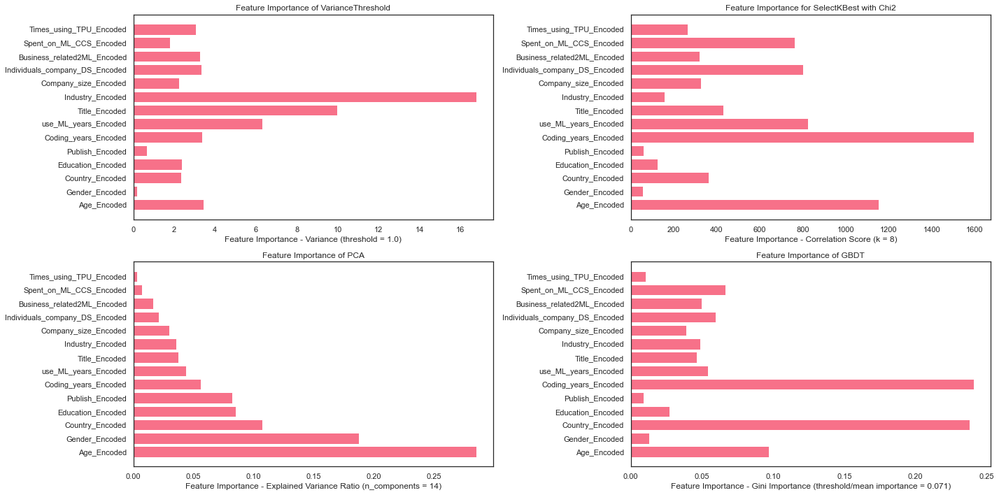

In [62]:
# Visualization of feature importance order for each method.
plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
plt.barh(_var_1.columns.tolist(), _var_1.values[0])
plt.title('Feature Importance of VarianceThreshold')
plt.xlabel('Feature Importance - Variance (threshold = 1.0)')

plt.subplot(2,2,2)
plt.barh(_scores_2.columns.tolist(), _scores_2.values[0])
plt.title('Feature Importance for SelectKBest with Chi2')
plt.xlabel('Feature Importance - Correlation Score (k = 8)')

plt.subplot(2,2,3)
plt.barh(_explained_variance_ratio_3_vis.columns.tolist(), _explained_variance_ratio_3_vis.values[0])
plt.title('Feature Importance of PCA')
plt.xlabel('Feature Importance - Explained Variance Ratio (n_components = 14)')

plt.subplot(2,2,4)
plt.barh(importance_df_4.columns.tolist(), importance_df_4.values[0])
plt.title('Feature Importance of GBDT')
plt.xlabel('Feature Importance - Gini Importance (threshold/mean importance = 0.071)')

plt.tight_layout()
plt.show()

In [63]:
# which of the original attributes in the data are most related to a survey respondent’s yearly compensation?
print(
'''
To check which data are most related to a survey respondents yearly compensation, we mainly focus on method 2 SelectKBest with Chi2.
Top right sub-figure above demonstrates the correlation score of features and salary target, so from the sub-figure, 8 features have 
significantly high correlation scores:
    - {}
'''.format(feat_slt_df_tech_2.columns.tolist())
)


To check which data are most related to a survey respondents yearly compensation, we mainly focus on method 2 SelectKBest with Chi2.
Top right sub-figure above demonstrates the correlation score of features and salary target, so from the sub-figure, 8 features have 
significantly high correlation scores:
    - ['Age_Encoded', 'Country_Encoded', 'Coding_years_Encoded', 'use_ML_years_Encoded', 'Title_Encoded', 'Company_size_Encoded', 'Individuals_company_DS_Encoded', 'Spent_on_ML_CCS_Encoded']



## 3.Model implementation

- Check all features encoding unique value

In [64]:
# check feature unique value (encoding unique value)
for col in x_data.columns:
    print(col, ': ', x_data[col].unique())

Age_Encoded :  [6. 2. 4. 5. 1. 3. 0.]
Gender_Encoded :  [0. 1. 2.]
Country_Encoded :  [3. 4. 1. 2. 0.]
Education_Encoded :  [5. 1. 2. 0. 4. 6. 3.]
Publish_Encoded :  [2. 1. 0.]
Coding_years_Encoded :  [5. 6. 4. 3. 1. 2. 0.]
use_ML_years_Encoded :  [2. 5. 6. 3. 1. 4. 7. 0. 8.]
Title_Encoded :  [8. 2. 7. 1. 0. 9. 3. 4. 6. 5.]
Industry_Encoded :  [ 6.  9.  5.  0.  2.  1. 11. 12.  4. 10.  3.  8.  7.]
Company_size_Encoded :  [0. 2. 3. 1. 4.]
Individuals_company_DS_Encoded :  [1. 5. 2. 3. 0. 4.]
Business_related2ML_Encoded :  [2. 4. 1. 5. 3. 0.]
Spent_on_ML_CCS_Encoded :  [3. 0. 2. 4. 1. 5.]
Times_using_TPU_Encoded :  [2. 4. 0. 3. 1.]


- Check feature (method 1 VarianceThreshold) encoding unique value

In [65]:
# check feature (method 1 VarianceThreshold) unique value (encoding unique value)
for col in feat_slt_df_tech_1.columns:
    print(col, ': ', feat_slt_df_tech_1[col].unique())

use_ML_years_Encoded :  [2. 5. 6. 3. 1. 4. 7. 0. 8.]
Title_Encoded :  [8. 2. 7. 1. 0. 9. 3. 4. 6. 5.]
Industry_Encoded :  [ 6.  9.  5.  0.  2.  1. 11. 12.  4. 10.  3.  8.  7.]


- Check feature (method 2 SelectKBest with Chi2) encoding unique value

In [66]:
# check feature (method 2 SelectKBest with Chi2) unique value (encoding unique value)
for col in feat_slt_df_tech_2.columns:
    print(col, ':', feat_slt_df_tech_2[col].unique())

Age_Encoded : [6. 2. 4. 5. 1. 3. 0.]
Country_Encoded : [3. 4. 1. 2. 0.]
Coding_years_Encoded : [5. 6. 4. 3. 1. 2. 0.]
use_ML_years_Encoded : [2. 5. 6. 3. 1. 4. 7. 0. 8.]
Title_Encoded : [8. 2. 7. 1. 0. 9. 3. 4. 6. 5.]
Company_size_Encoded : [0. 2. 3. 1. 4.]
Individuals_company_DS_Encoded : [1. 5. 2. 3. 0. 4.]
Spent_on_ML_CCS_Encoded : [3. 0. 2. 4. 1. 5.]


- Check feature (method 3 PCA) encoding unique value

In [67]:
# check feature (method 3 PCA) unique value (encoding unique value)
for col in feat_slt_df_tech_3.columns:
    print(col, ':', feat_slt_df_tech_3[col].unique())

Age_Encoded_pca0 : [ 1.81939921  4.82856523  0.57475459 ... -3.74428906  4.21345214
 -2.82180544]
Gender_Encoded_pca1 : [ 3.16736217 -1.04248114  4.55765466 ... -5.3185402  -2.00585143
  0.60830824]
Country_Encoded_pca2 : [-1.46202389  3.50947805  3.78362319 ... -2.65675805 -2.48887277
 -4.3730738 ]


- Check feature (method 4 GBDT) encoding unique value

In [68]:
# check feature (method 4 GBDT) unique value (encoding unique value)
for col in feat_slt_df_tech_4.columns:
    print(col, ':', feat_slt_df_tech_4[col].unique())

Age_Encoded : [6. 2. 4. 5. 1. 3. 0.]
Country_Encoded : [3. 4. 1. 2. 0.]
Coding_years_Encoded : [5. 6. 4. 3. 1. 2. 0.]


- Traing & Test set Use features selected by method 2: SelectKBest with Chi2

In [69]:
# check x feature and y target
X_slt_feat_data = feat_slt_df_tech_2.copy(deep = True)
X_slt_feat_data
y_target
print('feature data - X_slt_feat_data, target data - y_target')
print('feature shape: {}'.format(X_slt_feat_data.shape))
print('target shape: {}'.format(y_target.shape))

feature data - X_slt_feat_data, target data - y_target
feature shape: (8136, 8)
target shape: (8136, 1)


### 3.1 Train-Test Split

In [70]:
# If a subset of data is chosen, it must contain at least 5000 training examples.
print('train-test ratio = {}:{}'.format(round(5000/len(X_slt_feat_data),4), round(1-5000/len(X_slt_feat_data),4)))

# Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X_slt_feat_data, y_target, test_size = 0.3, random_state = 0)

print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

# You must justify and explain why you are selecting a subset of the data, and how it may affect the model.
print(
'''
Justification:
    - The point of evaluating a model is to divide the data into three sets: a training set, a validation set, and a test set. 
      Train the model on training data and evaluate the model on validation data. Once the best parameters are found, test one 
      last time on the test data.
    - The reason is that when developing a model, the model configuration always needs to be adjusted, such as choosing the 
      number of layers or the size of each layer (hyperparameter of the model, i.e. weights). This tuning process requires the 
      use of model's performance on the validation data as a feedback signal. This tuning process is essentially a learning 
      process: finding a good model configuration in some parameter space. Therefore, if the model configuration is tuned based 
      on its performance on the validation set, it will quickly lead to overfitting on the validation set.
''')

train-test ratio = 0.6146:0.3854
X_train shape:  (5695, 8)
y_train shape:  (5695, 1)
X_test shape:  (2441, 8)
y_test shape:  (2441, 1)

Justification:
    - The point of evaluating a model is to divide the data into three sets: a training set, a validation set, and a test set. 
      Train the model on training data and evaluate the model on validation data. Once the best parameters are found, test one 
      last time on the test data.
    - The reason is that when developing a model, the model configuration always needs to be adjusted, such as choosing the 
      number of layers or the size of each layer (hyperparameter of the model, i.e. weights). This tuning process requires the 
      use of model's performance on the validation data as a feedback signal. This tuning process is essentially a learning 
      process: finding a good model configuration in some parameter space. Therefore, if the model configuration is tuned based 
      on its performance on the validation set, it w

### 3.2 Implement ordinal logistic regression algorithm

- Ordinal Logistic Regression is the common analysis method used for ordinal dependent parameters.
- Python has no bulit-in model for ordinal logistic regression, therefore it will be implemented here. 
- We will use the proportional odds model for the Ordinal Logistic Regression. 
- Denoting the number of categories by K, We make (K-1) logistic regression comparisons, each time cutting the entire dataset by two and comparing all the lower categories to higher categories. 
- Each of these constitutes a sub-model and finally they will all be blended into one holisic model. 
- In our example, since there are 15 (0-14) salary categories, we make 14 logistic regression models.

Strategy: since there are 15 (0-14) salary encoded categories, we make 14 logistic regression models.

So we seperate batches first:

    - Find salary encoded data >= 1 -> 1, else -> 0, store X_y_train_0_1
    - Find salary encoded data >= 2 -> 1, else -> 0, store X_y_train_1_2
    - Find salary encoded data >= 3 -> 1, else -> 0, store X_y_train_2_3
    - Find salary encoded data >= 4 -> 1, else -> 0, store X_y_train_3_4
    - Find salary encoded data >= 5 -> 1, else -> 0, store X_y_train_4_5
    - Find salary encoded data >= 6 -> 1, else -> 0, store X_y_train_5_6
    - Find salary encoded data >= 7 -> 1, else -> 0, store X_y_train_6_7
    - Find salary encoded data >= 8 -> 1, else -> 0, store X_y_train_7_8
    - Find salary encoded data >= 9 -> 1, else -> 0, store X_y_train_8_9
    - Find salary encoded data >= 10 -> 1, else -> 0, store X_y_train_9_10
    - Find salary encoded data >= 11 -> 1, else -> 0, store X_y_train_10_11
    - Find salary encoded data >= 12 -> 1, else -> 0, store X_y_train_11_12
    - Find salary encoded data >= 13 -> 1, else -> 0, store X_y_train_12_13
    - Find salary encoded data >= 14 -> 1, else -> 0, store X_y_train_13_14


Then constructing the 7 different LogisticRegression models for each batches and cross-validate with 10 fold. The hyperparamete is solver and penalty of LogisticRegression, so we have 7 model for each batch. The result of cross-validation, ROC, prediction and probability is rearrange to dataframe respectively for each model. Then by using these dataframes and corresponding plots, models for each batch with best performance are located.

    - OLR_**bat0 => solver: newton-cg, penalty: l2
    - OLR_**bat1 => solver: lbfgs, penalty: l2
    - OLR_**bat2 => solver: liblinear, penalty: l1
    - OLR_**bat3 => solver: liblinear, penalty: l2
    - OLR_**bat4 => solver: sag, penalty: l2
    - OLR_**bat5 => solver: saga, penalty: l1
    - OLR_**bat6 => solver: saga, penalty: l2

Model name notation: OLR_01bat0 -> model 0 on batch 01, using solver: newton-cg, penalty: l2.

Then after finding the model with best performance, the probability output of each model for each observation is calculated and stored in a dataframe.

    - OLR_model_01
    - OLR_model_12
    - OLR_model_23
    - OLR_model_34
    - OLR_model_45
    - OLR_model_56
    - OLR_modlel_67
    - OLR_modlel_78
    - OLR_modlel_89
    - OLR_modlel_910
    - OLR_modlel_1011
    - OLR_modlel_1112
    - OLR_modlel_1213
    - OLR_modlel_1314

#### 3.2.1 Seperate batches for train and test set for 14 ordinal logistic regression

In [71]:
# join X_train and y_train, X_test and y_test for seperate batches ()
X_y_train = X_train.join(y_train)
X_y_test = X_test.join(y_test)

# salary class
salary_encoded_cls = df_enc.Salary_Encoded.unique()
salary_encoded_cls.sort()
salary_encoded_cls

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14.])

- Function to seperate batches for train and test set

In [72]:
def sep_batches_4_OLR(upperbound):
    '''
    upperbound = 1 for 0-1 class, 2 for 1-2 class, ....
    '''
    X_y_train_batches = X_y_train.copy()
    X_y_test_batches = X_y_test.copy()
    count_batches_train = 0
    count_batches_test = 0
    # seperate training
    for i in range(len(X_y_train)):
        if (X_y_train['Salary_Encoded'].iloc[i] >= upperbound):
            X_y_train_batches['Salary_Encoded'].iloc[i] = 1     
        else:
            X_y_train_batches['Salary_Encoded'].iloc[i] = 0 
            count_batches_train += 1
    # seperate test
    for i in range(len(X_y_test)):
        if (X_y_test['Salary_Encoded'].iloc[i] >= upperbound):
            X_y_test_batches['Salary_Encoded'].iloc[i] = 1     
        else:
            X_y_test_batches['Salary_Encoded'].iloc[i] = 0 
            count_batches_test += 1

    return count_batches_train, count_batches_test, X_y_train_batches, X_y_test_batches

- Find salary encoded data >= 1 -> 1, else -> 0, store X_y_train_0_1, X_y_test_0_1

In [73]:
# OLR_0_1: find salary encoded data >= 1 -> 1, else -> 0, store X_y_train_0_1
count_tra_0_1, count_tst_0_1, X_y_train_0_1, X_y_test_0_1 = sep_batches_4_OLR(upperbound = 1)

print('train 0_1 count:', count_tra_0_1)
print('test 0_1 count:', count_tst_0_1)

train 0_1 count: 2163
test 0_1 count: 895


- Find salary encoded data >= 2 -> 1, else -> 0, store X_y_train_1_2, X_y_test_1_2

In [74]:
# OLR_1_2: find salary encoded data >= 2 -> 1, else -> 0, store X_y_train_1_2
count_tra_1_2, count_tst_1_2, X_y_train_1_2, X_y_test_1_2 = sep_batches_4_OLR(upperbound = 2)

print('train 1_2 count:', count_tra_1_2)
print('test 1_2 count:', count_tst_1_2)

train 1_2 count: 2715
test 1_2 count: 1135


- Find salary encoded data >= 3 -> 1, else -> 0, store X_y_train_2_3, X_y_test_2_3

In [75]:
# OLR_2_3: find salary encoded data >= 3 -> 1, else -> 0, store X_y_train_2_3
count_tra_2_3, count_tst_2_3, X_y_train_2_3, X_y_test_2_3 = sep_batches_4_OLR(upperbound = 3)

print('train 2_3 count:', count_tra_2_3)
print('test 2_3 count:', count_tst_2_3)

train 2_3 count: 3133
test 2_3 count: 1331


- Find salary encoded data >= 4 -> 1, else -> 0, store X_y_train_3_4, X_y_test_3_4

In [76]:
# OLR_3_4: find salary encoded data >= 4 -> 1, else -> 0, store X_y_train_3_4
count_tra_3_4, count_tst_3_4, X_y_train_3_4, X_y_test_3_4 = sep_batches_4_OLR(upperbound = 4)

print('train 3_4 count:', count_tra_3_4)
print('test 3_4 count:', count_tst_3_4)

train 3_4 count: 3455
test 3_4 count: 1473


- Find salary encoded data >= 5 -> 1, else -> 0, store X_y_train_4_5, X_y_test_4_5

In [77]:
# OLR_4_5: find salary encoded data >= 5 -> 1, else -> 0, store X_y_train_4_5
count_tra_4_5, count_tst_4_5, X_y_train_4_5, X_y_test_4_5 = sep_batches_4_OLR(upperbound = 5)

print('train 4_5 count:', count_tra_4_5)
print('test 4_5 count:', count_tst_4_5)

train 4_5 count: 3737
test 4_5 count: 1612


- Find salary encoded data >= 6 -> 1, else -> 0, store X_y_train_5_6, X_y_test_5_6

In [78]:
# OLR_5_6: find salary encoded data >= 6 -> 1, else -> 0, store X_y_train_5_6
count_tra_5_6, count_tst_5_6, X_y_train_5_6, X_y_test_5_6 = sep_batches_4_OLR(upperbound = 6)

print('train 5_6 count:', count_tra_5_6)
print('test 5_6 count:', count_tst_5_6)

train 5_6 count: 3994
test 5_6 count: 1721


- Find salary encoded data >= 7 -> 1, else -> 0, store X_y_train_6_7, X_y_test_6_7

In [79]:
# OLR_6_7: find salary encoded data >= 7 -> 1, else -> 0, store X_y_train_6_7
count_tra_6_7, count_tst_6_7, X_y_train_6_7, X_y_test_6_7 = sep_batches_4_OLR(upperbound = 7)

print('train 6_7 count:', count_tra_6_7)
print('test 6_7 count:', count_tst_6_7)

train 6_7 count: 4219
test 6_7 count: 1814


- Find salary encoded data >= 8 -> 1, else -> 0, store X_y_train_7_8, X_y_test_7_8

In [80]:
# OLR_7_8: find salary encoded data >= 8 -> 1, else -> 0, store X_y_train_7_8
count_tra_7_8, count_tst_7_8, X_y_train_7_8, X_y_test_7_8 = sep_batches_4_OLR(upperbound = 8)

print('train 7_8 count:', count_tra_7_8)
print('test 7_8 count:', count_tst_7_8)

train 7_8 count: 4425
test 7_8 count: 1897


- Find salary encoded data >= 9 -> 1, else -> 0, store X_y_train_8_9, X_y_test_8_9

In [81]:
# OLR_8_9: find salary encoded data >= 9 -> 1, else -> 0, store X_y_train_8_9
count_tra_8_9, count_tst_8_9, X_y_train_8_9, X_y_test_8_9 = sep_batches_4_OLR(upperbound = 9)

print('train 8_9 count:', count_tra_8_9)
print('test 8_9 count:', count_tst_8_9)

train 8_9 count: 4574
test 8_9 count: 1970


- Find salary encoded data >= 10 -> 1, else -> 0, store X_y_train_9_10, X_y_test_9_10

In [82]:
# OLR_9_10: find salary encoded data >= 10 -> 1, else -> 0, store X_y_train_9_10
count_tra_9_10, count_tst_9_10, X_y_train_9_10, X_y_test_9_10 = sep_batches_4_OLR(upperbound = 10)

print('train 9_10 count:', count_tra_9_10)
print('test 9_10 count:', count_tst_9_10)

train 9_10 count: 4700
test 9_10 count: 2041


- Find salary encoded data >= 11 -> 1, else -> 0, store X_y_train_10_11, X_y_test_10_11

In [83]:
# OLR_10_11: find salary encoded data >= 11 -> 1, else -> 0, store X_y_train_10_11
count_tra_10_11, count_tst_10_11, X_y_train_10_11, X_y_test_10_11 = sep_batches_4_OLR(upperbound = 11)

print('train 10_11 count:', count_tra_10_11)
print('test 10_11 count:', count_tst_10_11)

train 10_11 count: 4980
test 10_11 count: 2165


- Find salary encoded data >= 12 -> 1, else -> 0, store X_y_train_11_12, X_y_test_11_12

In [84]:
# OLR_11_12: find salary encoded data >= 12 -> 1, else -> 0, store X_y_train_11_12
count_tra_11_12, count_tst_11_12, X_y_train_11_12, X_y_test_11_12 = sep_batches_4_OLR(upperbound = 12)

print('train 11_12 count:', count_tra_11_12)
print('test 11_12 count:', count_tst_11_12)

train 11_12 count: 5189
test 11_12 count: 2225


- Find salary encoded data >= 13 -> 1, else -> 0, store X_y_train_12_13, X_y_test_12_13

In [85]:
# OLR_12_13: find salary encoded data >= 13 -> 1, else -> 0, store X_y_train_12_13
count_tra_12_13, count_tst_12_13, X_y_train_12_13, X_y_test_12_13 = sep_batches_4_OLR(upperbound = 13)

print('train 12_13 count:', count_tra_12_13)
print('test 12_13 count:', count_tst_12_13)

train 12_13 count: 5436
test 12_13 count: 2320


- Find salary encoded data >= 14 -> 1, else -> 0, store X_y_train_13_14, X_y_test_13_14

In [86]:
# OLR_13_14: find salary encoded data >= 14 -> 1, else -> 0, store X_y_train_13_14
count_tra_13_14, count_tst_13_14, X_y_train_13_14, X_y_test_13_14 = sep_batches_4_OLR(upperbound = 14)

print('train 13_14 count:', count_tra_13_14)
print('test 13_14 count:', count_tst_13_14)

train 13_14 count: 5587
test 13_14 count: 2402


#### 3.2.2 Find the optimal ordinal logistic regression model for each batch. (Implement 14 ordinal logistic regression on the 14 seperate data batches using 10-fold cross-validation, each different hyperparameter as a new model)

for each batch, we construct 7 models with different hyperparameters then find the best one for it.
- hyperparameters: 
    1. solver - penalty: newton-cg - l2
    2. solver - penalty: lbfgs - l2
    3. solver - penalty: liblinear - l1
    4. solver - penalty: liblinear - l2
    5. solver - penalty: sag - l2
    6. solver - penalty: saga - l1
    7. solver - penalty: saga - l2

- Function to constructing ordinal logistic regression model, then cross validate the model, (optinal: plot ROC and show AUC) (used as embed function creat_OLR_model function, which produce 7 models for each batches)

In [87]:
def train_predict_res(Xy_train_bat, solver, penalty):
    '''
    Xy_train_bat: X_y_train_0_1 for model -> OLR_0_1
    solver: newton-cg - [l2, none], lbfgs - [l2, none], liblinear - [l1, l2], sag - [l2, none], saga - [l1, l2, elasticnet]
    '''
    # seperate X_train and y_train
    X_train_bat = Xy_train_bat.iloc[:,:-1]
    y_train_bat = Xy_train_bat.Salary_Encoded

    # construct the optimal model
    OLR_ = LogisticRegression(solver = solver, penalty = penalty, max_iter = 1000, n_jobs = -1)

    # cross validate for optimal model
    cv = cross_validate(OLR_, X_train_bat, y_train_bat, cv = 10, return_train_score = True)

    cv_train_score = cv['train_score'] # train accuracy across fold
    cv_test_score = cv['test_score'] # test accuracy across fold
    cv_var_train_score = cv['train_score'].var() # train accuracy variance for folds
    cv_var_test_score = cv['test_score'].var() # test accuracy variance for folds
    cv_av_train_score = cv['train_score'].mean() # train average accuracy
    cv_av_test_score = cv['test_score'].mean() # test average accuracy
    cv_res = [cv_train_score, cv_test_score, cv_var_train_score, 
              cv_var_test_score, cv_av_train_score, cv_av_test_score] # put everything in a list to return

    # fit data to opt model then predict and get prediction output on train and test set 
    # (array result and probability of that class), roc and auc
    OLR_.fit(X_train_bat, y_train_bat)

    # predict on train and test set
    pred_train = OLR_.predict(X_train_bat)

    # roc curve and auc - train and test
    fpr_, tpr_, thresholds_ = roc_curve(y_train_bat, pred_train)
    auc_ = auc(fpr_, tpr_)
    roc_res = [fpr_, tpr_, auc_] # put everything in a list to return

    # Logit Regression Results
    # log_reg = sm.Logit(y_train_bat, X_train_bat).fit()
    # print(log_reg.summary())

    return OLR_, cv_res, roc_res

- Function to create 7 models with different hyperparameters (each batch)

In [88]:
def creat_OLR_model(Xy_train_bat, batch_name, check_name):
    # each hyperparameter as new model
    solver_list = ['newton-cg', 'lbfgs', 'liblinear', 'liblinear', 'sag', 'saga', 'saga']
    penalty_list = ['l2', 'l2', 'l1', 'l2', 'l2', 'l1', 'l2']
    createMod = globals() # define model in background then rename it after

    model_CV_res_list = [] # list to hold 7 model cross validate results
    model_ROC_res_list = [] # list to hold 7 model roc results

    for idx, solver in enumerate(solver_list):
        penalty = penalty_list[idx]
        createMod['OLR_'+str(batch_name)+str(idx)], model_CV_res, model_ROC_res = train_predict_res(Xy_train_bat = Xy_train_bat,
                                                                                                    solver = solver,
                                                                                                    penalty = penalty)
        model_CV_res_list.append(model_CV_res) # store CV res of each model
        model_ROC_res_list.append(model_ROC_res) # store ROC res of each model
        # since the model is named by using locals, so we check it 
        print('OLR_{}{} => solver: {}, penalty: {}'.format(str(batch_name), str(idx), solver, penalty))

    # confirm model name
    Model_name = [name for name in createMod.keys() if check_name in name]
    print(Model_name)
    
    return model_CV_res_list, model_ROC_res_list, Model_name

- Function to rearrange dataframes of 7 models for each batch
    - dataframe: cross-vaalidated accuracy
    - dataframe: variance and mean of cross-vaalidated accuracy
    - dataframe: AUC
    - dataframe: prediction result
    - dataframe: probability result

In [89]:
def df_arrange(cv_res, roc_res, Model_name, Xy_train_bat):
    # cv acc 10 fold df
    cv_acc_10fold_df = pd.DataFrame({'0 (CV Train Acc)':cv_res[0][0],
                                     '1 (CV Train Acc)':cv_res[1][0],
                                     '2 (CV Train Acc)':cv_res[2][0],
                                     '3 (CV Train Acc)':cv_res[3][0],
                                     '4 (CV Train Acc)':cv_res[4][0],
                                     '5 (CV Train Acc)':cv_res[5][0],
                                     '6 (CV Train Acc)':cv_res[6][0],
                                     '0 (CV Test Acc)':cv_res[0][1],
                                     '1 (CV Test Acc)':cv_res[1][1],
                                     '2 (CV Test Acc)':cv_res[2][1],
                                     '3 (CV Test Acc)':cv_res[3][1],
                                     '4 (CV Test Acc)':cv_res[4][1],
                                     '5 (CV Test Acc)':cv_res[5][1],
                                     '6 (CV Test Acc)':cv_res[6][1]},
                                     index=['fold_' + str(i) for i in range(10)]).T
    # cv mean var and mean acc
    cv_var_av_acc_df = pd.DataFrame({'0 (Variance)':[cv_res[0][2], cv_res[0][3]],
                                     '1 (Variance)':[cv_res[1][2], cv_res[1][3]],
                                     '2 (Variance)':[cv_res[2][2], cv_res[2][3]],
                                     '3 (Variance)':[cv_res[3][2], cv_res[3][3]],
                                     '4 (Variance)':[cv_res[4][2], cv_res[4][3]],
                                     '5 (Variance)':[cv_res[5][2], cv_res[5][3]],
                                     '6 (Variance)':[cv_res[6][2], cv_res[6][3]],
                                     '0 (Mean Accuracy)':[cv_res[0][4], cv_res[0][5]],
                                     '1 (Mean Accuracy)':[cv_res[1][4], cv_res[1][5]],
                                     '2 (Mean Accuracy)':[cv_res[2][4], cv_res[2][5]],
                                     '3 (Mean Accuracy)':[cv_res[3][4], cv_res[3][5]],
                                     '4 (Mean Accuracy)':[cv_res[4][4], cv_res[4][5]],
                                     '5 (Mean Accuracy)':[cv_res[5][4], cv_res[5][5]],
                                     '6 (Mean Accuracy)':[cv_res[6][4], cv_res[6][5]]},
                                     index=['CV Train', 'CV Test']).T
    # auc
    auc_df = pd.DataFrame({'0':roc_res[0][2],
                           '1':roc_res[1][2],
                           '2':roc_res[2][2],
                           '3':roc_res[3][2],
                           '4':roc_res[4][2],
                           '5':roc_res[5][2],
                           '6':roc_res[6][2]},
                           index=['AUC']).T

    return cv_acc_10fold_df, cv_var_av_acc_df, auc_df

- Function to draw 1-Accuracy compare across the folds, 2-Average Variance for folds, 3-Average Accuracy for folds, 4-AUC for folds

In [90]:
def draw_res(OLR_cv_acc_dfi, OLR_cv_vma_dfi, OLR_roc_dfi, batch_id):
    # cv acc 10 fold plot, train and test (not test set, the test fold of CV)
    plt.figure(figsize=(30, 5))
    plt.subplot(1,5,1)
    for i in range(len(OLR_cv_acc_dfi.iloc[:7])):
        plt.plot(OLR_cv_acc_dfi.iloc[i], label = OLR_cv_acc_dfi.index[:7].tolist()[i])
        plt.title('Model Train Accuracy compare across the folds on batch {}'.format(batch_id))
        plt.legend(loc="best")
        plt.ylabel('Acc')
    plt.subplot(1,5,2)
    for i in range(len(OLR_cv_acc_dfi.iloc[7:])):
        plt.plot(OLR_cv_acc_dfi.iloc[i], label = OLR_cv_acc_dfi.index[7:].tolist()[i])
        plt.title('Model Test Accuracy compare across the folds on batch {}'.format(batch_id))
        plt.legend(loc="best")
        plt.ylabel('Acc')

    # cv mean variance and acc
    plt.subplot(1,5,3)
    plt.plot(range(7), OLR_cv_vma_dfi['CV Train'][:7], label = 'CV Train Mean Variance')
    plt.plot(range(7), OLR_cv_vma_dfi['CV Test'][:7], label = 'CV Test Mean Variance')
    plt.title('Model Average Variance for folds on batch {}'.format(batch_id))
    plt.legend(loc="best")
    plt.ylabel('Variance')
    plt.xlabel('Model')

    plt.subplot(1,5,4)
    plt.plot(range(7), OLR_cv_vma_dfi['CV Train'][7:], label = 'CV Train Mean Acc')
    plt.plot(range(7), OLR_cv_vma_dfi['CV Test'][7:], label = 'CV Test Mean Acc')
    plt.title('Model Average Accuracy for folds on batch {}'.format(batch_id))
    plt.legend(loc="best")
    plt.ylabel('Acc')
    plt.xlabel('Model')

    # auc
    plt.subplot(1,5,5)
    plt.plot(range(7), OLR_roc_dfi['AUC'], label = 'AUC')
    plt.title('Model AUC for folds on batch {}'.format(batch_id))
    plt.ylabel('AUC')
    plt.xlabel('Model')

    plt.tight_layout()
    plt.show()

- Batch 0_1

In [91]:
Xy_train_bat = X_y_train_0_1
batch_name = '01bat'
check_name = 'OLR_01bat'
cv_0_1, roc_0_1, Model_name_0_1 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_01bat0 => solver: newton-cg, penalty: l2
OLR_01bat1 => solver: lbfgs, penalty: l2
OLR_01bat2 => solver: liblinear, penalty: l1
OLR_01bat3 => solver: liblinear, penalty: l2
OLR_01bat4 => solver: sag, penalty: l2
OLR_01bat5 => solver: saga, penalty: l1
OLR_01bat6 => solver: saga, penalty: l2
['OLR_01bat0', 'OLR_01bat1', 'OLR_01bat2', 'OLR_01bat3', 'OLR_01bat4', 'OLR_01bat5', 'OLR_01bat6']


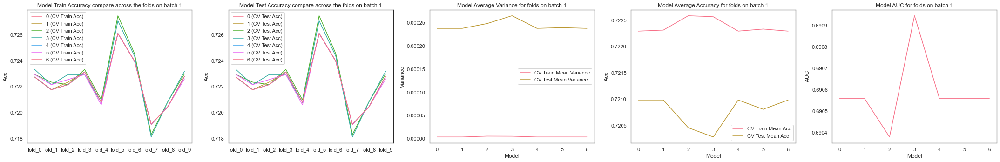

In [92]:
# rerange result df
bat01_CV_10fold_df, bat01_CV_var_macc_df, bat01_auc_df = df_arrange(cv_res = cv_0_1,
                                                                    roc_res = roc_0_1,
                                                                    Model_name = Model_name_0_1,
                                                                    Xy_train_bat = X_y_train_0_1)
draw_res(bat01_CV_10fold_df, bat01_CV_var_macc_df, bat01_auc_df, 1)

In [93]:
OLR_model_01 = OLR_01bat4 # optimal model in batch 1, use globals() in function creat_OLR_model to define model
print(
'''
Model 0, 1, 4, 6 has the same higest mean accuracy, lowest variance, so by looking into hyperparameter,
OLR_01bat4 is faster for large dataset.
Model OLR_01bat4 (solver: sag, penalty: l2)

So OLR_01bat4 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat01_CV_10fold_df.iloc[11].values, bat01_CV_var_macc_df['CV Test'][4], bat01_CV_var_macc_df['CV Test'][11])
)


Model 0, 1, 4, 6 has the same higest mean accuracy, lowest variance, so by looking into hyperparameter,
OLR_01bat4 is faster for large dataset.
Model OLR_01bat4 (solver: sag, penalty: l2)

So OLR_01bat4 is the best model
    - Test accuracy compare across the fold: [0.72280702 0.73684211 0.71403509 0.7245614  0.72807018 0.68541301
 0.71704745 0.74516696 0.7258348  0.71001757]
    - Average test variance: 0.00023755021151074954
    - Average test accuracy: 0.7209795578577374



- Batch 1_2

In [94]:
Xy_train_bat = X_y_train_1_2
batch_name = '12bat'
check_name = 'OLR_12bat'
cv_1_2, roc_1_2, Model_name_1_2 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_12bat0 => solver: newton-cg, penalty: l2
OLR_12bat1 => solver: lbfgs, penalty: l2
OLR_12bat2 => solver: liblinear, penalty: l1
OLR_12bat3 => solver: liblinear, penalty: l2
OLR_12bat4 => solver: sag, penalty: l2
OLR_12bat5 => solver: saga, penalty: l1
OLR_12bat6 => solver: saga, penalty: l2
['OLR_12bat0', 'OLR_12bat1', 'OLR_12bat2', 'OLR_12bat3', 'OLR_12bat4', 'OLR_12bat5', 'OLR_12bat6']


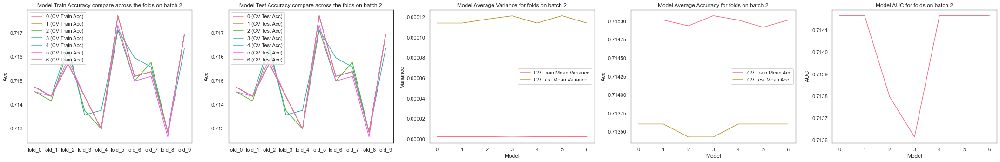

In [95]:
# rerange result df
bat12_CV_10fold_df, bat12_CV_var_macc_df, bat12_auc_df = df_arrange(cv_res = cv_1_2,
                                                                    roc_res = roc_1_2,
                                                                    Model_name = Model_name_1_2,
                                                                    Xy_train_bat = X_y_train_1_2)
draw_res(bat12_CV_10fold_df, bat12_CV_var_macc_df, bat12_auc_df, 2)

In [96]:
OLR_model_12 = OLR_12bat4 # optimal model in batch 2
print(
'''
Model 0, 1, 4, 6 has the same higest mean accuracy, lowest variance, so by looking into hyperparameter,
OLR_45bat4 is faster for large dataset.
Model OLR_12bat4 (solver: sag, penalty: l2)

So OLR_12bat4 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat12_CV_10fold_df.iloc[11].values, bat12_CV_var_macc_df['CV Test'][4], bat12_CV_var_macc_df['CV Test'][11])
)


Model 0, 1, 4, 6 has the same higest mean accuracy, lowest variance, so by looking into hyperparameter,
OLR_45bat4 is faster for large dataset.
Model OLR_12bat4 (solver: sag, penalty: l2)

So OLR_12bat4 is the best model
    - Test accuracy compare across the fold: [0.71578947 0.71929825 0.70877193 0.71578947 0.72982456 0.69947276
 0.70650264 0.72231986 0.72407733 0.69420035]
    - Average test variance: 0.00011407122605798738
    - Average test accuracy: 0.7136046619184164



- Batch 2_3

In [97]:
Xy_train_bat = X_y_train_2_3
batch_name = '23bat'
check_name = 'OLR_23bat'
cv_2_3, roc_2_3, Model_name_2_3 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_23bat0 => solver: newton-cg, penalty: l2
OLR_23bat1 => solver: lbfgs, penalty: l2
OLR_23bat2 => solver: liblinear, penalty: l1
OLR_23bat3 => solver: liblinear, penalty: l2
OLR_23bat4 => solver: sag, penalty: l2
OLR_23bat5 => solver: saga, penalty: l1
OLR_23bat6 => solver: saga, penalty: l2
['OLR_23bat0', 'OLR_23bat1', 'OLR_23bat2', 'OLR_23bat3', 'OLR_23bat4', 'OLR_23bat5', 'OLR_23bat6']


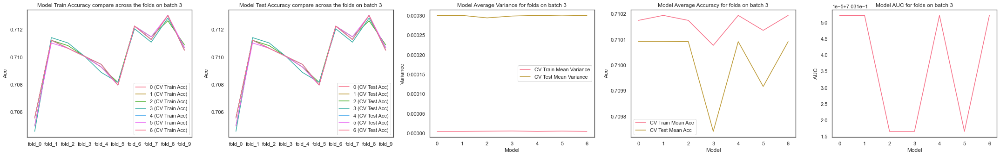

In [98]:
# rerange result df
bat23_CV_10fold_df, bat23_CV_var_macc_df, bat23_auc_df = df_arrange(cv_res = cv_2_3,
                                                                    roc_res = roc_2_3,
                                                                    Model_name = Model_name_2_3,
                                                                    Xy_train_bat = X_y_train_2_3)
draw_res(bat23_CV_10fold_df, bat23_CV_var_macc_df, bat23_auc_df, 3)

In [99]:
OLR_model_23 = OLR_23bat4 # optimal model in batch 3
print(
'''
Model 0, 1, 4, 6 has the same higest mean accuracy, relative low variance, so by looking into hyperparameter,
OLR_23bat4 is faster for large dataset.
Model OLR_23bat4 (solver: sag, penalty: l2)

So OLR_23bat4 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat23_CV_10fold_df.iloc[11].values, bat12_CV_var_macc_df['CV Test'][4], bat12_CV_var_macc_df['CV Test'][11])
)


Model 0, 1, 4, 6 has the same higest mean accuracy, relative low variance, so by looking into hyperparameter,
OLR_23bat4 is faster for large dataset.
Model OLR_23bat4 (solver: sag, penalty: l2)

So OLR_23bat4 is the best model
    - Test accuracy compare across the fold: [0.75438596 0.70526316 0.69473684 0.71052632 0.71403509 0.72407733
 0.69420035 0.69595782 0.69947276 0.70826011]
    - Average test variance: 0.00011407122605798738
    - Average test accuracy: 0.7136046619184164



- Batch 3_4

In [100]:
Xy_train_bat = X_y_train_3_4
batch_name = '34bat'
check_name = 'OLR_34bat'
cv_3_4, roc_3_4, Model_name_3_4 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_34bat0 => solver: newton-cg, penalty: l2
OLR_34bat1 => solver: lbfgs, penalty: l2
OLR_34bat2 => solver: liblinear, penalty: l1
OLR_34bat3 => solver: liblinear, penalty: l2
OLR_34bat4 => solver: sag, penalty: l2
OLR_34bat5 => solver: saga, penalty: l1
OLR_34bat6 => solver: saga, penalty: l2
['OLR_34bat0', 'OLR_34bat1', 'OLR_34bat2', 'OLR_34bat3', 'OLR_34bat4', 'OLR_34bat5', 'OLR_34bat6']


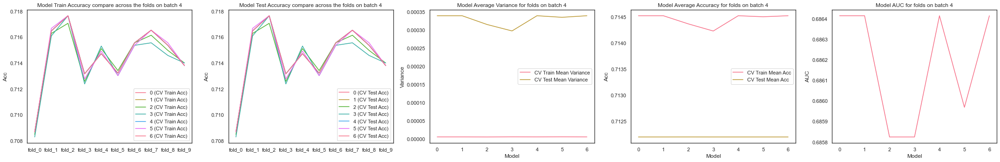

In [101]:
# rerange result df
bat34_CV_10fold_df, bat34_CV_var_macc_df, bat34_auc_df = df_arrange(cv_res = cv_3_4,
                                                                    roc_res = roc_3_4,
                                                                    Model_name = Model_name_3_4,
                                                                    Xy_train_bat = X_y_train_3_4)
draw_res(bat34_CV_10fold_df, bat34_CV_var_macc_df, bat34_auc_df, 4)

In [102]:
OLR_model_34 = OLR_34bat3 # optimal model in batch 4
print(
'''
Model OLR_34bat3 (solver: liblinear, penalty: l2) has the higest mean accuracy, lowest variance

So OLR_34bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat34_CV_10fold_df.iloc[10].values, bat34_CV_var_macc_df['CV Test'][3], bat34_CV_var_macc_df['CV Test'][10])
)


Model OLR_34bat3 (solver: liblinear, penalty: l2) has the higest mean accuracy, lowest variance

So OLR_34bat3 is the best model
    - Test accuracy compare across the fold: [0.75789474 0.7        0.68947368 0.71578947 0.7        0.71353251
 0.70650264 0.71177504 0.71001757 0.71704745]
    - Average test variance: 0.0002977735517276217
    - Average test accuracy: 0.7122033114420497



- Batch 4_5

In [103]:
Xy_train_bat = X_y_train_4_5
batch_name = '45bat'
check_name = 'OLR_45bat'
cv_4_5, roc_4_5, Model_name_4_5 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_45bat0 => solver: newton-cg, penalty: l2
OLR_45bat1 => solver: lbfgs, penalty: l2
OLR_45bat2 => solver: liblinear, penalty: l1
OLR_45bat3 => solver: liblinear, penalty: l2
OLR_45bat4 => solver: sag, penalty: l2
OLR_45bat5 => solver: saga, penalty: l1
OLR_45bat6 => solver: saga, penalty: l2
['OLR_45bat0', 'OLR_45bat1', 'OLR_45bat2', 'OLR_45bat3', 'OLR_45bat4', 'OLR_45bat5', 'OLR_45bat6']


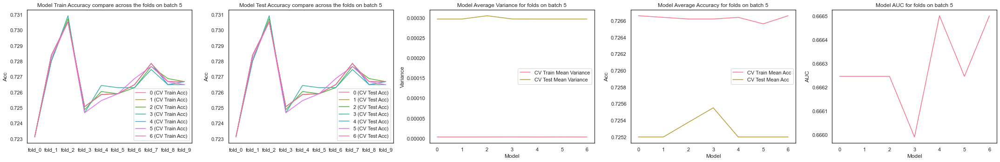

In [104]:
# rerange result df
bat45_CV_10fold_df, bat45_CV_var_macc_df, bat45_auc_df = df_arrange(cv_res = cv_4_5,
                                                                    roc_res = roc_4_5,
                                                                    Model_name = Model_name_4_5,
                                                                    Xy_train_bat = X_y_train_4_5)
draw_res(bat45_CV_10fold_df, bat45_CV_var_macc_df, bat45_auc_df, 5)

In [105]:
OLR_model_45 = OLR_45bat3 # optimal model in batch 5
print(
'''
Model OLR_45bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_45bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat45_CV_10fold_df.iloc[10].values, bat45_CV_var_macc_df['CV Test'][3], bat45_CV_var_macc_df['CV Test'][10])
)


Model OLR_45bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_45bat3 is the best model
    - Test accuracy compare across the fold: [0.75087719 0.71403509 0.68421053 0.73508772 0.72631579 0.7258348
 0.72934974 0.71528998 0.73637961 0.73813708]
    - Average test variance: 0.0002970068726784979
    - Average test accuracy: 0.7255517528443253



- Batch 5_6

In [106]:
Xy_train_bat = X_y_train_5_6
batch_name = '56bat'
check_name = 'OLR_56bat'
cv_5_6, roc_5_6, Model_name_5_6 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_56bat0 => solver: newton-cg, penalty: l2
OLR_56bat1 => solver: lbfgs, penalty: l2
OLR_56bat2 => solver: liblinear, penalty: l1
OLR_56bat3 => solver: liblinear, penalty: l2
OLR_56bat4 => solver: sag, penalty: l2
OLR_56bat5 => solver: saga, penalty: l1
OLR_56bat6 => solver: saga, penalty: l2
['OLR_56bat0', 'OLR_56bat1', 'OLR_56bat2', 'OLR_56bat3', 'OLR_56bat4', 'OLR_56bat5', 'OLR_56bat6']


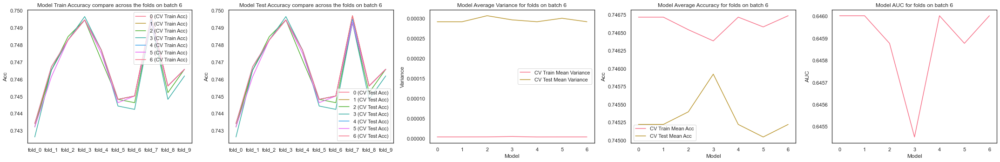

In [107]:
# rerange result df
bat56_CV_10fold_df, bat56_CV_var_macc_df, bat56_auc_df = df_arrange(cv_res = cv_5_6,
                                                                    roc_res = roc_5_6,
                                                                    Model_name = Model_name_5_6,
                                                                    Xy_train_bat = X_y_train_5_6)
draw_res(bat56_CV_10fold_df, bat56_CV_var_macc_df, bat56_auc_df, 6)

In [108]:
OLR_model_56 = OLR_56bat3 # optimal model in batch 6
print(
'''
Model OLR_56bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and second lowest variance.

So OLR_56bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat56_CV_10fold_df.iloc[10].values, bat56_CV_var_macc_df['CV Test'][3], bat56_CV_var_macc_df['CV Test'][10])
)


Model OLR_56bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and second lowest variance.

So OLR_56bat3 is the best model
    - Test accuracy compare across the fold: [0.76666667 0.75087719 0.71929825 0.71754386 0.75087719 0.74692443
 0.76098418 0.72759227 0.76449912 0.75395431]
    - Average test variance: 0.00029670729082367694
    - Average test accuracy: 0.7459217463694385



- Batch 6_7

In [109]:
Xy_train_bat = X_y_train_6_7
batch_name = '67bat'
check_name = 'OLR_67bat'
cv_6_7, roc_6_7, Model_name_6_7 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_67bat0 => solver: newton-cg, penalty: l2
OLR_67bat1 => solver: lbfgs, penalty: l2
OLR_67bat2 => solver: liblinear, penalty: l1
OLR_67bat3 => solver: liblinear, penalty: l2
OLR_67bat4 => solver: sag, penalty: l2
OLR_67bat5 => solver: saga, penalty: l1
OLR_67bat6 => solver: saga, penalty: l2
['OLR_67bat0', 'OLR_67bat1', 'OLR_67bat2', 'OLR_67bat3', 'OLR_67bat4', 'OLR_67bat5', 'OLR_67bat6']


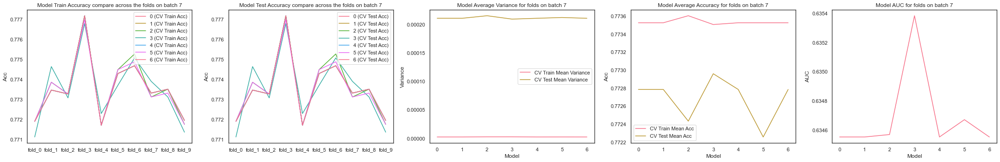

In [110]:
# rerange result df
bat67_CV_10fold_df, bat67_CV_var_macc_df, bat67_auc_df = df_arrange(cv_res = cv_6_7,
                                                                    roc_res = roc_6_7,
                                                                    Model_name = Model_name_6_7,
                                                                    Xy_train_bat = X_y_train_6_7)
draw_res(bat67_CV_10fold_df, bat67_CV_var_macc_df, bat67_auc_df, 7)

In [111]:
OLR_model_67 = OLR_67bat3 # optimal model in batch 7
print(
'''
Model OLR_67bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_67bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat67_CV_10fold_df.iloc[10].values, bat67_CV_var_macc_df['CV Test'][3], bat67_CV_var_macc_df['CV Test'][10])
)


Model OLR_67bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_67bat3 is the best model
    - Test accuracy compare across the fold: [0.79473684 0.76842105 0.75964912 0.74561404 0.79298246 0.77504394
 0.76625659 0.76449912 0.77855888 0.78383128]
    - Average test variance: 0.00020911100461614563
    - Average test accuracy: 0.7729593315450314



- Batch 7_8

In [112]:
Xy_train_bat = X_y_train_7_8
batch_name = '78bat'
check_name = 'OLR_78bat'
cv_7_8, roc_7_8, Model_name_7_8 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_78bat0 => solver: newton-cg, penalty: l2
OLR_78bat1 => solver: lbfgs, penalty: l2
OLR_78bat2 => solver: liblinear, penalty: l1
OLR_78bat3 => solver: liblinear, penalty: l2
OLR_78bat4 => solver: sag, penalty: l2
OLR_78bat5 => solver: saga, penalty: l1
OLR_78bat6 => solver: saga, penalty: l2
['OLR_78bat0', 'OLR_78bat1', 'OLR_78bat2', 'OLR_78bat3', 'OLR_78bat4', 'OLR_78bat5', 'OLR_78bat6']


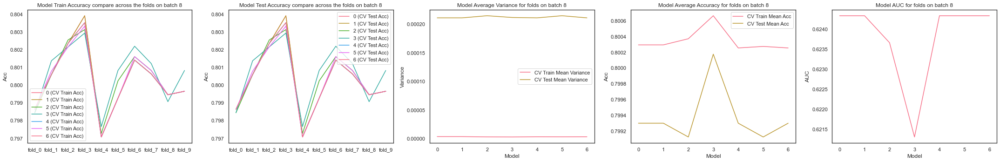

In [113]:
# rerange result df
bat78_CV_10fold_df, bat78_CV_var_macc_df, bat78_auc_df = df_arrange(cv_res = cv_7_8,
                                                                    roc_res = roc_7_8,
                                                                    Model_name = Model_name_7_8,
                                                                    Xy_train_bat = X_y_train_7_8)
draw_res(bat78_CV_10fold_df, bat78_CV_var_macc_df, bat78_auc_df, 8)

In [114]:
OLR_model_78 = OLR_78bat3 # optimal model in batch 8
print(
'''
Model OLR_78bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_78bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat78_CV_10fold_df.iloc[10].values, bat78_CV_var_macc_df['CV Test'][3], bat78_CV_var_macc_df['CV Test'][10])
)


Model OLR_78bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_78bat3 is the best model
    - Test accuracy compare across the fold: [0.82105263 0.79473684 0.79473684 0.77368421 0.82280702 0.80667838
 0.78207381 0.79789104 0.80316344 0.80492091]
    - Average test variance: 0.00021156106902529354
    - Average test accuracy: 0.8001745136126784



- Batch 8_9

In [115]:
Xy_train_bat = X_y_train_8_9
batch_name = '89bat'
check_name = 'OLR_89bat'
cv_8_9, roc_8_9, Model_name_8_9 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                  batch_name = batch_name,
                                                  check_name = check_name)

OLR_89bat0 => solver: newton-cg, penalty: l2
OLR_89bat1 => solver: lbfgs, penalty: l2
OLR_89bat2 => solver: liblinear, penalty: l1
OLR_89bat3 => solver: liblinear, penalty: l2
OLR_89bat4 => solver: sag, penalty: l2
OLR_89bat5 => solver: saga, penalty: l1
OLR_89bat6 => solver: saga, penalty: l2
['OLR_89bat0', 'OLR_89bat1', 'OLR_89bat2', 'OLR_89bat3', 'OLR_89bat4', 'OLR_89bat5', 'OLR_89bat6']


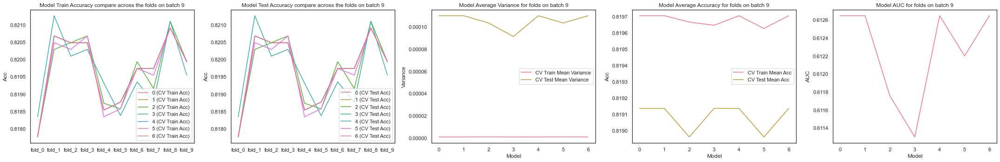

In [116]:
# rerange result df
bat89_CV_10fold_df, bat89_CV_var_macc_df, bat89_auc_df = df_arrange(cv_res = cv_8_9,
                                                                    roc_res = roc_8_9,
                                                                    Model_name = Model_name_8_9,
                                                                    Xy_train_bat = X_y_train_8_9)
draw_res(bat89_CV_10fold_df, bat89_CV_var_macc_df, bat89_auc_df, 9)

In [117]:
OLR_model_89 = OLR_89bat3 # optimal model in batch 9
print(
'''
Model OLR_89bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_89bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat89_CV_10fold_df.iloc[10].values, bat89_CV_var_macc_df['CV Test'][3], bat89_CV_var_macc_df['CV Test'][10])
)


Model OLR_89bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_89bat3 is the best model
    - Test accuracy compare across the fold: [0.83684211 0.81578947 0.81754386 0.80350877 0.83333333 0.8172232
 0.81370826 0.82425308 0.81019332 0.81898067]
    - Average test variance: 9.123140747147954e-05
    - Average test accuracy: 0.8191376067585484



- Batch 9_10

In [118]:
Xy_train_bat = X_y_train_9_10
batch_name = '910bat'
check_name = 'OLR_910bat'
cv_9_10, roc_9_10, Model_name_9_10 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                     batch_name = batch_name,
                                                     check_name = check_name)

OLR_910bat0 => solver: newton-cg, penalty: l2
OLR_910bat1 => solver: lbfgs, penalty: l2
OLR_910bat2 => solver: liblinear, penalty: l1
OLR_910bat3 => solver: liblinear, penalty: l2
OLR_910bat4 => solver: sag, penalty: l2
OLR_910bat5 => solver: saga, penalty: l1
OLR_910bat6 => solver: saga, penalty: l2
['OLR_910bat0', 'OLR_910bat1', 'OLR_910bat2', 'OLR_910bat3', 'OLR_910bat4', 'OLR_910bat5', 'OLR_910bat6']


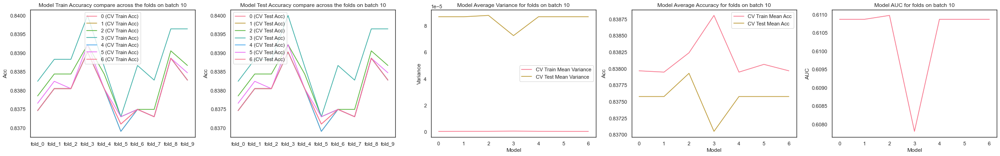

In [119]:
# rerange result df
bat910_CV_10fold_df, bat910_CV_var_macc_df, bat910_auc_df = df_arrange(cv_res = cv_9_10,
                                                                       roc_res = roc_9_10,
                                                                       Model_name = Model_name_9_10,
                                                                       Xy_train_bat = X_y_train_9_10)
draw_res(bat910_CV_10fold_df, bat910_CV_var_macc_df, bat910_auc_df, 10)

In [120]:
OLR_model_910 = OLR_910bat2 # optimal model in batch 10
print(
'''
Model OLR_910bat2 (solver: liblinear, penalty: l1) has the highest mean accuracy and not lowest variance.
but variance differences are small, so model with highest mean accuracy is picked

So OLR_910bat2 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat910_CV_10fold_df.iloc[9].values, bat910_CV_var_macc_df['CV Test'][2], bat910_CV_var_macc_df['CV Test'][9])
)


Model OLR_910bat2 (solver: liblinear, penalty: l1) has the highest mean accuracy and not lowest variance.
but variance differences are small, so model with highest mean accuracy is picked

So OLR_910bat2 is the best model
    - Test accuracy compare across the fold: [0.84561404 0.82982456 0.83684211 0.82105263 0.84912281 0.85237258
 0.83304042 0.84534271 0.83128295 0.83479789]
    - Average test variance: 8.774882901383341e-05
    - Average test accuracy: 0.8379292695711159



- Batch 10_11

In [121]:
Xy_train_bat = X_y_train_10_11
batch_name = '1011bat'
check_name = 'OLR_1011bat'
cv_10_11, roc_10_11, Model_name_10_11 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                        batch_name = batch_name,
                                                        check_name = check_name)

OLR_1011bat0 => solver: newton-cg, penalty: l2
OLR_1011bat1 => solver: lbfgs, penalty: l2
OLR_1011bat2 => solver: liblinear, penalty: l1
OLR_1011bat3 => solver: liblinear, penalty: l2
OLR_1011bat4 => solver: sag, penalty: l2
OLR_1011bat5 => solver: saga, penalty: l1
OLR_1011bat6 => solver: saga, penalty: l2
['OLR_1011bat0', 'OLR_1011bat1', 'OLR_1011bat2', 'OLR_1011bat3', 'OLR_1011bat4', 'OLR_1011bat5', 'OLR_1011bat6']


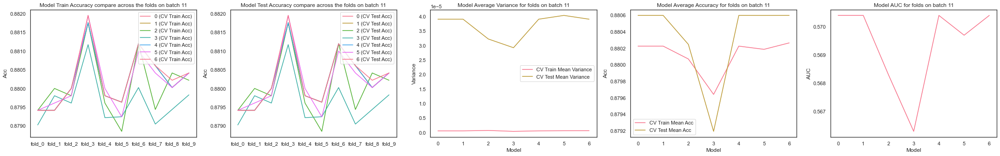

In [122]:
# rerange result df
bat1011_CV_10fold_df, bat1011_CV_var_macc_df, bat1011_auc_df = df_arrange(cv_res = cv_10_11,
                                                                          roc_res = roc_10_11,
                                                                          Model_name = Model_name_10_11,
                                                                          Xy_train_bat = X_y_train_10_11)
draw_res(bat1011_CV_10fold_df, bat1011_CV_var_macc_df, bat1011_auc_df, 11)

In [123]:
OLR_model_1011 = OLR_1011bat4 # optimal model in batch 11
print(
'''
Model 0, 1, 4, 6 has the same higest mean accuracy, same not lowest variance, but variance differences are small,
so by looking into hyperparameter, OLR_01bat4 is faster for large dataset.
Model OLR_1011bat4 (solver: sag, penalty: l2)

So OLR_1011bat4 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat1011_CV_10fold_df.iloc[11].values, bat1011_CV_var_macc_df['CV Test'][4], bat1011_CV_var_macc_df['CV Test'][11])
)


Model 0, 1, 4, 6 has the same higest mean accuracy, same not lowest variance, but variance differences are small,
so by looking into hyperparameter, OLR_01bat4 is faster for large dataset.
Model OLR_1011bat4 (solver: sag, penalty: l2)

So OLR_1011bat4 is the best model
    - Test accuracy compare across the fold: [0.88421053 0.88245614 0.88245614 0.86315789 0.88245614 0.88049209
 0.87873462 0.88400703 0.88752197 0.88049209]
    - Average test variance: 3.906231054362636e-05
    - Average test accuracy: 0.8805984645268706



- Batch 11_12

In [124]:
Xy_train_bat = X_y_train_11_12
batch_name = '1112bat'
check_name = 'OLR_1112bat'
cv_11_12, roc_11_12, Model_name_11_12 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                        batch_name = batch_name,
                                                        check_name = check_name)

OLR_1112bat0 => solver: newton-cg, penalty: l2
OLR_1112bat1 => solver: lbfgs, penalty: l2
OLR_1112bat2 => solver: liblinear, penalty: l1
OLR_1112bat3 => solver: liblinear, penalty: l2
OLR_1112bat4 => solver: sag, penalty: l2
OLR_1112bat5 => solver: saga, penalty: l1
OLR_1112bat6 => solver: saga, penalty: l2
['OLR_1112bat0', 'OLR_1112bat1', 'OLR_1112bat2', 'OLR_1112bat3', 'OLR_1112bat4', 'OLR_1112bat5', 'OLR_1112bat6']


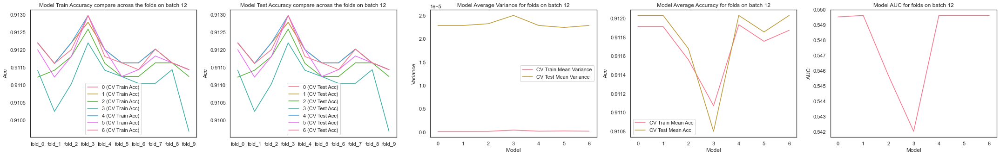

In [125]:
# rerange result df
bat1112_CV_10fold_df, bat1112_CV_var_macc_df, bat1112_auc_df = df_arrange(cv_res = cv_11_12,
                                                                          roc_res = roc_11_12,
                                                                          Model_name = Model_name_11_12,
                                                                          Xy_train_bat = X_y_train_11_12)
draw_res(bat1112_CV_10fold_df, bat1112_CV_var_macc_df, bat1112_auc_df, 12)

In [126]:
OLR_model_1112 = OLR_1112bat4 # optimal model in batch 12
print(
'''
Model 0, 1, 4, 6 has the same higest mean accuracy, lowest variance, so by looking into hyperparameter,
OLR_1112bat4 is faster for large dataset.
Model OLR_1112bat4 (solver: sag, penalty: l2)

So OLR_1112bat4 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat1112_CV_10fold_df.iloc[11].values, bat1112_CV_var_macc_df['CV Test'][4], bat1112_CV_var_macc_df['CV Test'][11])
)


Model 0, 1, 4, 6 has the same higest mean accuracy, lowest variance, so by looking into hyperparameter,
OLR_1112bat4 is faster for large dataset.
Model OLR_1112bat4 (solver: sag, penalty: l2)

So OLR_1112bat4 is the best model
    - Test accuracy compare across the fold: [0.91052632 0.91754386 0.90877193 0.90175439 0.91403509 0.9086116
 0.91739895 0.91388401 0.91036907 0.91739895]
    - Average test variance: 2.2842000353894952e-05
    - Average test accuracy: 0.9120294144852465



- Batch 12_13

In [127]:
Xy_train_bat = X_y_train_12_13
batch_name = '1213bat'
check_name = 'OLR_1213bat'
cv_12_13, roc_12_13, Model_name_12_13 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                        batch_name = batch_name,
                                                        check_name = check_name)

OLR_1213bat0 => solver: newton-cg, penalty: l2
OLR_1213bat1 => solver: lbfgs, penalty: l2
OLR_1213bat2 => solver: liblinear, penalty: l1
OLR_1213bat3 => solver: liblinear, penalty: l2
OLR_1213bat4 => solver: sag, penalty: l2
OLR_1213bat5 => solver: saga, penalty: l1
OLR_1213bat6 => solver: saga, penalty: l2
['OLR_1213bat0', 'OLR_1213bat1', 'OLR_1213bat2', 'OLR_1213bat3', 'OLR_1213bat4', 'OLR_1213bat5', 'OLR_1213bat6']


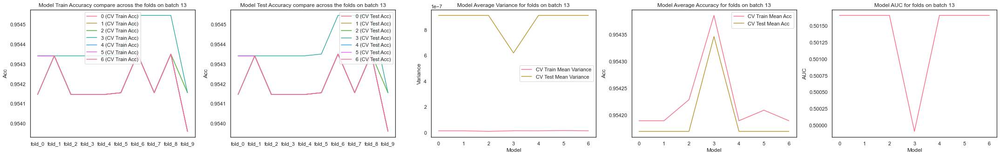

In [128]:
# rerange result df
bat1213_CV_10fold_df, bat1213_CV_var_macc_df, bat1213_auc_df = df_arrange(cv_res = cv_12_13,
                                                                          roc_res = roc_12_13,
                                                                          Model_name = Model_name_12_13,
                                                                          Xy_train_bat = X_y_train_12_13)
draw_res(bat1213_CV_10fold_df, bat1213_CV_var_macc_df, bat1213_auc_df, 13)

In [129]:
OLR_model_1213 = OLR_1213bat3 # optimal model in batch 13
print(
'''
Model OLR_1213bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_1213bat3 is the best model
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat1213_CV_10fold_df.iloc[10].values, bat1213_CV_var_macc_df['CV Test'][3], bat1213_CV_var_macc_df['CV Test'][10])
)


Model OLR_1213bat3 (solver: liblinear, penalty: l2) has the highest mean accuracy and lowest variance.

So OLR_1213bat3 is the best model
    - Test accuracy compare across the fold: [0.95438596 0.95438596 0.95438596 0.95438596 0.95438596 0.9543058
 0.95254833 0.9543058  0.9543058  0.95606327]
    - Average test variance: 6.193462463028057e-07
    - Average test accuracy: 0.9543458822803934



- Batch 13_14

In [130]:
Xy_train_bat = X_y_train_13_14
batch_name = '1314bat'
check_name = 'OLR_1314bat'
cv_13_14, roc_13_14, Model_name_13_14 = creat_OLR_model(Xy_train_bat = Xy_train_bat,
                                                        batch_name = batch_name,
                                                        check_name = check_name)

OLR_1314bat0 => solver: newton-cg, penalty: l2
OLR_1314bat1 => solver: lbfgs, penalty: l2
OLR_1314bat2 => solver: liblinear, penalty: l1
OLR_1314bat3 => solver: liblinear, penalty: l2
OLR_1314bat4 => solver: sag, penalty: l2
OLR_1314bat5 => solver: saga, penalty: l1
OLR_1314bat6 => solver: saga, penalty: l2
['OLR_1314bat0', 'OLR_1314bat1', 'OLR_1314bat2', 'OLR_1314bat3', 'OLR_1314bat4', 'OLR_1314bat5', 'OLR_1314bat6']


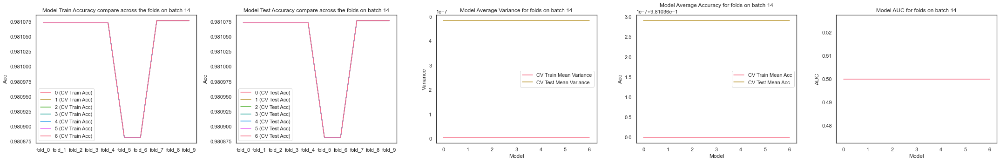

In [131]:
# rerange result df
bat1314_CV_10fold_df, bat1314_CV_var_macc_df, bat1314_auc_df = df_arrange(cv_res = cv_13_14,
                                                                          roc_res = roc_13_14,
                                                                          Model_name = Model_name_13_14,
                                                                          Xy_train_bat = X_y_train_13_14)
draw_res(bat1314_CV_10fold_df, bat1314_CV_var_macc_df, bat1314_auc_df, 14)

In [132]:
OLR_model_1314 = OLR_1314bat4 # optimal model in batch 14
print(
'''
All Model has the same accuracy, variance and AUC, that is because the low number of observation.
So by looking into hyperparameter, OLR_1314bat4 is faster for large dataset.
OLR_1314bat4 (solver: sag, penalty: l2)

So OLR_1314bat4 has
    - Test accuracy compare across the fold: {}
    - Average test variance: {}
    - Average test accuracy: {}
'''.format(bat1314_CV_10fold_df.iloc[11].values, bat1314_CV_var_macc_df['CV Test'][4], bat1314_CV_var_macc_df['CV Test'][11])
)


All Model has the same accuracy, variance and AUC, that is because the low number of observation.
So by looking into hyperparameter, OLR_1314bat4 is faster for large dataset.
OLR_1314bat4 (solver: sag, penalty: l2)

So OLR_1314bat4 has
    - Test accuracy compare across the fold: [0.98070175 0.98070175 0.98070175 0.98070175 0.98070175 0.98242531
 0.98242531 0.98066784 0.98066784 0.98066784]
    - Average test variance: 4.825579870587661e-07
    - Average test accuracy: 0.9810362901982549



### 3.2.3 Summarise the best performing model for each batch

In [133]:
print(
'''
Best Model for each batch:
- Batch 01      - OLR_01bat4      - solver: sag, penalty: l2
- Batch 12      - OLR_12bat4      - solver: sag, penalty: l2
- Batch 23      - OLR_23bat4      - solver: sag, penalty: l2
- Batch 34      - OLR_34bat3      - solver: liblinear, penalty: l2
- Batch 45      - OLR_45bat3      - solver: liblinear, penalty: l2
- Batch 56      - OLR_56bat3      - solver: liblinear, penalty: l2
- Batch 67      - OLR_67bat3      - solver: liblinear, penalty: l2
- Batch 78      - OLR_78bat3      - solver: liblinear, penalty: l2
- Batch 89      - OLR_89bat3      - solver: liblinear, penalty: l2
- Batch 910     - OLR_910bat2     - solver: liblinear, penalty: l1
- Batch 1011    - OLR_1011bat4    - solver: sag, penalty: l2
- Batch 1112    - OLR_1112bat4    - solver: sag, penalty: l2
- Batch 1213    - OLR_1213bat3    - solver: liblinear, penalty: l2
- Batch 1314    - OLR_1314bat4    - solver: sag, penalty: l2
''')


Best Model for each batch:
- Batch 01      - OLR_01bat4      - solver: sag, penalty: l2
- Batch 12      - OLR_12bat4      - solver: sag, penalty: l2
- Batch 23      - OLR_23bat4      - solver: sag, penalty: l2
- Batch 34      - OLR_34bat3      - solver: liblinear, penalty: l2
- Batch 45      - OLR_45bat3      - solver: liblinear, penalty: l2
- Batch 56      - OLR_56bat3      - solver: liblinear, penalty: l2
- Batch 67      - OLR_67bat3      - solver: liblinear, penalty: l2
- Batch 78      - OLR_78bat3      - solver: liblinear, penalty: l2
- Batch 89      - OLR_89bat3      - solver: liblinear, penalty: l2
- Batch 910     - OLR_910bat2     - solver: liblinear, penalty: l1
- Batch 1011    - OLR_1011bat4    - solver: sag, penalty: l2
- Batch 1112    - OLR_1112bat4    - solver: sag, penalty: l2
- Batch 1213    - OLR_1213bat3    - solver: liblinear, penalty: l2
- Batch 1314    - OLR_1314bat4    - solver: sag, penalty: l2



### 3.2.4 Calculate probability of each class for each observation

To find probability of each observation falling into each ordinal category:

$$
\begin{aligned}
&\operatorname{P}(Y = 1 \mid x) = \operatorname{P} (Y \leq 1 \mid x)\\
&\operatorname{P}(Y = j \mid x) = \operatorname{P} (Y \leq j \mid x) - \operatorname{P} (Y \leq j - 1 \mid x),\ \ j = 2, \dots, c - 1\\
&\operatorname{P}(Y = c \mid x) = 1 - \operatorname{P} (Y \leq c - 1 \mid x)\\
\end{aligned}
$$
where,
$$
\operatorname{P}(Y \leq j \mid x)=\frac{e^{g_j(x)}}{1+e^{g_j(x)}}
$$
Then each observation score can be calculated.
$$
s_i=\hat{\pi}_{i 1}+2 \hat{\pi}_{i 2}+\cdots+c \hat{\pi}_{i c}, \quad i=1, \ldots, n
$$

In [134]:
# example
# prob      0.32321         0.154013    0.108605    0.086045    0.0765      0.062473    0.043673    0.035575    0.020969    0.014461    0.03919     0.015908    0.0188      0.000578    0   | sum = 1
# --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# class     0               1	        2	        3	        4	        5	        6	        7	        8	        9	        10	        11	        12	        13	        14
# --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# m0        0.32321         0.67679
# m1        0.477223                    0.522777
# m2        0.585828                                0.414172
# m3        0.671873                                            0.328127
# m4        0.748373                                                        0.251627
# m5        0.810846                                                                    0.189154
# m6        0.854519                                                                                0.145481
# m7        0.890094                                                                                            0.109906
# m8        0.911063                                                                                                        0.088937
# m9        0.925524                                                                                                                    0.074476
# m10       0.964714                                                                                                                                0.035286
# m11       0.980622                                                                                                                                            0.019378
# m12       0.999422                                                                                                                                                        0.000578
# m13       1                                                                                                                                                                           0
# --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# si = 0 * 0.32321 + 1 * 0.154013 + 2 * 0.108605 + 3 * 0.086045 + 4 * 0.0765 + 5 * 0.062473 + 6 * 0.043673 + 7 * 0.035575 + 8 * 0.020969 + 9 * 0.014461 + 10 * 0.03919 + 11 * 0.015908 + 12 * 0.0188 + 13 * 0.000578 + 14 * 0 = 2.856689

In [135]:
# copy dataframe for showing probability result
predict_df = X_y_train.copy(deep=True)
# construct empty col to store probability of each class
for i in range(15):
    predict_df['P' + str(i)] = 0
# construct empty col to store predicted salary and bucket for each obseravtion
predict_df['Pred_Salary_Encoded'] = 0
predict_df['Pred_Salary_Buckets'] = 0
# construct empty col to store probability of greater than previous class
for i in range(1, 15):
    predict_df['Pgt' + str(i)]=0

In [136]:
# calculate probability of each class for each observation
for i in range(len(predict_df)):
    # OLR_model_01
    linear01 = OLR_model_01.intercept_[0]
    df01_col = X_y_train_0_1.columns.tolist()
    for lin in range(len(df01_col)-1):
        # calculate linear alpha+beta*X
        linear01 = linear01 + OLR_model_01.coef_[0,lin] * X_y_train_0_1[df01_col[lin]].iloc[i] # logit(p)
    #Calculating probability of being equal or larger that class 1
    predict_df['Pgt1'].iloc[i] = np.exp(linear01) / (1 + np.exp(linear01)) # p(>1) = e^logit / (1 + e^logit) 
    # Calculating probability of class 0
    predict_df['P0'].iloc[i] = 1 - predict_df['Pgt1'].iloc[i]# p(0) = 1 - (e^logit / (1 + e^logit))

    # OLR_model_12
    linear12 = OLR_model_12.intercept_[0]
    df12_col = X_y_train_1_2.columns.tolist()
    for lin in range(len(df12_col)-1):
        # calculate linear alpha+beta*X
        linear12 = linear12 + OLR_model_12.coef_[0,lin] * X_y_train_1_2[df12_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 2
    predict_df['Pgt2'].iloc[i] = np.exp(linear12) / (1 + np.exp(linear12))
    # Calculating probability of class 1
    predict_df['P1'].iloc[i] = predict_df['Pgt1'].iloc[i] - predict_df['Pgt2'].iloc[i]

    # OLR_model_23
    linear23 = OLR_model_23.intercept_[0]
    df23_col = X_y_train_2_3.columns.tolist()
    for lin in range(len(df23_col)-1):
        # calculate linear alpha+beta*X
        linear23 = linear23 + OLR_model_23.coef_[0,lin] * X_y_train_2_3[df23_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 3
    predict_df['Pgt3'].iloc[i] = np.exp(linear23) / (1 + np.exp(linear23))
    # Calculating probability of class 2
    predict_df['P2'].iloc[i] = predict_df['Pgt2'].iloc[i] - predict_df['Pgt3'].iloc[i]

    # OLR_model_34
    linear34 = OLR_model_34.intercept_[0]
    df34_col = X_y_train_3_4.columns.tolist()
    for lin in range(len(df34_col)-1):
        # calculate linear alpha+beta*X
        linear34 = linear34 + OLR_model_34.coef_[0,lin] * X_y_train_3_4[df34_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 4
    predict_df['Pgt4'].iloc[i] = np.exp(linear34) / (1 + np.exp(linear34))
    # Calculating probability of class 3
    predict_df['P3'].iloc[i] = predict_df['Pgt3'].iloc[i] - predict_df['Pgt4'].iloc[i]

    # OLR_model_45
    linear45 = OLR_model_45.intercept_[0]
    df45_col = X_y_train_4_5.columns.tolist()
    for lin in range(len(df45_col)-1):
        # calculate linear alpha+beta*X
        linear45 = linear45 + OLR_model_45.coef_[0,lin] * X_y_train_4_5[df45_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 5
    predict_df['Pgt5'].iloc[i] = np.exp(linear45) / (1 + np.exp(linear45))
    # Calculating probability of class 4
    predict_df['P4'].iloc[i] = predict_df['Pgt4'].iloc[i] - predict_df['Pgt5'].iloc[i]

    # OLR_model_56
    linear56 = OLR_model_56.intercept_[0]
    df56_col = X_y_train_5_6.columns.tolist()
    for lin in range(len(df56_col)-1):
        # calculate linear alpha+beta*X
        linear56 = linear56 + OLR_model_56.coef_[0,lin] * X_y_train_5_6[df56_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 6
    predict_df['Pgt6'].iloc[i] = np.exp(linear56) / (1 + np.exp(linear56))
    # Calculating probability of class 5
    predict_df['P5'].iloc[i] = predict_df['Pgt5'].iloc[i] - predict_df['Pgt6'].iloc[i]

    # OLR_model_67
    linear67 = OLR_model_67.intercept_[0]
    df67_col = X_y_train_6_7.columns.tolist()
    for lin in range(len(df67_col)-1):
        # calculate linear alpha+beta*X
        linear67 = linear67 + OLR_model_67.coef_[0,lin] * X_y_train_6_7[df67_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 7
    predict_df['Pgt7'].iloc[i] = np.exp(linear67) / (1 + np.exp(linear67))
    # Calculating probability of class 6
    predict_df['P6'].iloc[i] = predict_df['Pgt6'].iloc[i] - predict_df['Pgt7'].iloc[i]

    # OLR_model_78
    linear78 = OLR_model_78.intercept_[0]
    df78_col = X_y_train_7_8.columns.tolist()
    for lin in range(len(df78_col)-1):
        # calculate linear alpha+beta*X
        linear78 = linear78 + OLR_model_78.coef_[0,lin] * X_y_train_7_8[df78_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 8
    predict_df['Pgt8'].iloc[i] = np.exp(linear78) / (1 + np.exp(linear78))
    # Calculating probability of class 7
    predict_df['P7'].iloc[i] = predict_df['Pgt7'].iloc[i] - predict_df['Pgt8'].iloc[i]

    # OLR_model_89
    linear89 = OLR_model_89.intercept_[0]
    df89_col = X_y_train_8_9.columns.tolist()
    for lin in range(len(df89_col)-1):
        # calculate linear alpha+beta*X
        linear89 = linear89 + OLR_model_89.coef_[0,lin] * X_y_train_8_9[df89_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 9
    predict_df['Pgt9'].iloc[i] = np.exp(linear89) / (1 + np.exp(linear89))
    # Calculating probability of class 8
    predict_df['P8'].iloc[i] = predict_df['Pgt8'].iloc[i] - predict_df['Pgt9'].iloc[i]

    # OLR_model_910
    linear910 = OLR_model_910.intercept_[0]
    df910_col = X_y_train_9_10.columns.tolist()
    for lin in range(len(df910_col)-1):
        # calculate linear alpha+beta*X
        linear910 = linear910 + OLR_model_910.coef_[0,lin] * X_y_train_9_10[df910_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 10
    predict_df['Pgt10'].iloc[i] = np.exp(linear910) / (1 + np.exp(linear910))
    # Calculating probability of class 9
    predict_df['P9'].iloc[i] = predict_df['Pgt9'].iloc[i] - predict_df['Pgt10'].iloc[i]

    # OLR_model_1011
    linear1011 = OLR_model_1011.intercept_[0]
    df1011_col = X_y_train_10_11.columns.tolist()
    for lin in range(len(df1011_col)-1):
        # calculate linear alpha+beta*X
        linear1011 = linear1011 + OLR_model_1011.coef_[0,lin] * X_y_train_10_11[df1011_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 11
    predict_df['Pgt11'].iloc[i] = np.exp(linear1011) / (1 + np.exp(linear1011))
    # Calculating probability of class 10
    predict_df['P10'].iloc[i] = predict_df['Pgt10'].iloc[i] - predict_df['Pgt11'].iloc[i]

    # OLR_model_1112
    linear1112 = OLR_model_1112.intercept_[0]
    df1112_col = X_y_train_11_12.columns.tolist()
    for lin in range(len(df1112_col)-1):
        # calculate linear alpha+beta*X
        linear1112 = linear1112 + OLR_model_1112.coef_[0,lin] * X_y_train_11_12[df1112_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 12
    predict_df['Pgt12'].iloc[i] = np.exp(linear1112) / (1 + np.exp(linear1112))
    # Calculating probability of class 11
    predict_df['P11'].iloc[i] = predict_df['Pgt11'].iloc[i] - predict_df['Pgt12'].iloc[i]

    # OLR_model_1213
    linear1213 = OLR_model_1213.intercept_[0]
    df1213_col = X_y_train_12_13.columns.tolist()
    for lin in range(len(df1213_col)-1):
        # calculate linear alpha+beta*X
        linear1213 = linear1213 + OLR_model_1213.coef_[0,lin] * X_y_train_11_12[df1213_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 13
    predict_df['Pgt13'].iloc[i] = np.exp(linear1213) / (1 + np.exp(linear1213))
    # Calculating probability of class 12
    predict_df['P12'].iloc[i] = predict_df['Pgt12'].iloc[i] - predict_df['Pgt13'].iloc[i]

    # OLR_model_1314
    linear1314 = OLR_model_1314.intercept_[0]
    df1314_col = X_y_train_13_14.columns.tolist()
    for lin in range(len(df1213_col)-1):
        # calculate linear alpha+beta*X
        linear1314 = linear1314 + OLR_model_1314.coef_[0,lin] * X_y_train_13_14[df1314_col[lin]].iloc[i]
    #Calculating probability of being equal or larger that class 14
    predict_df['Pgt14'].iloc[i] = np.exp(linear1314) / (1 + np.exp(linear1314))
    # Calculating probability of class 13
    predict_df['P13'].iloc[i] = predict_df['Pgt13'].iloc[i] - predict_df['Pgt14'].iloc[i]

    # Calculating probability of class 14
    predict_df['P14'].iloc[i] = predict_df['Pgt14'].iloc[i]
    # Calculate class of each observation
    predict_df['Pred_Salary_Encoded'].iloc[i] = np.argmax(predict_df.loc[:,'P0':'P14'].iloc[i])
    

In [137]:
# reverse mapping the predicted salary bucket 
predict_df['Pred_Salary_Buckets'] = predict_df['Pred_Salary_Encoded'].map(salary_rbucket)
predict_df.loc[:,'Salary_Encoded':'Pred_Salary_Buckets']

,Salary_Encoded,P0,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,Pred_Salary_Encoded,Pred_Salary_Buckets
172,13.0,0.116450,0.066645,0.085246,0.085510,0.089027,0.095657,0.092683,0.083327,0.065469,0.039844,0.091631,0.037171,0.026025,0.015503,0.009812,0,"0-9,999"
1428,0.0,0.902933,0.038514,0.016535,0.005601,0.004584,0.002432,0.006047,0.006018,0.002771,0.004487,0.003007,0.003559,0.000324,0.001652,0.001535,0,"0-9,999"
2433,10.0,0.050248,0.032665,0.035754,0.049032,0.063629,0.069634,0.053760,0.045774,0.051500,0.019342,0.146322,0.098587,0.156217,0.083859,0.043677,12,"150,000-199,999"
483,8.0,0.120100,0.059532,0.069053,0.062822,0.050922,0.052851,0.045358,0.052063,0.047070,0.032289,0.094171,0.098637,0.115388,0.067326,0.032419,0,"0-9,999"
6368,13.0,0.080708,0.028232,0.040249,0.044421,0.018943,0.027643,0.027493,0.029414,0.020708,0.027462,0.091380,0.077709,0.233006,0.146877,0.105755,12,"150,000-199,999"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4931,11.0,0.431424,0.140489,0.093091,0.054888,0.046565,0.027651,0.032249,0.034770,0.023029,0.022868,0.031537,0.026078,0.013262,0.013390,0.008708,0,"0-9,999"
3264,4.0,0.376127,0.137710,0.077053,0.066855,0.023320,0.040081,0.043758,0.032314,0.020472,0.031042,0.043655,0.041688,0.031602,0.018367,0.015955,0,"0-9,999"
1653,0.0,0.610321,0.119435,0.058533,0.031407,0.035784,0.012041,0.015532,0.015882,0.008881,0.014136,0.014829,0.029251,0.011169,0.014871,0.007928,0,"0-9,999"
2607,4.0,0.202237,0.096927,0.098708,0.085645,0.069841,0.081011,0.076578,0.074417,0.050227,0.039606,0.059806,0.028407,0.018008,0.010758,0.007825,0,"0-9,999"


- Scaling/Normalization or not?

In [138]:
print(
'''
Scaling/Normalization is not used.
Scaling/Normalization makes all features to a similar scale, but since all features and target data are all encoded categorical data.
There is not much scale difference hence no need to normalize categorical variables.
'''
)


Scaling/Normalization is not used.
Scaling/Normalization makes all features to a similar scale, but since all features and target data are all encoded categorical data.
There is not much scale difference hence no need to normalize categorical variables.



## 4.Model tuning

### 4.1 Tuning Strategies

- Use GridSearchCV function to tune 14 models in 14 batches separately with 3 hyperparameters, then use the most suitable performance measure to decide which best hyperparameters we should used.

- Hyperparameters: solver, penalty and c (Inverse of regularization strength) of Logistic Regression Model
    - solver: ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
    - penaltys: ['l1','l2']
    - c: np.linspace(0.01, 1, 70)

- notice: not all solver suitable for all penality, supported penalties by solver:
    - newton-cg - ['l2']
    - lbfgs - ['l2']
    - liblinear - ['l1', 'l2']
    - sag - ['l2']
    - saga - [elasticnet, 'l1', 'l2']

- Justification of hyperparameter selection

In [139]:
print(
'''
Justification of hyperparameter selection:
In this part, since the algorithm is implemented based on logistic regression. So three hyperparameters
are selected, which are solver, penality and inverse of regularization strength of logistic regression 
model.
    - solver is the algorithm that finding the local optimum of the minimum loss function.
        - 'newton-cg': newton method, iteratively optimize the loss function using the second derivative
                       matrix of the loss function (Hessian matrix), not penalise on intercept.
        - 'lbfgs': quasi-newton method, similar to newton-cg
        - 'liblinear': gradient descent (coordinate descent) for binary classification, penalise on 
                       intercept.
        - 'sag': stochastic average gradient descent, not penalise on intercept.
        - 'saga': an evolution of stochastic average gradient descent, not penalise on intercept.

    - penalty is the parameter for avoiding overfitting, which add a regular term to loss function.
        - 'l1' for L1 norm
        - 'l2' for L2 norm

    - c is the inverse of the regularization strength.
        The small c is, the heavier penality for loss function, the stronger regularization effect,
        the more severe penality for overfitting, and the smaller weight.
'''
)


Justification of hyperparameter selection:
In this part, since the algorithm is implemented based on logistic regression. So three hyperparameters
are selected, which are solver, penality and inverse of regularization strength of logistic regression 
model.
    - solver is the algorithm that finding the local optimum of the minimum loss function.
        - 'newton-cg': newton method, iteratively optimize the loss function using the second derivative
                       matrix of the loss function (Hessian matrix), not penalise on intercept.
        - 'lbfgs': quasi-newton method, similar to newton-cg
        - 'liblinear': gradient descent (coordinate descent) for binary classification, penalise on 
                       intercept.
        - 'sag': stochastic average gradient descent, not penalise on intercept.
        - 'saga': an evolution of stochastic average gradient descent, not penalise on intercept.

    - penalty is the parameter for avoiding overfitting, which add a regu

- Performance measrues: 'neg_log_loss', 'accuracy', 'balanced_accuracy', 'f1', 'precision', 'recall'
- But we mainly focus on 'neg_log_loss'

- Justification why focus on 'neg_log_loss'

In [140]:
print(
'''
Justification of performance mesasure selection:
In this part, when using gridsearchCV to find best hyperparameters, we have several scoring options:
    - 'neg_log_loss': also called cross-entropy loss, computes log loss given a list of ground-truth 
                      labels and a probability matrix, as returned by an estimator's predict probability 
                      method. It heavily penalises classifiers that are confident about an incorrect 
                      classification, which gauges the confidence of the model performance,
                      value close to 0 is good.
    - 'accuracy': fraction of correct predictions
    - 'balanced_accuracy': fraction of correct predictions for imbalanced datasets
    - 'f1': harmonic mean of the precision and recall, best value is 1 and the worst value is 0.
    - 'precision': ability of the classifier not to label as positive a sample that is negative,
                   best value is 1 and the worst value is 0.
    - 'recall': ability of the classifier to find all the positive samples, best value is 1 and 
                the worst value is 0.

So for our model, neg_log_loss is the most suitable since the salary target class is imbalanced, 
especially for the last batches 13-14. If accuracy, f1, precision and recall are applied, 
and the output probability of 13th model might be all 0, which is hard to evaluate the model
performance.
'''
)


Justification of performance mesasure selection:
In this part, when using gridsearchCV to find best hyperparameters, we have several scoring options:
    - 'neg_log_loss': also called cross-entropy loss, computes log loss given a list of ground-truth 
                      labels and a probability matrix, as returned by an estimator's predict probability 
                      method. It heavily penalises classifiers that are confident about an incorrect 
                      classification, which gauges the confidence of the model performance,
                      value close to 0 is good.
    - 'accuracy': fraction of correct predictions
    - 'balanced_accuracy': fraction of correct predictions for imbalanced datasets
    - 'f1': harmonic mean of the precision and recall, best value is 1 and the worst value is 0.
    - 'precision': ability of the classifier not to label as positive a sample that is negative,
                   best value is 1 and the worst value is 0.
    - 'reca

### 4.2 Tuning and Check Model Performances

- Function to gridsearch optimal hyperparameter for Ordinal Logistic Regression Models on specific domain (batches)

In [141]:
def gridsearch_OLR_hyp(Xy_train_bat, fignum, performance_measure, gs):
    print('---------------------------{}---------------------------'.format(performance_measure))
    # batch data input
    X_tra01 = Xy_train_bat.iloc[:,:-1]
    y_tra01 = Xy_train_bat.Salary_Encoded
    # construct tuning hyperparameters dictionary for gridsearch
    solvers = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
    penaltys = ['l1','l2']
    c_range = np.linspace(0.01, 2, 50).tolist()
    hyperparameters = dict(solver = solvers, penalty = penaltys, C = c_range)
    # model init
    tune_model = LogisticRegression(max_iter = 1000, n_jobs = -1)
    # grid init and fit data into grid
    grid = GridSearchCV(tune_model, hyperparameters, cv = StratifiedKFold(n_splits=10), scoring = performance_measure, return_train_score = True, n_jobs = -1)
    grid.fit(X_tra01,y_tra01)
    # show best neg_log_loss score
    print('best {} score: {}'.format(performance_measure, grid.best_score_))
    print('best hyperparameters:', grid.best_params_)
    print(grid.best_estimator_)
    # parameter to return
    opt_solver = grid.best_params_['solver']
    opt_penalty = grid.best_params_['penalty'] 
    opt_c = grid.best_params_['C']

    # get cv results
    test_means = grid.cv_results_['mean_test_score']
    test_stds = grid.cv_results_['std_test_score']
    train_means = grid.cv_results_[ 'mean_train_score' ]
    train_stds = grid.cv_results_[ 'std_train_score' ]
    # data for ploting
    n_solvers = len(solvers)
    n_Cs = len(c_range)
    number_penaltys = len(penaltys)
    test_scores = np.array(test_means).reshape(n_Cs, number_penaltys, n_solvers)
    train_scores = np.array(train_means).reshape(n_Cs, number_penaltys, n_solvers)
    test_stds = np.array(test_stds).reshape(n_Cs, number_penaltys, n_solvers)
    train_stds = np.array(train_stds).reshape(n_Cs, number_penaltys, n_solvers)

    # ploting
    x_axis = np.log10(c_range)
    # Train in GridCV log(C)
    for i, value1 in enumerate(solvers):
        for j, value2 in enumerate(penaltys):
            ax = plt.subplot(gs[fignum+0])
         # plt.plot(log(Cs), test_scores[i], label= 'penalty:'   + str(value))
            plt.errorbar(x_axis, train_scores[:, j, i], yerr = train_stds[:,j,i], label = solvers[i] + ' ' + penaltys[j] +' Train',
                        elinewidth = 0.5, capsize = 2, capthick = 1)
            plt.title('{} VS log(C) - Train in GridsearchCV '.format(str.title(performance_measure)))
            plt.xlabel('log(C) - Inverse of regularization strength')                                                                                                       
            plt.ylabel('Train score ({})'.format(str.title(performance_measure)))
            plt.legend(loc="lower right")
    # Train in GridCV
    for i, value1 in enumerate(solvers):
        for j, value2 in enumerate(penaltys):
            ax = plt.subplot(gs[fignum+1])
            # plt.plot(log(Cs), test_scores[i], label= 'penalty:'   + str(value))
            plt.errorbar(c_range, train_scores[:, j, i], yerr = train_stds[:,j,i], label = solvers[i] + ' ' + penaltys[j] +' Train',
                        elinewidth = 0.5, capsize = 2, capthick = 1)
            plt.title('{} VS C - Train in GridsearchCV '.format(str.title(performance_measure)))
            plt.xlabel('C - Inverse of regularization strength')                                                                                                       
            plt.ylabel('Train score ({})'.format(str.title(performance_measure)))
            plt.legend(loc="lower right")
    # Test in GridCV log(C)
    for i, value1 in enumerate(solvers):
        for j, value2 in enumerate(penaltys):
            ax = plt.subplot(gs[fignum+2])
            # plt.plot(log(Cs), test_scores[i], label= 'penalty:'   + str(value))
            plt.errorbar(x_axis, test_scores[:, j, i], yerr = test_stds[:, j, i], label = solvers[i] + ' ' + penaltys[j] + ' Test',
                        elinewidth = 0.5, capsize = 2, capthick = 1)
            plt.title('{} VS log(C) - Test in GridsearchCV '.format(str.title(performance_measure)))
            plt.xlabel('log(C) - Inverse of regularization strength')                                                                                                      
            plt.ylabel('Test score ({})'.format(str.title(performance_measure)))
            plt.legend(loc="lower right")
    # Test in GridCV
    for i, value1 in enumerate(solvers):
        for j, value2 in enumerate(penaltys):
            ax = plt.subplot(gs[fignum+3])
            # plt.plot(log(Cs), test_scores[i], label= 'penalty:'   + str(value))
            plt.errorbar(c_range, test_scores[:, j, i], yerr = test_stds[:, j, i], label = solvers[i] + ' ' + penaltys[j] + ' Test',
                        elinewidth = 0.5, capsize = 2, capthick = 1)
            plt.title('{} VS C - Test in GridsearchCV '.format(str.title(performance_measure)))
            plt.xlabel('C - Inverse of regularization strength')                                                                                                      
            plt.ylabel('Test score ({})'.format(str.title(performance_measure)))
            plt.legend(loc="lower right")

    return opt_solver, opt_penalty, opt_c

- Function combines gridsearch_OLR_hyp to visualise the performance results (neg_log_loss, accuracym, balanced_accuracy, f1, precision, recall).

In [142]:
def vis_performances(Xy_train_bat):
    Xy_train_bat = Xy_train_bat # batch 01

    # plot all results in same Axes
    plt.style.use('ggplot')
    plt.figure(figsize=(30, 6*4))
    gs = gridspec.GridSpec(6, 4)

    # 'neg_log_loss'
    opt_solver_lgls, opt_penalty_lgls, opt_c_lgls = gridsearch_OLR_hyp(Xy_train_bat = Xy_train_bat, fignum = 0, performance_measure = 'neg_log_loss', gs = gs)
    # 'accuracy'
    opt_solver_acc, opt_penalty_acc, opt_c_acc = gridsearch_OLR_hyp(Xy_train_bat = Xy_train_bat, fignum = 4, performance_measure = 'accuracy', gs = gs)
    # 'balanced_accuracy'
    opt_solver_bacc, opt_penalty_bacc, opt_c_bacc = gridsearch_OLR_hyp(Xy_train_bat = Xy_train_bat, fignum = 8, performance_measure = 'balanced_accuracy', gs = gs)
    # 'f1'
    opt_solver_f1, opt_penalty_f1, opt_c_f1 = gridsearch_OLR_hyp(Xy_train_bat = Xy_train_bat, fignum = 12, performance_measure = 'f1', gs = gs)
    # 'precision'
    opt_solver_p, opt_penalty_p, opt_c_p = gridsearch_OLR_hyp(Xy_train_bat = Xy_train_bat, fignum = 16, performance_measure = 'precision', gs = gs)
    # 'recall'
    opt_solver_r, opt_penality_r, opt_c_r = gridsearch_OLR_hyp(Xy_train_bat = Xy_train_bat, fignum = 20, performance_measure = 'recall', gs = gs)
    
    plt.tight_layout()
    plt.show()
    # we mainly focus on neg_log_loss result
    return opt_solver_lgls, opt_penalty_lgls, opt_c_lgls

- Batch 01 -> Tuned_OLR_0

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.5491090871331107
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'lbfgs'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1)
---------------------------accuracy---------------------------
best accuracy score: 0.7216813122437024
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, solver='newton-cg')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6898627781411857
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='newton-cg')
---------------------------f1---------------------------
best f1 score: 0.7930484919695997
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}
Log

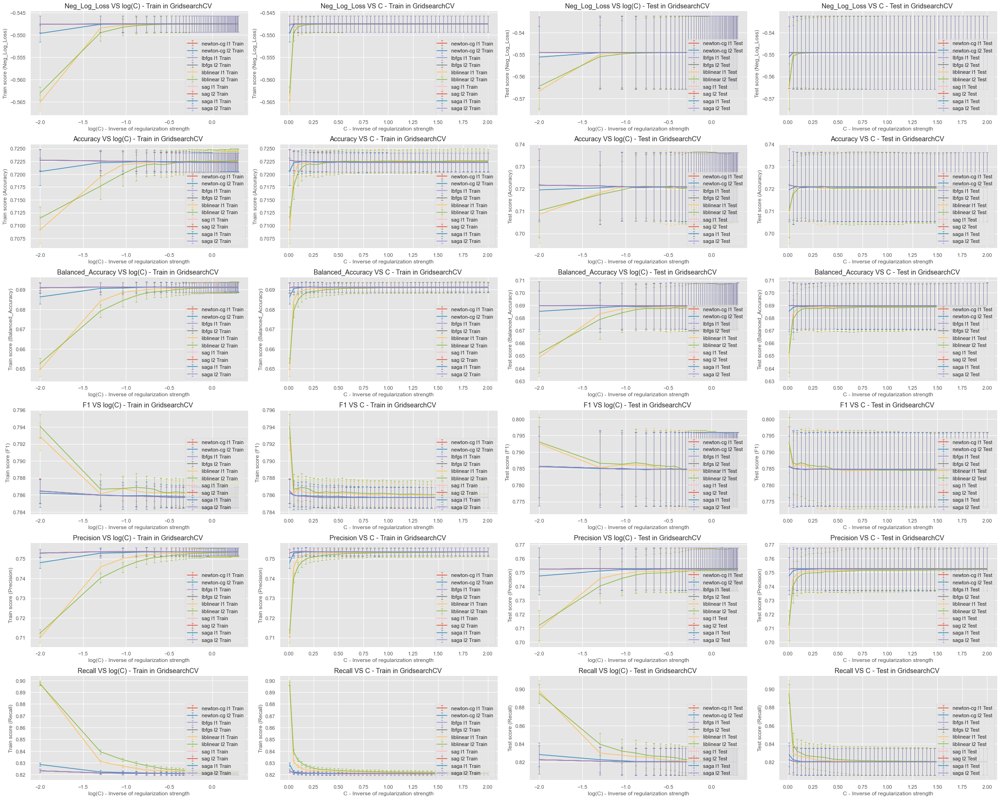

In [143]:
Xy_train_bat = X_y_train_0_1 # batch 01
opt_solver_0_lgls, opt_penalty_0_lgls, opt_c_0_lgls = vis_performances(Xy_train_bat)

- Batch 12 -> Tuned_OLR_1

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.567574905705209
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.7153599728671415
best hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'saga'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='saga')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.715028405490332
best hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'saga'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='saga')
---------------------------f1---------------------------
best f1 score: 0.7373097718687049
best hyperparameters: {'C': 0.01, 'penalty': 'l2'

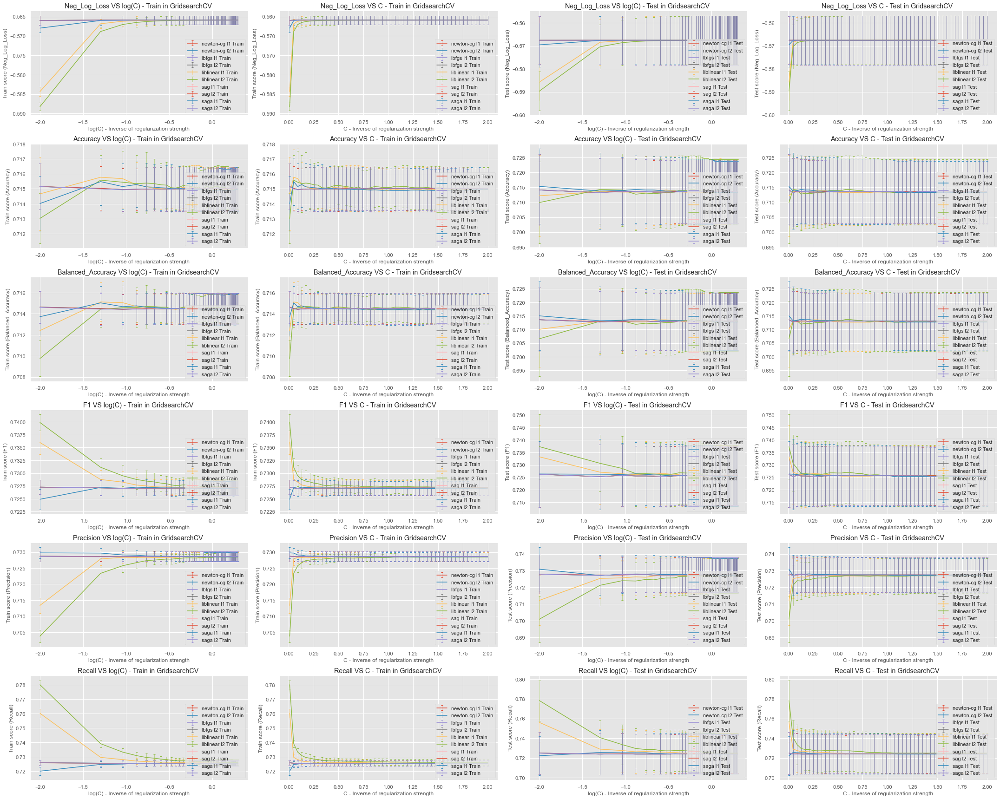

In [144]:
Xy_train_bat = X_y_train_1_2 # batch 12
opt_solver_1_lgls, opt_penalty_1_lgls, opt_c_1_lgls = vis_performances(Xy_train_bat)

- Batch 23 -> Tuned_OLR_2

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.5647668656189617
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'sag'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='sag')
---------------------------accuracy---------------------------
best accuracy score: 0.7104430672463231
best hyperparameters: {'C': 0.21306122448979592, 'penalty': 'l1', 'solver': 'saga'}
LogisticRegression(C=0.21306122448979592, max_iter=1000, n_jobs=-1,
                   penalty='l1', solver='saga')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.7038847838749086
best hyperparameters: {'C': 0.2942857142857143, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=0.2942857142857143, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------f1---------------------------
best f1 score: 0.665831942738

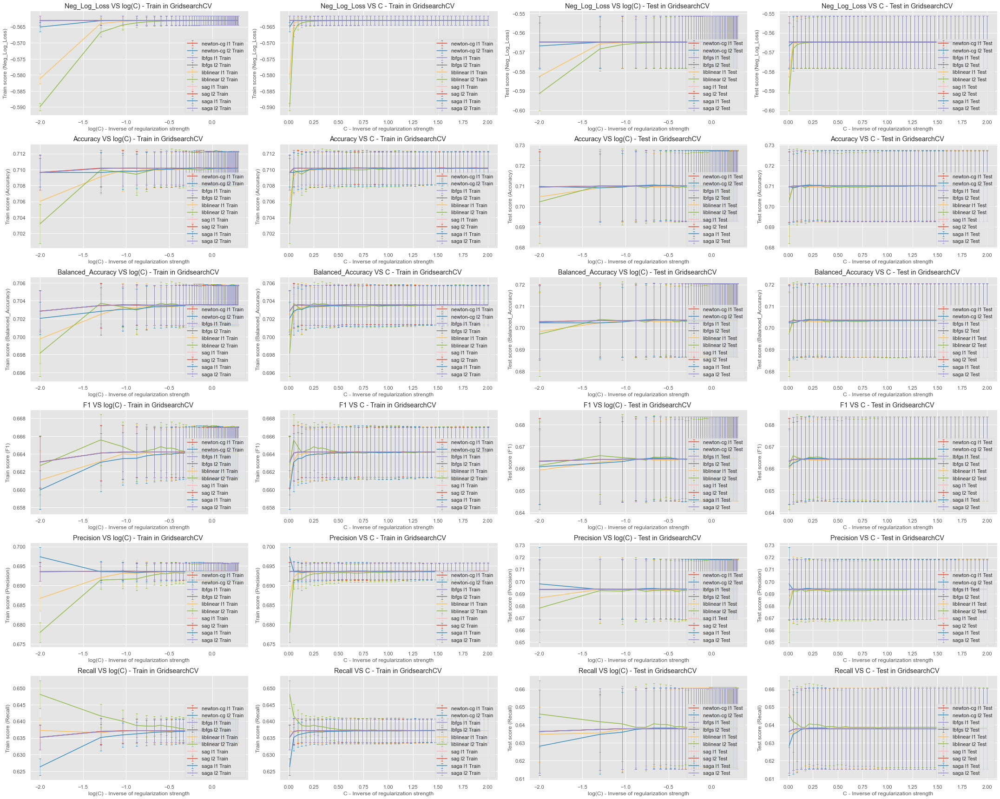

In [145]:
Xy_train_bat = X_y_train_2_3 # batch 23
opt_solver_2_lgls, opt_penalty_2_lgls, opt_c_2_lgls = vis_performances(Xy_train_bat)

- Batch 34 -> Tuned_OLR_3

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.5550717770160867
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'sag'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, solver='sag')
---------------------------accuracy---------------------------
best accuracy score: 0.7127302438873986
best hyperparameters: {'C': 1.3908163265306124, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=1.3908163265306124, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6845101402900944
best hyperparameters: {'C': 1.3908163265306124, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=1.3908163265306124, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------f1---------------------------
best f1 score: 0.6017977236151518
best hyperparameters: {'C': 1.3908163265306124, 'p

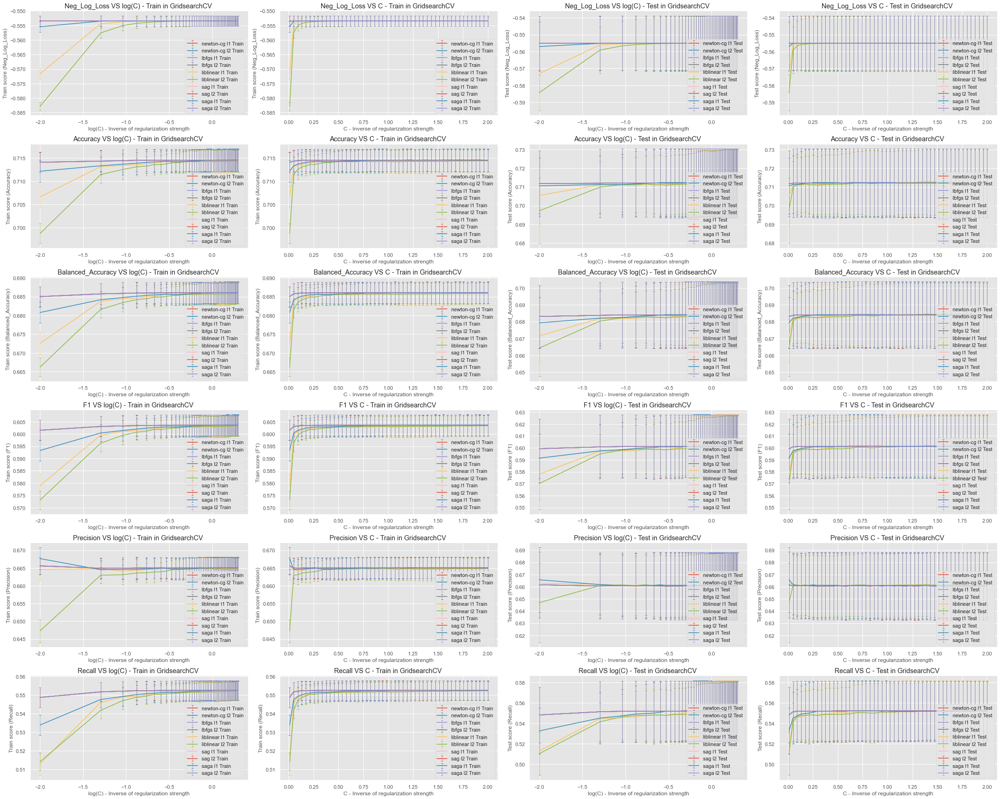

In [146]:
Xy_train_bat = X_y_train_3_4 # batch 34
opt_solver_3_lgls, opt_penalty_3_lgls, opt_c_3_lgls = vis_performances(Xy_train_bat)

- Batch 45 -> Tuned_OLR_4

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.5336730764605755
best hyperparameters: {'C': 0.09122448979591836, 'penalty': 'l1', 'solver': 'saga'}
LogisticRegression(C=0.09122448979591836, max_iter=1000, n_jobs=-1,
                   penalty='l1', solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.7257274997687541
best hyperparameters: {'C': 0.13183673469387755, 'penalty': 'l1', 'solver': 'saga'}
LogisticRegression(C=0.13183673469387755, max_iter=1000, n_jobs=-1,
                   penalty='l1', solver='saga')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6650914847087713
best hyperparameters: {'C': 0.13183673469387755, 'penalty': 'l1', 'solver': 'saga'}
LogisticRegression(C=0.13183673469387755, max_iter=1000, n_jobs=-1,
                   penalty='l1', solver='saga')
---------------------------f1---------------------------
best f1

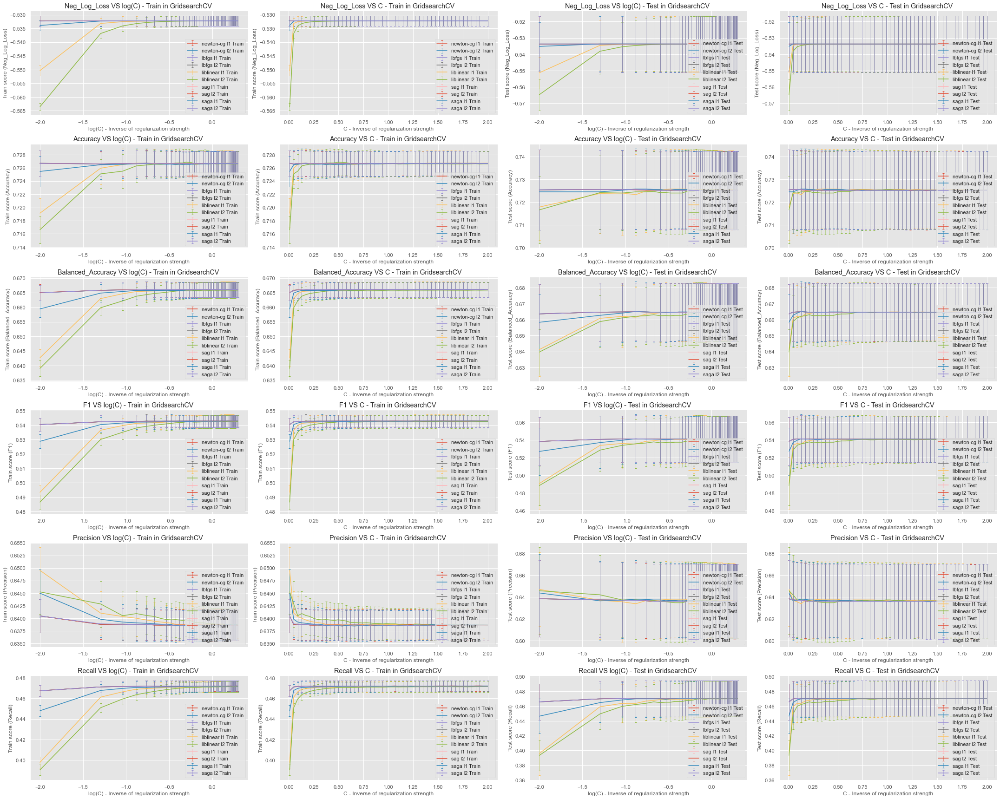

In [147]:
Xy_train_bat = X_y_train_4_5 # batch 45
opt_solver_4_lgls, opt_penalty_4_lgls, opt_c_4_lgls = vis_performances(Xy_train_bat)

- Batch 56 -> Tuned_OLR_5

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.5058362927981326
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'sag'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, solver='sag')
---------------------------accuracy---------------------------
best accuracy score: 0.7462735485462337
best hyperparameters: {'C': 0.17244897959183675, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=0.17244897959183675, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6458790358248562
best hyperparameters: {'C': 1.4314285714285715, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=1.4314285714285715, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------f1---------------------------
best f1 score: 0.4827689925180292
best hyperparameters: {'C': 1.4314285714285715, 

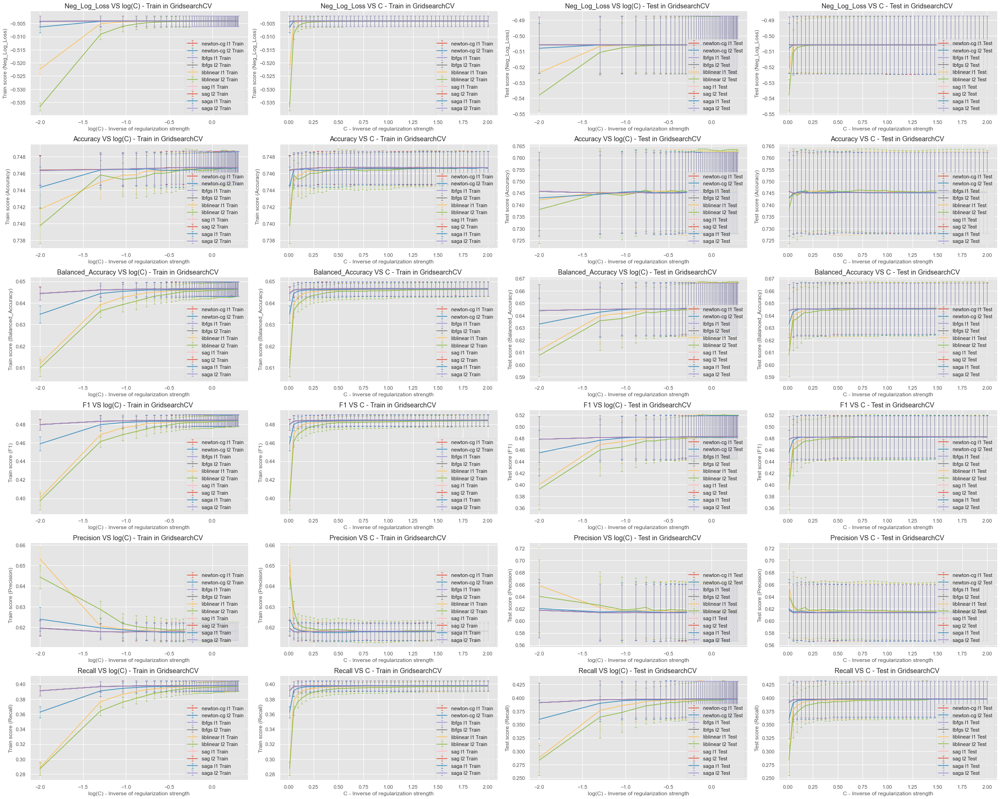

In [148]:
Xy_train_bat = X_y_train_5_6 # batch 56
opt_solver_5_lgls, opt_penalty_5_lgls, opt_c_5_lgls = vis_performances(Xy_train_bat)

- Batch 67 -> Tuned_OLR_6

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.47075617127627023
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, solver='newton-cg')
---------------------------accuracy---------------------------
best accuracy score: 0.773310825393889
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, solver='newton-cg')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6347820232418916
best hyperparameters: {'C': 0.17244897959183675, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.17244897959183675, max_iter=1000, n_jobs=-1,
                   solver='newton-cg')
---------------------------f1---------------------------
best f1 score: 0.44256063666078466
best hyperparameters: {'C': 0.13183673469387755, 'penalty': 'l2', 'solver': 'sag'}

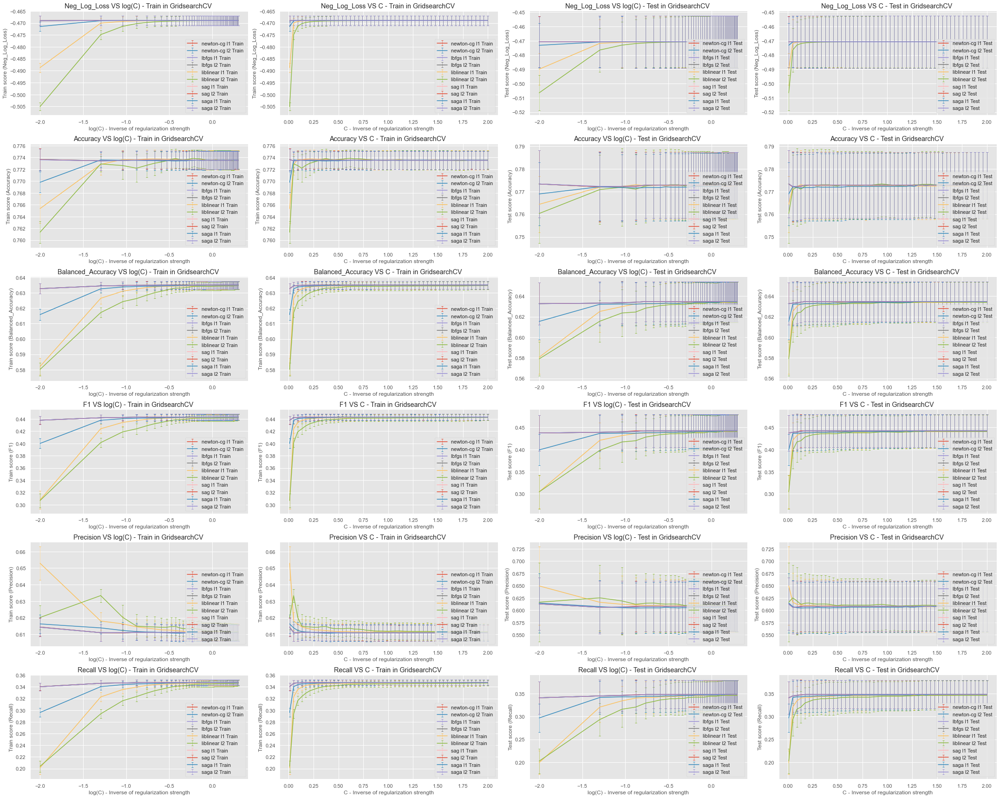

In [149]:
Xy_train_bat = X_y_train_6_7 # batch 67
opt_solver_6_lgls, opt_penalty_6_lgls, opt_c_6_lgls = vis_performances(Xy_train_bat)

- Batch 78 -> Tuned_OLR_7

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.43049163155689785
best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, solver='newton-cg')
---------------------------accuracy---------------------------
best accuracy score: 0.8014053587395553
best hyperparameters: {'C': 0.2942857142857143, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=0.2942857142857143, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6232647254662557
best hyperparameters: {'C': 0.7816326530612245, 'penalty': 'l2', 'solver': 'sag'}
LogisticRegression(C=0.7816326530612245, max_iter=1000, n_jobs=-1, solver='sag')
---------------------------f1---------------------------
best f1 score: 0.4041140015087625
best hyperparameters: {'C': 0.7410204081632653, 'penalty': 'l2', 'so

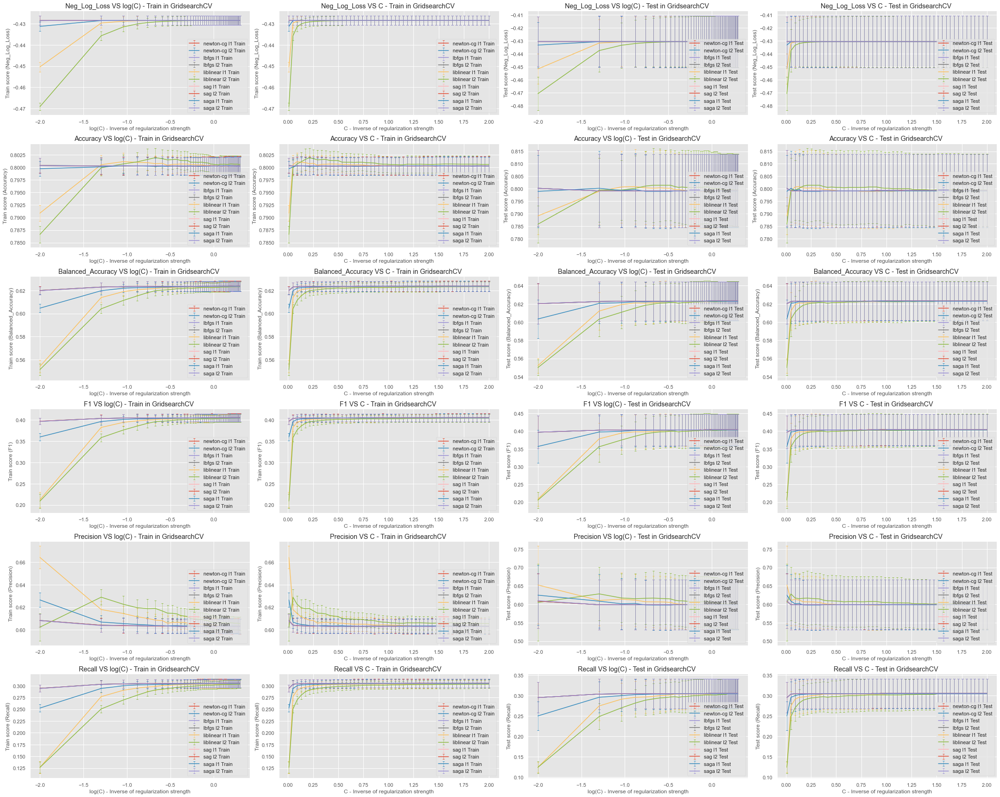

In [150]:
Xy_train_bat = X_y_train_7_8 # batch 78
opt_solver_7_lgls, opt_penalty_7_lgls, opt_c_7_lgls = vis_performances(Xy_train_bat)

- Batch 89 -> Tuned_OLR_8

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.39880031392890747
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.8208950760028367
best hyperparameters: {'C': 0.13183673469387755, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=0.13183673469387755, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.611964713230309
best hyperparameters: {'C': 1.553265306122449, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=1.553265306122449, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------f1---------------------------
best f1 score: 0.3700741000326731

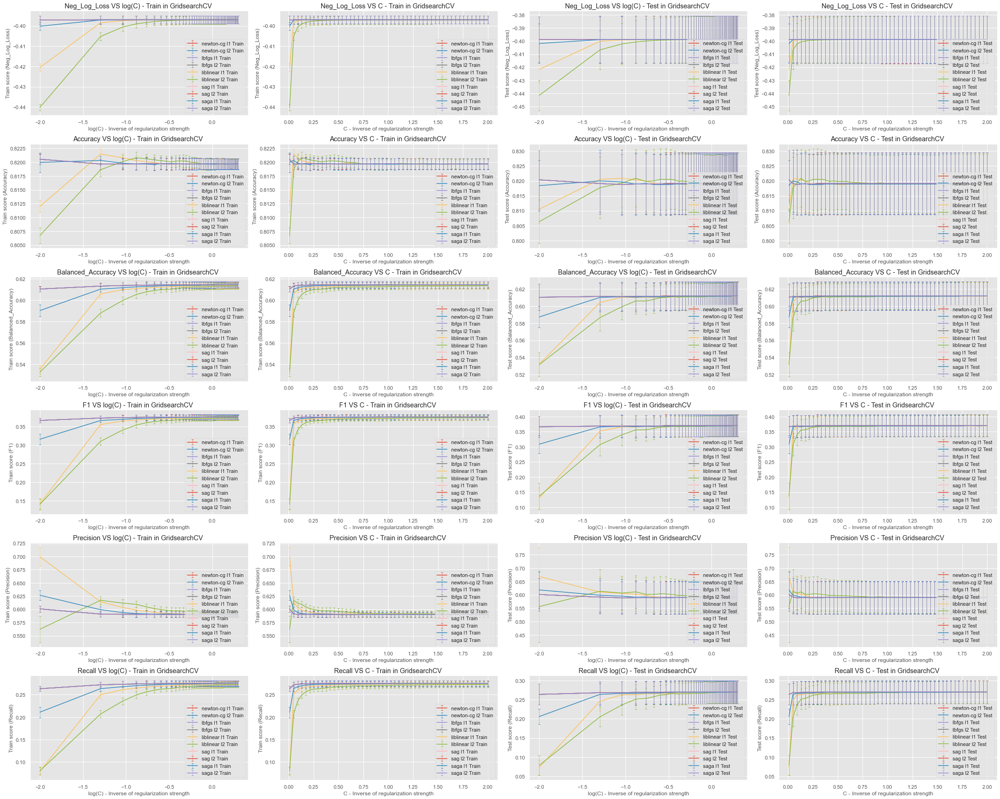

In [151]:
Xy_train_bat = X_y_train_8_9 # batch 89
opt_solver_8_lgls, opt_penalty_8_lgls, opt_c_8_lgls = vis_performances(Xy_train_bat)

- Batch 910 -> Tuned_OLR_9

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.36756175010684666
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.8379292695711159
best hyperparameters: {'C': 0.9440816326530612, 'penalty': 'l1', 'solver': 'liblinear'}
LogisticRegression(C=0.9440816326530612, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.6094706640876855
best hyperparameters: {'C': 0.9440816326530612, 'penalty': 'l1', 'solver': 'liblinear'}
LogisticRegression(C=0.9440816326530612, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='liblinear')
---------------------------f1---------------------------
best

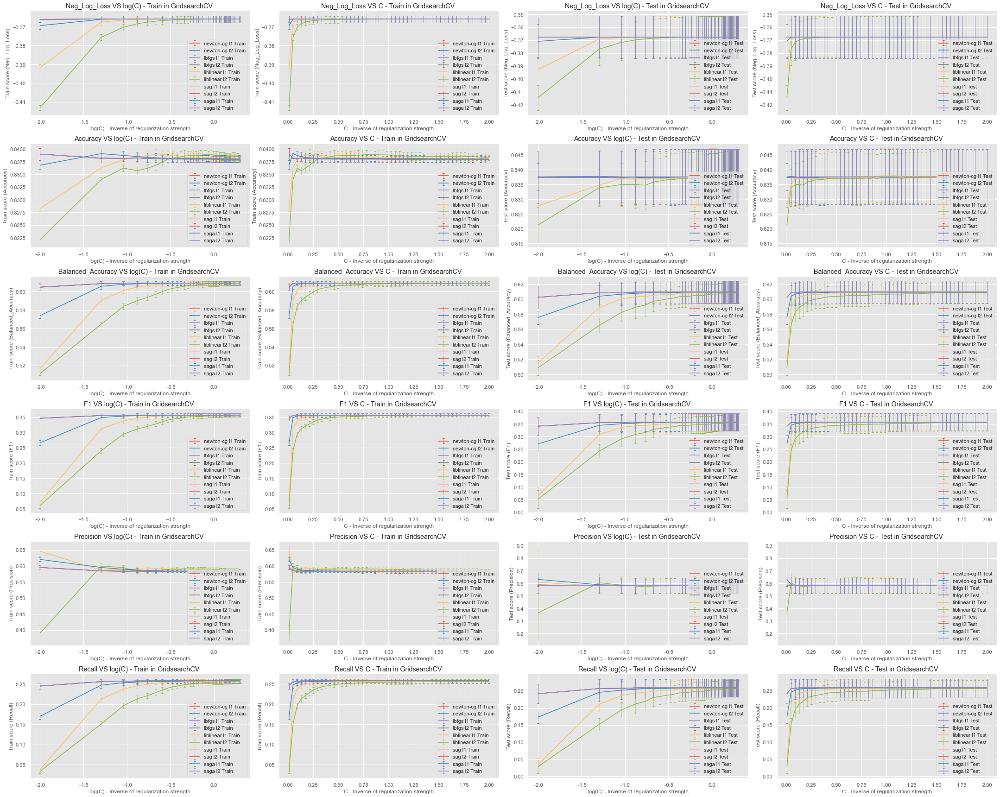

In [152]:
Xy_train_bat = X_y_train_9_10 # batch 910
opt_solver_9_lgls, opt_penalty_9_lgls, opt_c_9_lgls = vis_performances(Xy_train_bat)

- Batch 1011 -> Tuned_OLR_10

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.29991914925023394
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.880773903123362
best hyperparameters: {'C': 0.2536734693877551, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.2536734693877551, max_iter=1000, n_jobs=-1,
                   solver='newton-cg')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.5738145068537059
best hyperparameters: {'C': 0.2536734693877551, 'penalty': 'l2', 'solver': 'sag'}
LogisticRegression(C=0.2536734693877551, max_iter=1000, n_jobs=-1, solver='sag')
---------------------------f1---------------------------
best f1 score: 0.2557226664609741
best hyperparameters: {'C': 0.

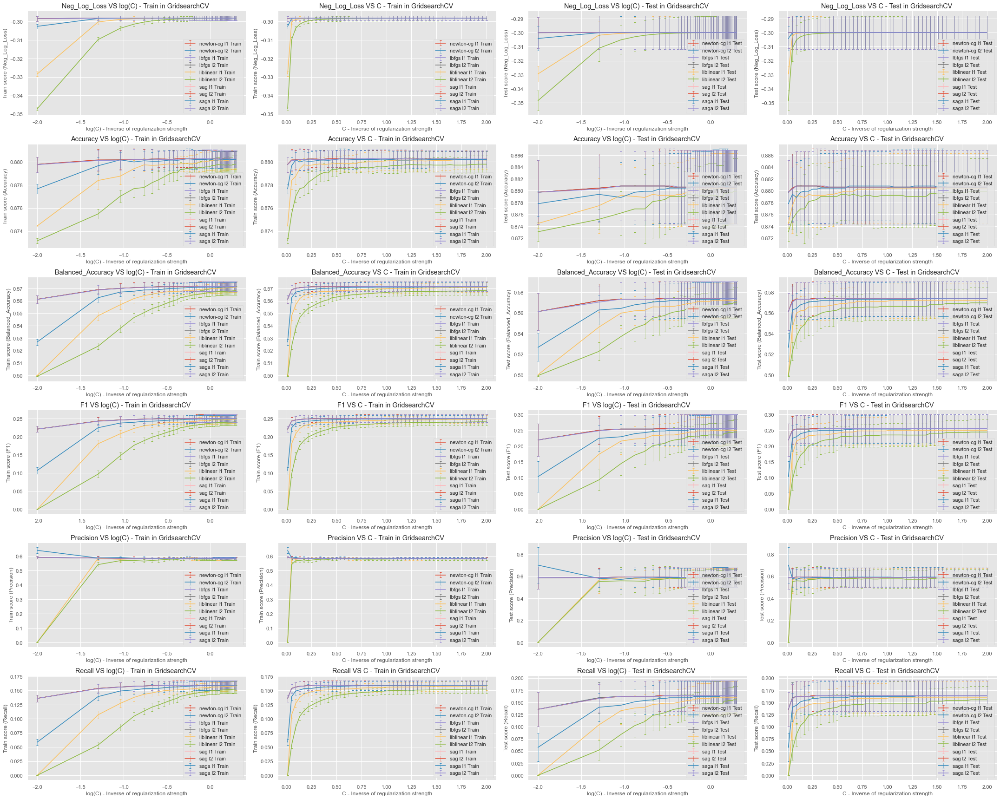

In [153]:
Xy_train_bat = X_y_train_10_11 # batch 1011
opt_solver_10_lgls, opt_penalty_10_lgls, opt_c_10_lgls = vis_performances(Xy_train_bat)

- Batch 1112 -> Tuned_OLR_11

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.23402367858608733
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.9123796750223538
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l1', 'solver': 'liblinear'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   penalty='l1', solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.5495740852816677
best hyperparameters: {'C': 0.17244897959183675, 'penalty': 'l2', 'solver': 'newton-cg'}
LogisticRegression(C=0.17244897959183675, max_iter=1000, n_jobs=-1,
                   solver='newton-cg')
---------------------------f1---------------------------
best f1 score:

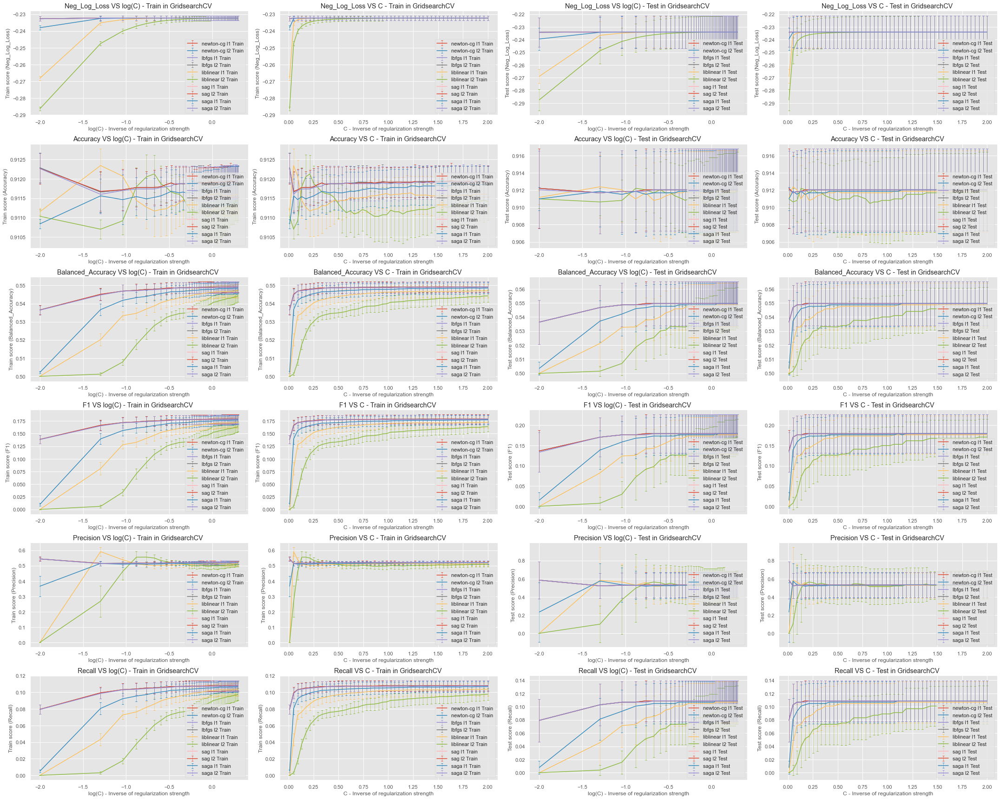

In [154]:
Xy_train_bat = X_y_train_11_12 # batch 1112
opt_solver_11_lgls, opt_penalty_11_lgls, opt_c_11_lgls = vis_performances(Xy_train_bat)

- Batch 1213 -> Tuned_OLR_12

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.15037573436418322
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'sag'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='sag')
---------------------------accuracy---------------------------
best accuracy score: 0.9545216292048222
best hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.5017389148604618
best hyperparameters: {'C': 1.2689795918367348, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=1.2689795918367348, max_iter=1000, n_jobs=-1,
                   solver='liblinear')
---------------------------f1---------------------------
best f1 score: 0.0071428571428571435
best hyperp

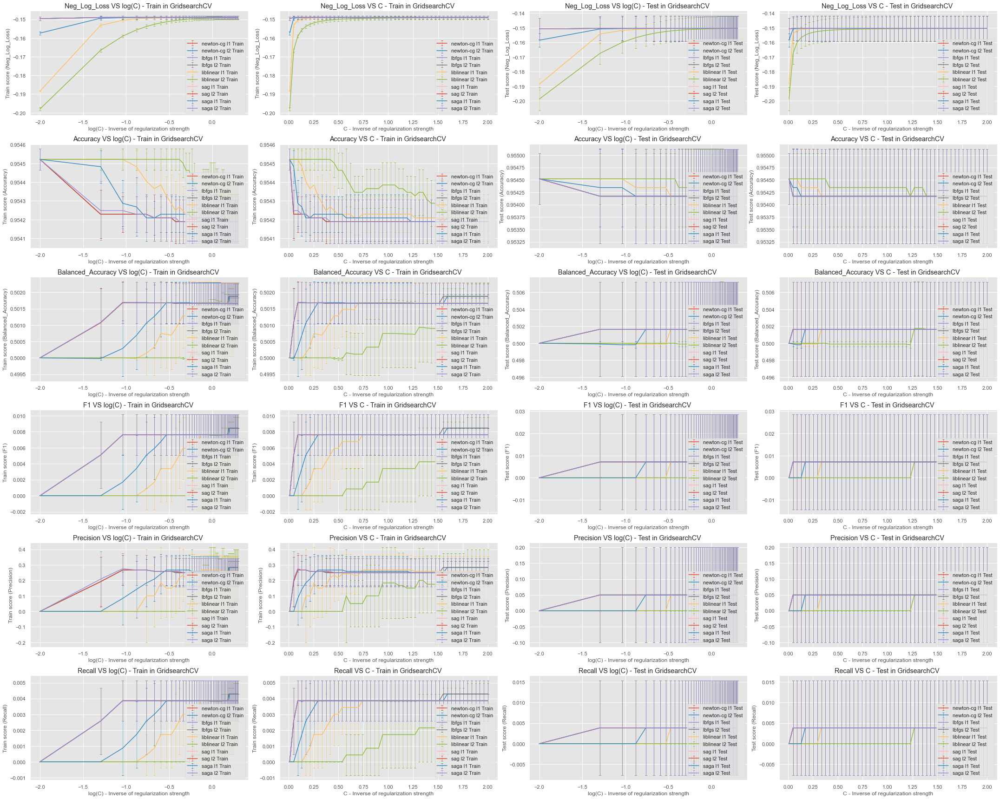

In [155]:
Xy_train_bat = X_y_train_12_13 # batch 1213
opt_solver_12_lgls, opt_penalty_12_lgls, opt_c_12_lgls = vis_performances(Xy_train_bat)

- Batch 1314 -> Tuned_OLR_13

---------------------------neg_log_loss---------------------------
best neg_log_loss score: -0.08137274513189299
best hyperparameters: {'C': 0.05061224489795919, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=0.05061224489795919, max_iter=1000, n_jobs=-1,
                   solver='saga')
---------------------------accuracy---------------------------
best accuracy score: 0.9810362901982549
best hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='liblinear')
---------------------------balanced_accuracy---------------------------
best balanced_accuracy score: 0.5
best hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
LogisticRegression(C=0.01, max_iter=1000, n_jobs=-1, penalty='l1',
                   solver='liblinear')
---------------------------f1---------------------------
best f1 score: 0.0
best hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solv

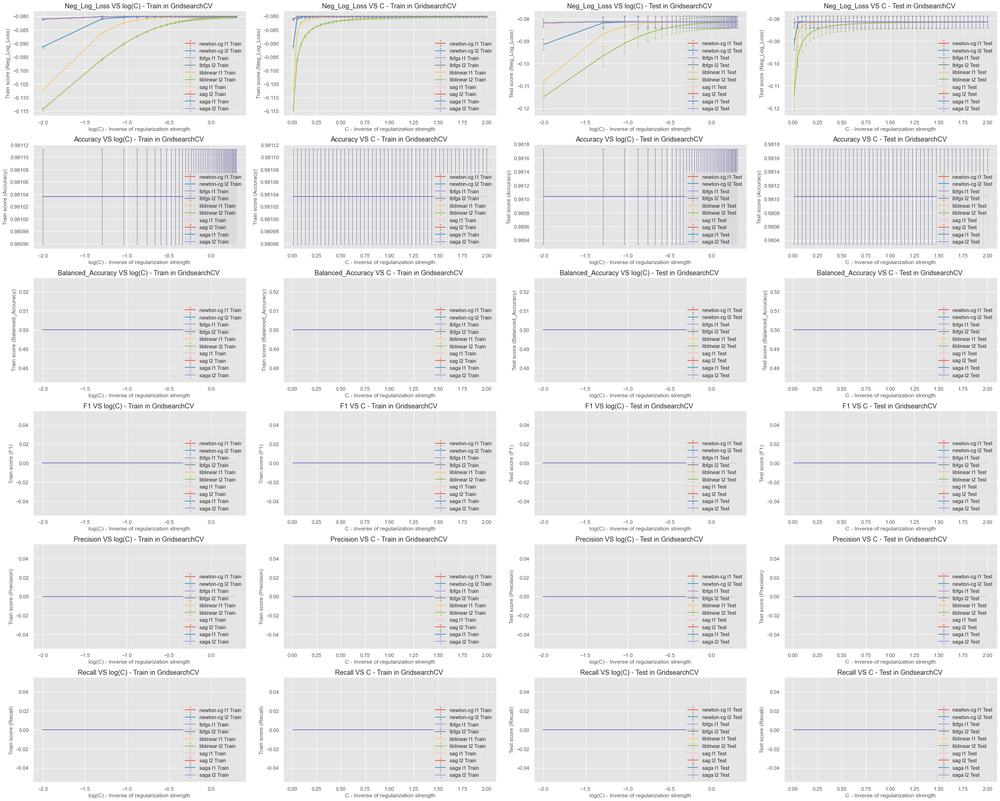

In [156]:
Xy_train_bat = X_y_train_13_14 # batch 1314
opt_solver_13_lgls, opt_penalty_13_lgls, opt_c_13_lgls = vis_performances(Xy_train_bat)

- Summary

In [157]:
opt_solver_list = [opt_solver_0_lgls, opt_solver_1_lgls, opt_solver_2_lgls, opt_solver_3_lgls, opt_solver_4_lgls, opt_solver_5_lgls, opt_solver_6_lgls, 
                  opt_solver_7_lgls, opt_solver_8_lgls, opt_solver_9_lgls, opt_solver_10_lgls, opt_solver_11_lgls, opt_solver_12_lgls, opt_solver_13_lgls]
opt_penalty_list = [opt_penalty_0_lgls, opt_penalty_1_lgls, opt_penalty_2_lgls, opt_penalty_3_lgls, opt_penalty_4_lgls, opt_penalty_5_lgls, opt_penalty_6_lgls,
                    opt_penalty_7_lgls, opt_penalty_8_lgls, opt_penalty_9_lgls, opt_penalty_10_lgls, opt_penalty_11_lgls, opt_penalty_12_lgls, opt_penalty_13_lgls]
opt_c_list = [opt_c_0_lgls, opt_c_1_lgls, opt_c_2_lgls, opt_c_3_lgls, opt_c_4_lgls, opt_c_5_lgls, opt_c_6_lgls,
              opt_c_7_lgls, opt_c_8_lgls, opt_c_9_lgls, opt_c_10_lgls, opt_c_11_lgls, opt_c_12_lgls, opt_c_13_lgls]
print(
'''
- Performance Measures:
As expected, accuracy, f1, precision and recall tend to be a straight line after batch 1011, which can be more
specific in diagram with log(C) as x-axis, that is because of the imbalanced data. And eventually these 4 
performance measures become a straight line in the last batch, where precision, recall and f1 are all 0. This 
means that all classifications in last batch are 0, so logloss is needed in this case to evaluate the the model 
predict probability.

- Final 14 Optimal models for 14 batches:
    - Batches       - Model Name       - Hyperparameter
                                         (solver, penalty, c)
    ------------------------------------------------------------------------------------------------------
    - Batch 01      - Tuned_OLR_0      - {} - {} - {}
    - Batch 12      - Tuned_OLR_1      - {} - {} - {}
    - Batch 23      - Tuned_OLR_2      - {} - {} - {}
    - Batch 34      - Tuned_OLR_3      - {} - {} - {}
    - Batch 45      - Tuned_OLR_4      - {} - {} - {}
    - Batch 56      - Tuned_OLR_5      - {} - {} - {}
    - Batch 67      - Tuned_OLR_6      - {} - {} - {}
    - Batch 78      - Tuned_OLR_7      - {} - {} - {}
    - Batch 89      - Tuned_OLR_8      - {} - {} - {}
    - Batch 910     - Tuned_OLR_9      - {} - {} - {}
    - Batch 1011    - Tuned_OLR_10     - {} - {} - {}
    - Batch 1112    - Tuned_OLR_11     - {} - {} - {}
    - Batch 1213    - Tuned_OLR_12     - {} - {} - {}
    - Batch 1314    - Tuned_OLR_13     - {} - {} - {}
'''.format(opt_solver_0_lgls, opt_penalty_0_lgls, opt_c_0_lgls,
           opt_solver_1_lgls, opt_penalty_1_lgls, opt_c_1_lgls,
           opt_solver_2_lgls, opt_penalty_2_lgls, opt_c_2_lgls,
           opt_solver_3_lgls, opt_penalty_3_lgls, opt_c_3_lgls,
           opt_solver_4_lgls, opt_penalty_4_lgls, opt_c_4_lgls,
           opt_solver_5_lgls, opt_penalty_5_lgls, opt_c_5_lgls,
           opt_solver_6_lgls, opt_penalty_6_lgls, opt_c_6_lgls,
           opt_solver_7_lgls, opt_penalty_7_lgls, opt_c_7_lgls,
           opt_solver_8_lgls, opt_penalty_8_lgls, opt_c_8_lgls,
           opt_solver_9_lgls, opt_penalty_9_lgls, opt_c_9_lgls,
           opt_solver_10_lgls, opt_penalty_10_lgls, opt_c_10_lgls,
           opt_solver_11_lgls, opt_penalty_11_lgls, opt_c_11_lgls,
           opt_solver_12_lgls, opt_penalty_12_lgls, opt_c_12_lgls,
           opt_solver_13_lgls, opt_penalty_13_lgls, opt_c_13_lgls)
)


- Performance Measures:
As expected, accuracy, f1, precision and recall tend to be a straight line after batch 1011, which can be more
specific in diagram with log(C) as x-axis, that is because of the imbalanced data. And eventually these 4 
performance measures become a straight line in the last batch, where precision, recall and f1 are all 0. This 
means that all classifications in last batch are 0, so logloss is needed in this case to evaluate the the model 
predict probability.

- Final 14 Optimal models for 14 batches:
    - Batches       - Model Name       - Hyperparameter
                                         (solver, penalty, c)
    ------------------------------------------------------------------------------------------------------
    - Batch 01      - Tuned_OLR_0      - lbfgs - l2 - 0.05061224489795919
    - Batch 12      - Tuned_OLR_1      - saga - l2 - 0.05061224489795919
    - Batch 23      - Tuned_OLR_2      - sag - l2 - 0.05061224489795919
    - Batch 34      - Tun

### 4.4 Construct the Optimal Ordinal Logistic Regression Algorithm

    - Algorithm: 
        - input: (data)
        - separate 14 batches for OLRs
        - create 14 tuned optimal OLR models 
        - fit 14 batches to 14 model and make prediction
        - extract each model weight then use power(e, w) to transfer to feature importance
        - calculate probabilility of each class then construct a dataframe
        - calculate the classification for each sample then put in dataframe
        - output: (probability and classification)

- Function to separate 14 batches for OLR Algorithm

In [158]:
def separate_batches(testdata, upperbound, train_data = X_y_train):
    X_y_train_batches = train_data.copy()
    X_y_test_batches = testdata.copy()
    # seperate training
    for i in range(len(train_data)):
        if (train_data['Salary_Encoded'].iloc[i] >= upperbound):
            X_y_train_batches['Salary_Encoded'].iloc[i] = 1     
        else:
            X_y_train_batches['Salary_Encoded'].iloc[i] = 0 
    # seperate test
    for i in range(len(testdata)):
        if (testdata['Salary_Encoded'].iloc[i] >= upperbound):
            X_y_test_batches['Salary_Encoded'].iloc[i] = 1     
        else:
            X_y_test_batches['Salary_Encoded'].iloc[i] = 0 

    return X_y_train_batches, X_y_test_batches

- OLR Algorithm

In [159]:
def OLR_Algorithm(testdata, train_data = X_y_train, opt_solver_lst = opt_solver_list, opt_penalty_lst = opt_penalty_list, opt_c_lst = opt_c_list, plot_feat = False):
    
    prob_0_lst = []
    prob_1_lst = []
    feature_importance_lst = []
    
    # copy dataframe
    predict_target_df = testdata.copy(deep=True)
    # construct empty col to store probability of each class
    for i in range(15):
        predict_target_df['P'+str(i)] = 0
    # construct empty col to store score of class for each obseravtion
    predict_target_df['Pred_Salary_Encoded'] = 0
    predict_target_df['Pred_Salary_Buckets'] = 0
    
    # construct empty col to store probability of greater than previous class
    for i in range(1, 15):
        predict_target_df['Pgt'+str(i)] = 0
    
    for i in range(0, 14):
        # separate 14 batches for OLRs, and separate x, y for fitting model
        X_y_tra, X_y_tst = separate_batches(testdata = testdata, upperbound = i+1, train_data = train_data)
        X_tra_bat, y_tra_bat = X_y_tra.iloc[:,:-1], X_y_tra.Salary_Encoded
        
        # create 14 tuned optimal OLR models, fit data, predict on test set, output probability
        Tuned_OLR = LogisticRegression(solver = opt_solver_lst[i], penalty = opt_penalty_lst[i], C = opt_c_lst[i], max_iter = 1000, n_jobs = -1)
        Tuned_OLR.fit(X_tra_bat, y_tra_bat)

        # # calculate predicted probability for ordinal category i of observation j
        if i == 0: # class 0
            for j in range(len(predict_target_df)):
                linear = Tuned_OLR.intercept_[0]
                df_col = X_y_tst.columns.tolist()
                for lin in range(len(df_col)-1):
                    # calculate linear alpha+beta*X
                    linear = linear + Tuned_OLR.coef_[0,lin] * X_y_tst[df_col[lin]].iloc[j]
                # Calculating probability of being equal or larger that class 1
                predict_target_df['Pgt'+str(i+1)].iloc[j] = np.exp(linear) / (1 + np.exp(linear))
                # Calculating probability of class 0
                predict_target_df['P'+str(i)].iloc[j] = 1 - predict_target_df['Pgt'+str(i+1)].iloc[j]
        else: # class 1 - 13
            for j in range(len(predict_target_df)):
                linear = Tuned_OLR.intercept_[0]
                df_col = X_y_tst.columns.tolist()
                for lin in range(len(df_col)-1):
                    # calculate linear alpha+beta*X
                    linear = linear + Tuned_OLR.coef_[0,lin] * X_y_tst[df_col[lin]].iloc[j]
                # Calculating probability of being equal or larger that class i+1 (< 14)
                predict_target_df['Pgt'+str(i+1)].iloc[j] = np.exp(linear) / (1 + np.exp(linear))
                # Calculating probability of class 1 - 13 
                predict_target_df['P'+str(i)].iloc[j] = predict_target_df['Pgt'+str(i)].iloc[j] - predict_target_df['Pgt'+str(i+1)].iloc[j]
        for j in range(len(predict_target_df)): # class 14
            predict_target_df['P14'].iloc[j] = predict_target_df['Pgt14'].iloc[j]

        # store all models coef result for feature importance list
        feature_importance_lst.append(Tuned_OLR.coef_[0])

    # calculate class of each observation
    for i in range(len(predict_target_df)):
        predict_target_df['Pred_Salary_Encoded'].iloc[i] = np.argmax(predict_target_df.loc[:,'P0':'P14'].iloc[i])
        # predict_target_df['Pred_Salary_Encoded'].iloc[i] = float(round(0 * predict_target_df['P0'].iloc[i] + 1 * predict_target_df['P1'].iloc[i] + 2 * predict_target_df['P2'].iloc[i] + 3 * predict_target_df['P3'].iloc[i] + \
        #                                                                4 * predict_target_df['P4'].iloc[i] + 5 * predict_target_df['P5'].iloc[i] + 6 * predict_target_df['P6'].iloc[i] + 7 * predict_target_df['P7'].iloc[i] + \
        #                                                                8 * predict_target_df['P8'].iloc[i] + 9 * predict_target_df['P9'].iloc[i] + 10 * predict_target_df['P10'].iloc[i] + 11 * predict_target_df['P11'].iloc[i] + \
        #                                                                12 * predict_target_df['P12'].iloc[i] + 13 * predict_target_df['P13'].iloc[i] + 14 * predict_target_df['P14'].iloc[i]))

    # predicted res table
    # reverse mapping the predicted salary bucket 
    predict_target_df['Pred_Salary_Buckets'] = predict_target_df['Pred_Salary_Encoded'].map(salary_rbucket)
    predict_res_df = predict_target_df.loc[:,'Salary_Encoded':'Pred_Salary_Buckets']

    # feature importance dataframe
    feat_impor_df = pd.DataFrame(feature_importance_lst, columns = Tuned_OLR.feature_names_in_).apply(lambda x : np.exp(x), axis=1).T

    # plotting feature importance
    if plot_feat == True:
        # feature importance of 14 models
        plt.figure(figsize=(30,8*4))
        gs = gridspec.GridSpec(7, 4)
        for i, cn in enumerate(feat_impor_df.columns):
            ax = plt.subplot(gs[i])
            plt.barh(feat_impor_df.index, feat_impor_df[cn])
            ax.set_xlabel('Feature importance (weight^e)')
            ax.set_title('Model {} Feature Importance'.format(str(cn)))
        # feature importance of section 2 (SelectKBest with chi2)
        plt.subplot(gs[i+1])
        plt.barh(_scores_2[feat_impor_df.index].T.index, _scores_2[feat_impor_df.index].T['scores'], color = 'b')
        plt.title('Section 2 Feature Importance')
        plt.tight_layout()
        plt.show()

    return predict_res_df

### 4.5 Create Feature Importance of Models and Compare with Section 2

Method to extract feature importance:
    - logistic regression equation:
$$
z = w0 + w1x1+ w2x2+ w3x3 + w4x4 + \dots
$$
$$
y = \frac{1}{1+e^{-z}}
$$
So the odd equation is
$$
Odd = \frac{P(y = 1)}{P(y=0)} = e^{w0 + w1x1+ w2x2+ w3x3 + w4x4 + \dots}
$$
Therefore, for feature n, we have
$$
odd(n) = e^n
$$

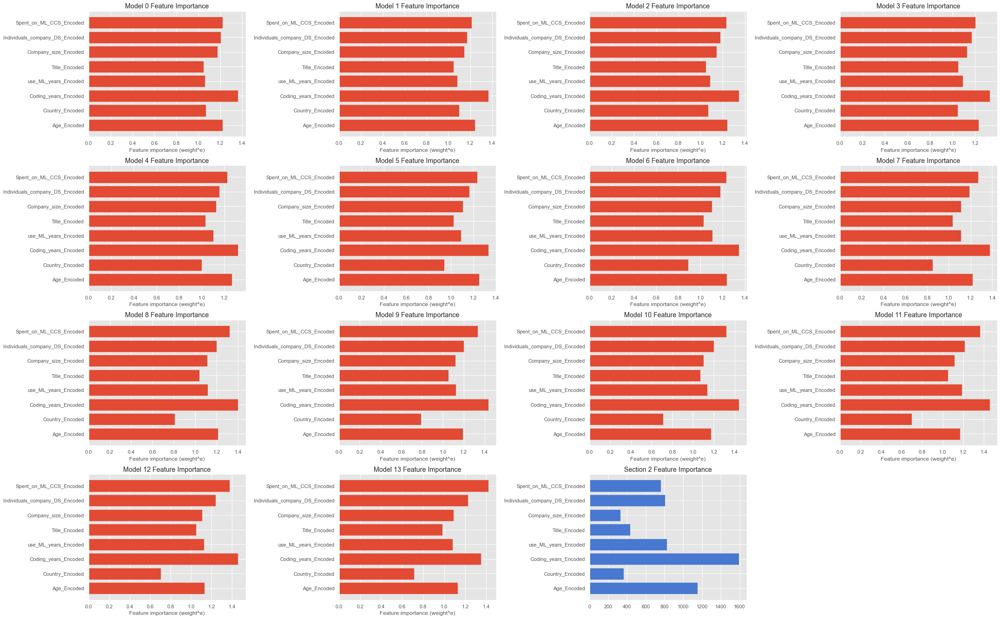

,Salary_Encoded,P0,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,Pred_Salary_Encoded,Pred_Salary_Buckets
172,13.0,0.117281,0.066847,0.085248,0.087096,0.087773,0.093088,0.090726,0.081440,0.068127,0.041040,0.091221,0.037143,0.026471,0.015173,0.011325,0,"0-9,999"
1428,0.0,0.901869,0.038887,0.016708,0.005536,0.005125,0.002332,0.006263,0.006068,0.003782,0.003445,0.002717,0.003602,0.001598,0.000344,0.001725,0,"0-9,999"
2433,10.0,0.050858,0.032879,0.035977,0.050448,0.062488,0.069658,0.052328,0.044782,0.043396,0.027167,0.148485,0.097856,0.136626,0.101863,0.045188,10,"100,000-124,999"
483,8.0,0.120829,0.059613,0.069075,0.064806,0.047590,0.057167,0.046202,0.052739,0.041260,0.033687,0.095272,0.098081,0.114796,0.065909,0.032973,0,"0-9,999"
6368,13.0,0.081404,0.028317,0.040405,0.047725,0.014805,0.035038,0.029475,0.032011,0.009861,0.029209,0.094114,0.079452,0.233231,0.146355,0.098597,12,"150,000-199,999"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4931,11.0,0.431141,0.140229,0.092945,0.055494,0.046321,0.028430,0.032880,0.034756,0.025256,0.019988,0.030530,0.026030,0.017507,0.009152,0.009343,0,"0-9,999"
3264,4.0,0.376950,0.137321,0.077067,0.069061,0.022714,0.042094,0.043596,0.032865,0.019150,0.028609,0.043041,0.041481,0.035869,0.013965,0.016217,0,"0-9,999"
1653,0.0,0.609286,0.119389,0.058689,0.031193,0.036525,0.012750,0.016257,0.016356,0.010758,0.011334,0.013965,0.029123,0.016014,0.010228,0.008133,0,"0-9,999"
2607,4.0,0.202894,0.096921,0.098547,0.086493,0.069380,0.079360,0.075499,0.072803,0.053664,0.038768,0.059236,0.028437,0.019847,0.009048,0.009104,0,"0-9,999"


In [160]:
# input train set, get feature importance figures and classification results
data = X_y_train
predict_res_df_tra = OLR_Algorithm(testdata = data, plot_feat = True)
predict_res_df_tra

In [161]:
print(
'''
Most determining feature and comparsion with feature importance from Section 2:

- By extracting the coefficient (weight of model), feature importances can be calculate by e^w
- From the feature importance graphs of 14 models (red figures)
  Feature Q11 (Coding Years) is the most determining in model prediction.

- And compare to the feature importance obtained in Section 2 (blue figure), the most determining
  feature is the same.
''')


Most determining feature and comparsion with feature importance from Section 2:

- By extracting the coefficient (weight of model), feature importances can be calculate by e^w
- From the feature importance graphs of 14 models (red figures)
  Feature Q11 (Coding Years) is the most determining in model prediction.

- And compare to the feature importance obtained in Section 2 (blue figure), the most determining
  feature is the same.



## 5.Testing & Discussion

### 5.1 Test set prediction

In [162]:
# input test set, get feature importance figures and classification results
data = X_y_test
predict_res_df_tst = OLR_Algorithm(testdata = data, plot_feat = False)
predict_res_df_tst

,Salary_Encoded,P0,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,Pred_Salary_Encoded,Pred_Salary_Buckets
2620,0.0,0.667139,0.110972,0.055296,0.027909,0.019458,0.008824,0.018247,0.017136,0.010841,0.011591,0.013804,0.017257,0.009980,0.004565,0.006979,0,"0-9,999"
6453,13.0,0.099664,0.060338,0.059878,0.054879,0.068066,0.063222,0.026065,0.047157,0.047220,0.024839,0.087744,0.095756,0.140559,0.090314,0.034298,12,"150,000-199,999"
1817,0.0,0.051230,0.023827,0.039066,0.045235,0.057456,0.080853,0.058876,0.072716,0.073665,0.043182,0.162076,0.075688,0.121418,0.067118,0.027594,10,"100,000-124,999"
6709,1.0,0.199705,0.118113,0.069068,0.074401,0.059735,0.037373,0.031225,0.026876,0.015137,0.026389,0.063946,0.088562,0.088967,0.060342,0.040160,0,"0-9,999"
39,5.0,0.216291,0.031900,0.103361,0.063332,0.078837,0.115649,0.074672,0.082391,0.062502,0.031128,0.058828,0.034096,0.030772,0.011700,0.004539,0,"0-9,999"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6383,0.0,0.141691,0.041601,0.077480,0.071565,0.051128,0.077230,0.079845,0.078216,0.056212,0.048113,0.104218,0.065854,0.060821,0.028482,0.017543,0,"0-9,999"
3805,0.0,0.435590,0.140191,0.097422,0.071934,0.064471,0.041399,0.041769,0.028040,0.020178,0.013533,0.024030,0.008510,0.005426,0.002467,0.005040,0,"0-9,999"
2887,7.0,0.079540,0.051561,0.058249,0.080246,0.062568,0.084173,0.096830,0.085018,0.069517,0.061093,0.135550,0.047895,0.042899,0.021273,0.023587,10,"100,000-124,999"
2368,9.0,0.068034,0.052668,0.038821,0.054007,0.042489,0.031125,0.019175,0.015103,0.005165,0.013834,0.074442,0.103569,0.188709,0.183026,0.109833,12,"150,000-199,999"


### 5.2 Model performance on training set vs test set

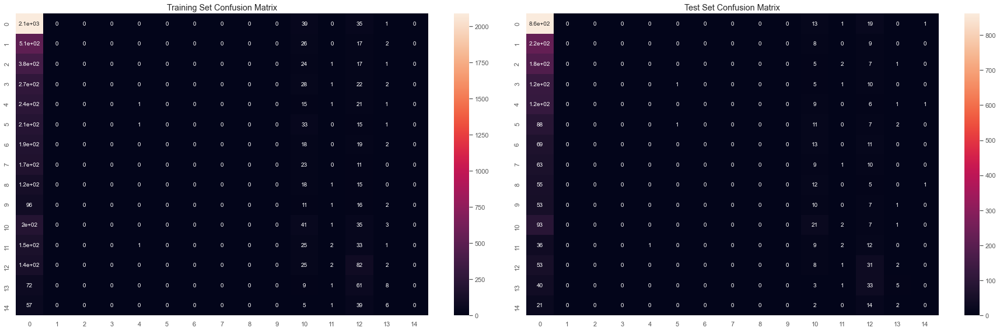

Class 	Train_True 	Train_Predict 	Test_True 	Test_Predict
0 	 2163 		 4870 		 895 		 2083
1 	 552 		 0 		 240 		 0
2 	 418 		 0 		 196 		 0
3 	 322 		 0 		 142 		 0
4 	 282 		 3 		 139 		 1
5 	 257 		 0 		 109 		 2
6 	 225 		 0 		 93 		 0
7 	 206 		 0 		 83 		 0
8 	 149 		 0 		 73 		 0
9 	 126 		 0 		 71 		 0
10 	 280 		 340 		 124 		 138
11 	 209 		 12 		 60 		 11
12 	 247 		 438 		 95 		 188
13 	 151 		 32 		 82 		 15
14 	 108 		 0 		 39 		 3


In [163]:
# Use confusion matrix to check performance on each dataset
labels = [i for i in range(15)]
y_pred_tra = predict_res_df_tra.Pred_Salary_Encoded
y_true_tst = predict_res_df_tra.Salary_Encoded
y_pred_tst = predict_res_df_tst.Pred_Salary_Encoded
y_true_tra = predict_res_df_tst.Salary_Encoded

C_tra = confusion_matrix(y_true_tst, y_pred_tra, labels=labels)
C_tst = confusion_matrix(y_true_tra, y_pred_tst, labels=labels)

plt.figure(figsize=(25,8))
plt.subplot(1,2,1)
sns.heatmap(C_tra,annot=True)
plt.title('Training Set Confusion Matrix')

plt.subplot(1,2,2)
sns.heatmap(C_tst,annot=True)
plt.title('Test Set Confusion Matrix')

plt.tight_layout()
plt.show()

# show predict and true counts
print('Class \tTrain_True \tTrain_Predict \tTest_True \tTest_Predict')
for i in range(15):
    print('{} \t {} \t\t {} \t\t {} \t\t {}'.format(i, (y_true_tst == i).sum(), (y_pred_tra == i).sum(), (y_true_tra == i).sum(), (y_pred_tst == i).sum()))


In [164]:
print(
'''
Models perform similar between test set and training set, both are not very well, that is because of the imbalanced 
data and more features are needed. Despite the fact that all the remaining features for model training are significant, 
however, these features fail to explain the entire algorithm models. It can be improved by adding more features. 
For now, models are underfitting.
'''
)


Models perform similar between test set and training set, both are not very well, that is because of the imbalanced 
data and more features are needed. Despite the fact that all the remaining features for model training are significant, 
however, these features fail to explain the entire algorithm models. It can be improved by adding more features. 
For now, models are underfitting.



### 5.3 Distribution of True Target and Predictions on Training Set and Test Set

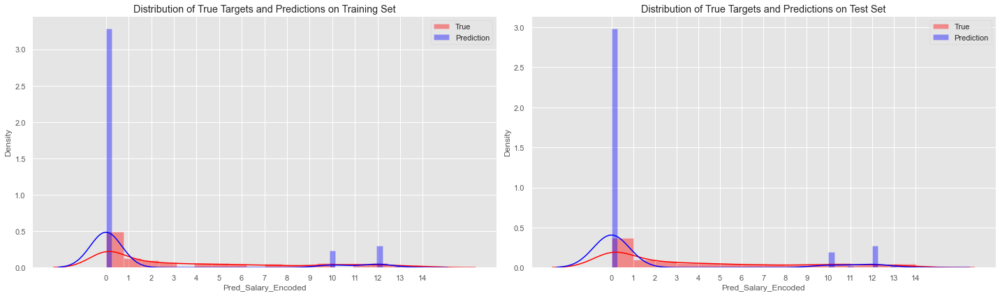

In [165]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.title('Distribution of True Targets and Predictions on Training Set')
sns.distplot(y_true_tst, color= 'red', label = 'True')
sns.distplot(y_pred_tra, color = 'blue', label = 'Prediction')
plt.xticks([i for i in range(15)])
plt.legend()

plt.subplot(1,2,2)
plt.title('Distribution of True Targets and Predictions on Test Set')
sns.distplot(y_true_tra, color= 'red', label = 'True')
sns.distplot(y_pred_tst, color = 'blue', label = 'Prediction')
plt.xticks([i for i in range(15)])
plt.legend()

plt.tight_layout()
plt.show()

- Insight from dataset and trained model

In [166]:
print(
'''
For binary classification problems, such as salary is only a classification of 0 and 1, binary logistic regression 
can be used to analyze the relationship between outcome variables and independent variables, and the results are 
very easy to interpret. But for the ordered multi-classification problem, such as the salary in the data is divided 
into 14 levels, another method needs to be applied to complete the analysis between variables, which is Ordinal 
Logistic Regression. So in the data, features are independent variables, and salary target is dependent variable. 
First, missing data need to be cleaned by setting threshold, such as a feature will be removed if it has more than 
30% missing values. Then since all features are categorical values, encoding is needed, and since categorical data 
is transferred to numerical data, which makes all features to a similar scale, so normalisation is not needed. 
After that, feature engineering is applied. 4 methods are adopted, which are Variances Threshold, SelectKBest with Chi2, 
PCA and GBDT, but only SelectKBest with Chi2 is selected for feature selection since the correlation between independent 
and dependent variables is more important. Then training set is sequentially divided by two from low ordinal level to 
high level. The model is implemented by 14 submodels, each model corresponds to a batch gain from the previous step. 
And then each model is tuned by using gridsearchcv with 3 hyperparameters: solver, penalty and inverse of regularization 
strength. Then by calculating accumulative probability with the logit function, P(n>=1) is calculated. Then P(n) of each 
observation falling into each ordinal category and the classification of each observation are computed. However, due to 
the imbalanced dataset and lack of features, models are underfitting. It can be improved by adding more features and 
oversampling and undersampling.
'''
)


For binary classification problems, such as salary is only a classification of 0 and 1, binary logistic regression 
can be used to analyze the relationship between outcome variables and independent variables, and the results are 
very easy to interpret. But for the ordered multi-classification problem, such as the salary in the data is divided 
into 14 levels, another method needs to be applied to complete the analysis between variables, which is Ordinal 
Logistic Regression. So in the data, features are independent variables, and salary target is dependent variable. 
First, missing data need to be cleaned by setting threshold, such as a feature will be removed if it has more than 
30% missing values. Then since all features are categorical values, encoding is needed, and since categorical data 
is transferred to numerical data, which makes all features to a similar scale, so normalisation is not needed. 
After that, feature engineering is applied. 4 methods are adopted, which are Var